In [1]:
import os
import json
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import cv2

# Background

In this notebook we visualize time series data generated by OpenPose and the Video2Data pipeline.

# Functions

In [2]:
N_FRAMES = 15
Y_CHANGE_TRESH = 0.15

def get_frame_range(openpose_dict):
    
    # Convert knee data to data frame
    df = pd.DataFrame(openpose_dict['LKnee'])
    df = df[df.conf > 0] # Remove any frames where LKnee 
    y_vals = df['y'].tolist()
    
    # Calculate a rolling percent change in y of the knee
    rolling_perc_change_y = []
    for i, y in enumerate(y_vals):
        if i != len(y_vals) - 1:
            change = abs(y_vals[i+1] - y_vals[i])/y_vals[i]
            rolling_perc_change_y.append(change)
            
    # Determine if y changes by more than 15% from any frame to the next (if so save frame number)
    outlier_frame = 0
    change_y_thresh = Y_CHANGE_TRESH
    for i, perc_change_y in enumerate(rolling_perc_change_y, 1):
        if perc_change_y > change_y_thresh:
            outlier_frame = i-1
            break
    
    # If y changes by more than 15%, subset df
    if outlier_frame:
        df = df.head(outlier_frame)
    
    # Set the end frame at which y is minimum (this is the leg kick frame)
    end_frame = df[df.y == min(df.y)]['frame'].tolist()[0]
    start_frame = end_frame - (N_FRAMES-1) # Include n_frames from 
    
    return start_frame, end_frame


def get_frame_range_index(openpose_dict, start_frame):
    
    # Find frame where LKnee is highest
    # NOTE: Origin of image is top left, so y is reversed (y_min = y when knee is highest)
    frame_list = openpose_dict['LKnee']['frame']
    start_idx = 0
    for i, frame in enumerate(frame_list):
        if frame == start_frame:
            start_idx = i
            break
        else:
            continue
    assert(openpose_dict['LKnee']['frame'][start_idx] == start_frame)
    end_idx = start_idx + (N_FRAMES-1)
    
    
def images_to_mp4(image_dir, video_path, file_ext):
    
    # Set up inputs
    images = [file for file in os.listdir(image_dir) if file_ext in file]
    images = sorted(images, key=lambda x: int(x.split("-")[-1].split(file_ext)[0])) # Sorted
    frame = cv2.imread(os.path.join(image_dir, images[0]))
    height, width, layers = frame.shape
    
    # Set up writer
    fourcc = cv2.VideoWriter_fourcc('m', 'p', '4', 'v')
    video = cv2.VideoWriter(video_path, fourcc, 10, (width,height))
    
    # Write to mp4
    for image in images:
        video.write(cv2.imread(os.path.join(image_dir, image)))
    
    # Close
    cv2.destroyAllWindows()
    video.release()


# Time Series Visualization
Plots showing x and y coordinates of the LKnee keypoint over time for a selection of Tyler Glasnow videos. All data is from the Video2Data pipeline.

Video 1
End frame: 30


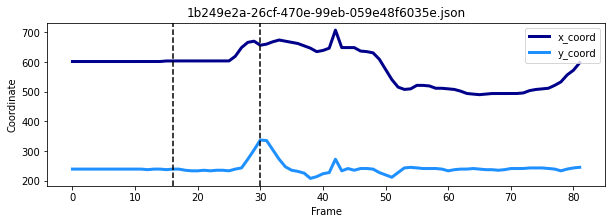

Video 2
End frame: 32


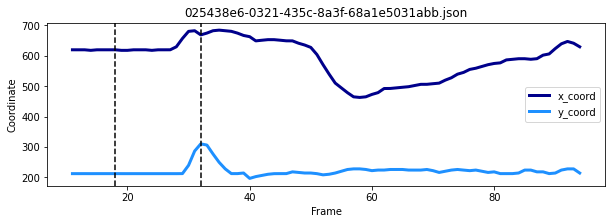

Video 3
End frame: 9
Not enough frames before knee kick.

Video 4
End frame: 30


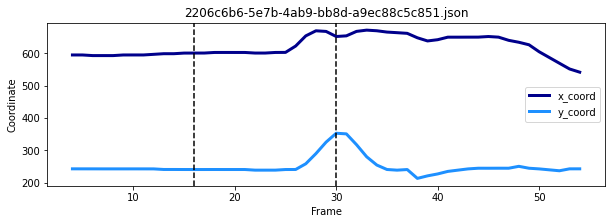

Video 5
End frame: 32


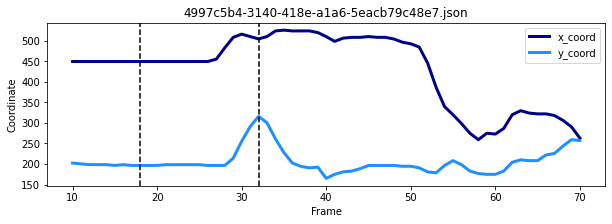

Video 6
End frame: 32


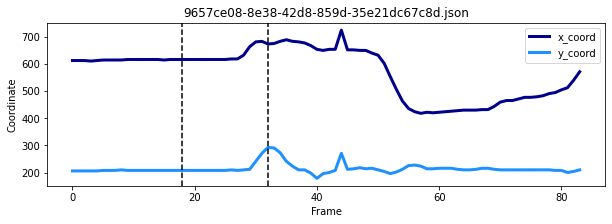

Video 7
End frame: 30


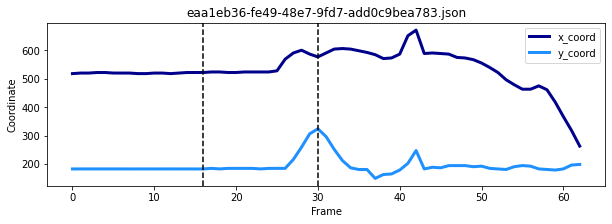

Video 8
End frame: 31
Not enough frames before knee kick.

Video 9
End frame: 32
Not enough frames before knee kick.

Video 10
End frame: 32


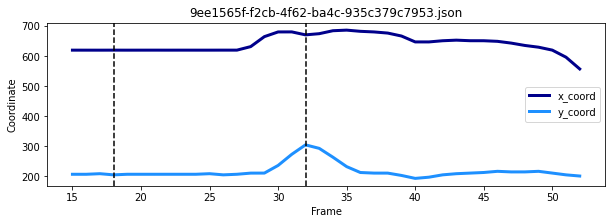

Video 11
End frame: 32
Not enough frames before knee kick.

Video 12
End frame: 44
Not enough frames before knee kick.

Video 13
End frame: 32


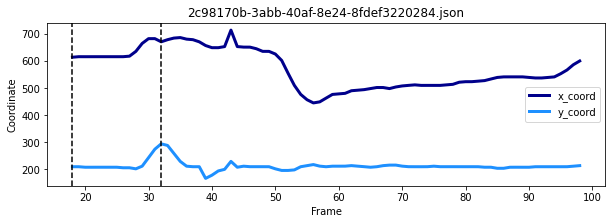

Video 14
End frame: 31


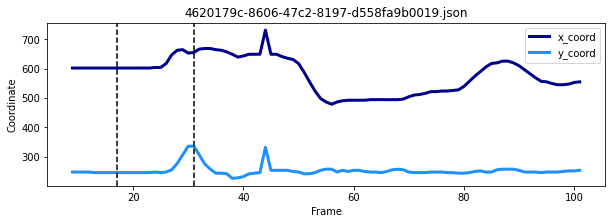

Video 15
End frame: 30


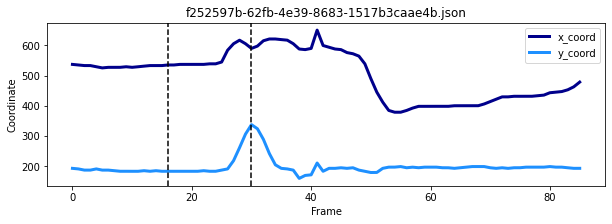

Video 16
End frame: 31


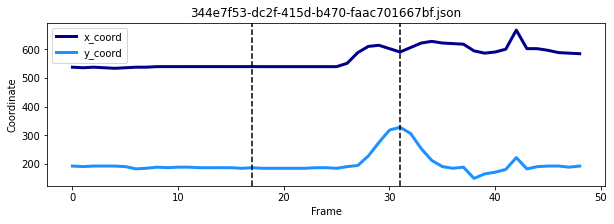

Video 17
End frame: 32


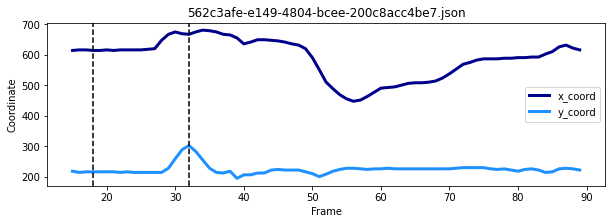

Video 18
End frame: 32


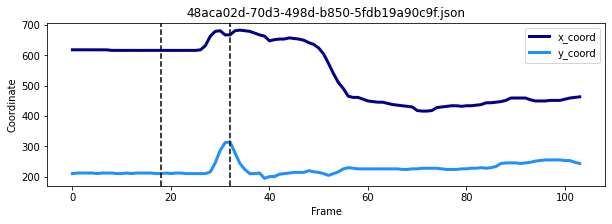

Video 19
End frame: 31


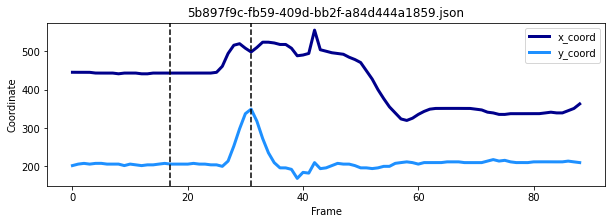

Video 20
End frame: 33


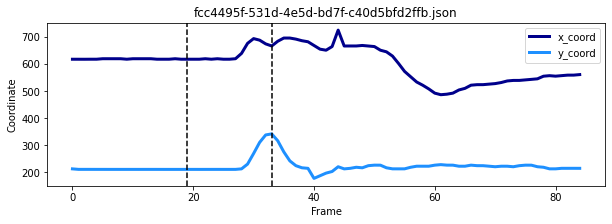

Video 21
End frame: 29


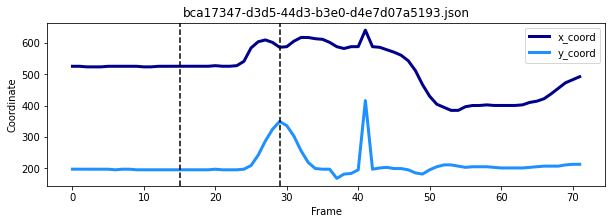

Video 22
End frame: 31


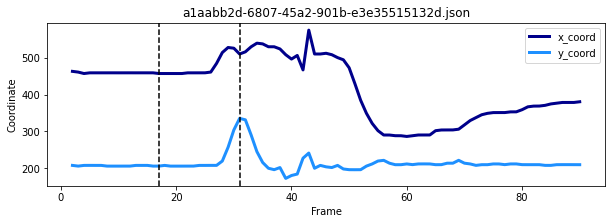

Video 23
End frame: 30


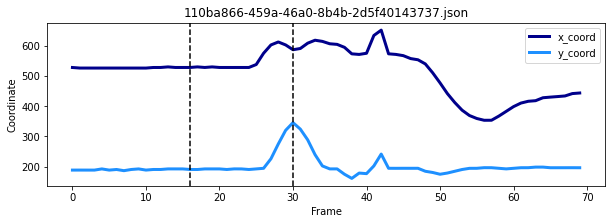

Video 24
End frame: 31
Not enough frames before knee kick.

Video 25
End frame: 32


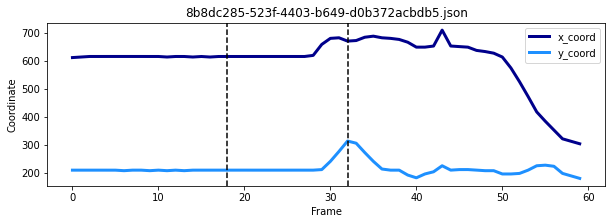

Video 26
End frame: 32
Not enough frames before knee kick.

Video 27
End frame: 31


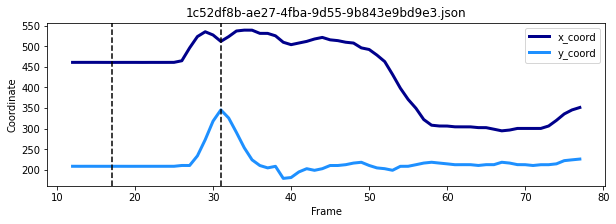

Video 28
End frame: 30


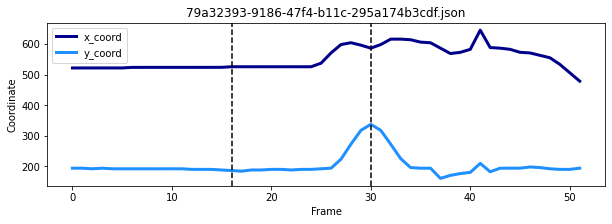

Video 29
End frame: 33


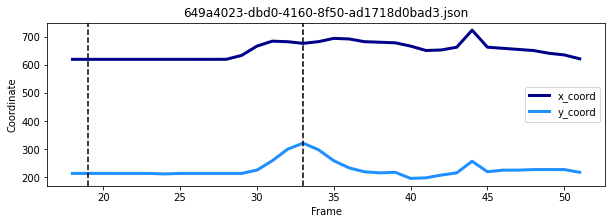

Video 30
End frame: 32
Not enough frames before knee kick.

Video 31
End frame: 33


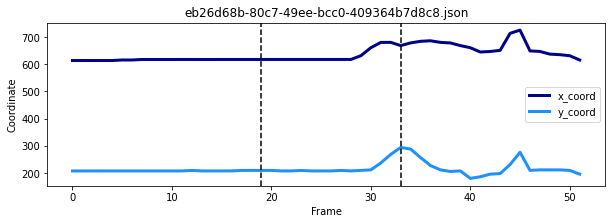

Video 32
End frame: 32


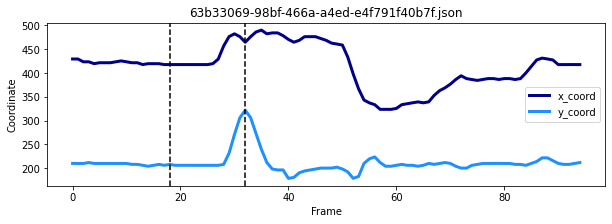

Video 33
End frame: 31


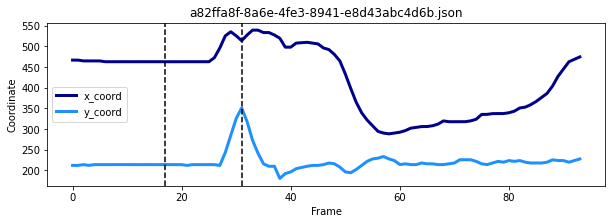

Video 34
End frame: 30


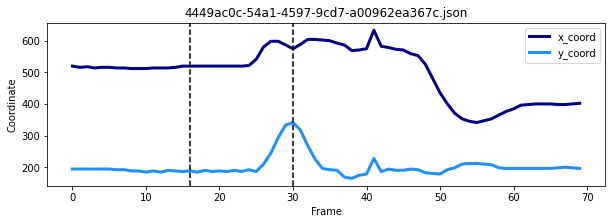

Video 35
End frame: 55


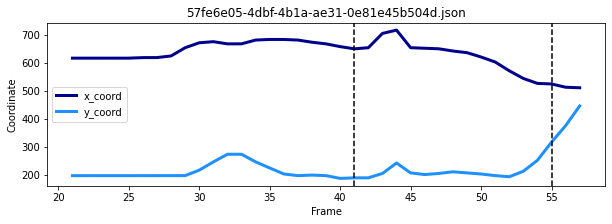

Video 36
End frame: 2
Not enough frames before knee kick.

Video 37
End frame: 32
Not enough frames before knee kick.

Video 38
End frame: 33
Not enough frames before knee kick.

Video 39
End frame: 33


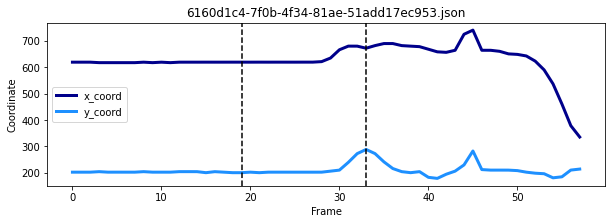

Video 40
End frame: 32


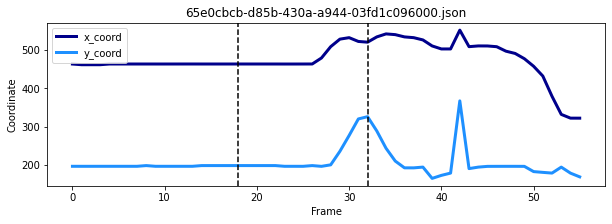

Video 41
End frame: 33


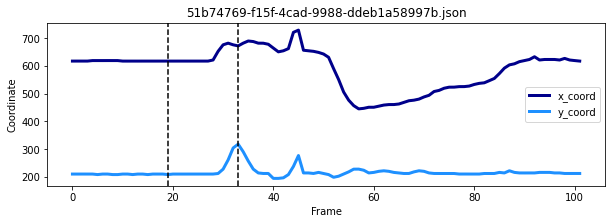

Video 42
End frame: 33
Not enough frames before knee kick.

Video 43
End frame: 33


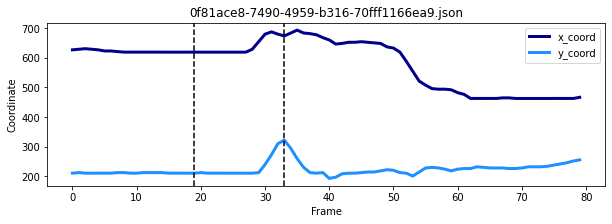

Video 44
End frame: 33


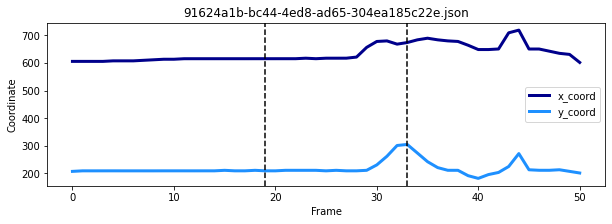

Video 45
End frame: 32


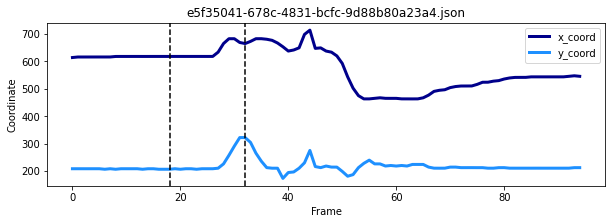

Video 46
End frame: 33


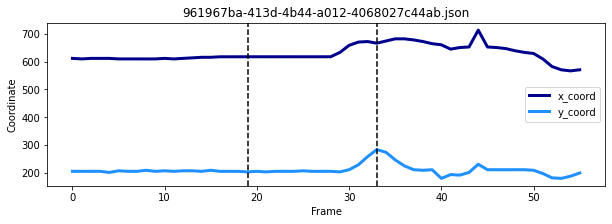

Video 47
End frame: 31


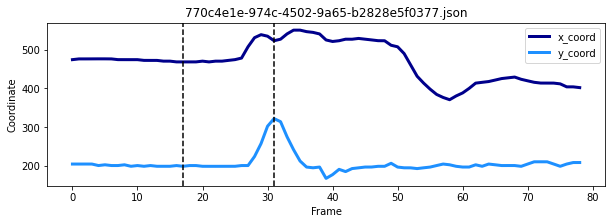

Video 48
End frame: 32


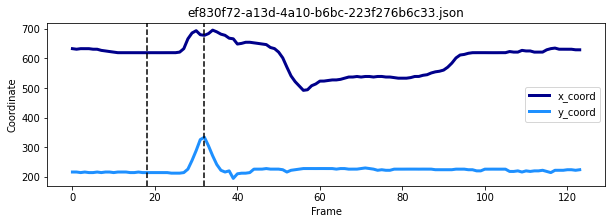

Video 49
End frame: 32
Not enough frames before knee kick.

Video 50
End frame: 32


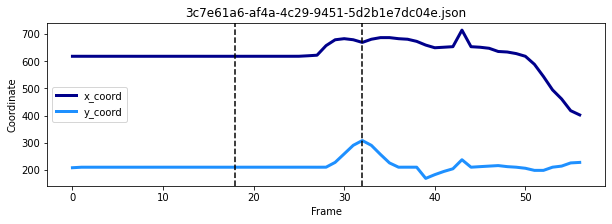

Video 51
End frame: 32


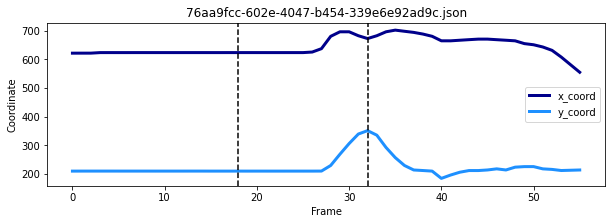

Video 52
End frame: 30


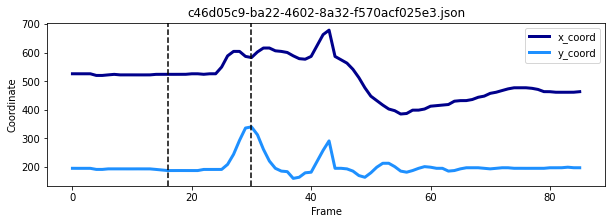

Video 53
End frame: 33


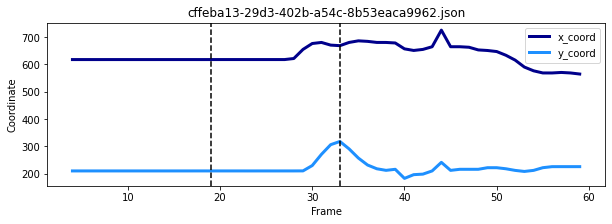

Video 54
End frame: 32
Not enough frames before knee kick.

Video 55
End frame: 32


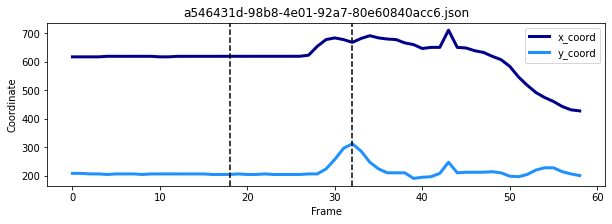

Video 56
End frame: 32


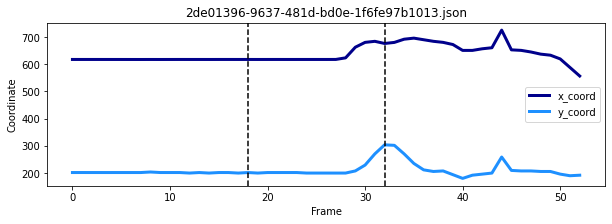

Video 57
End frame: 31


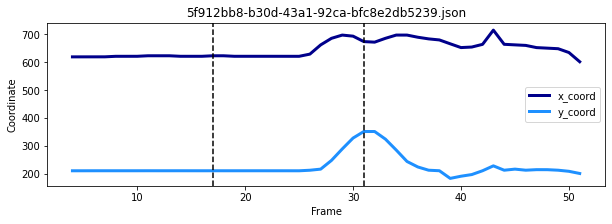

Video 58
End frame: 33


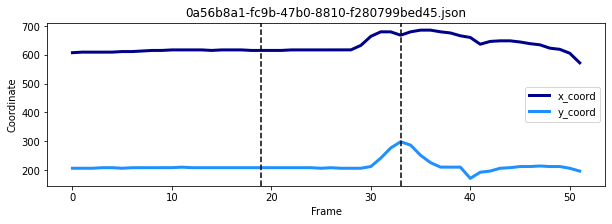

Video 59
End frame: 28


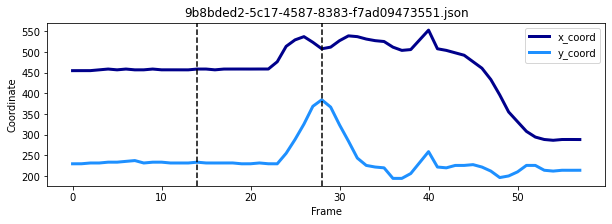

Video 60
End frame: 31


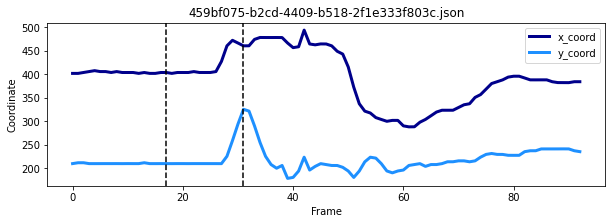

Video 61
End frame: 31


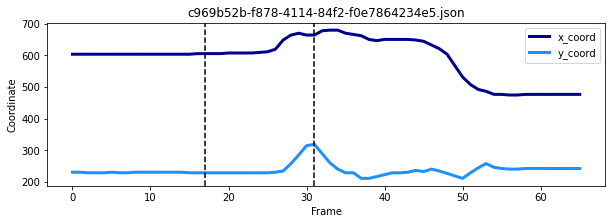

Video 62
End frame: 31


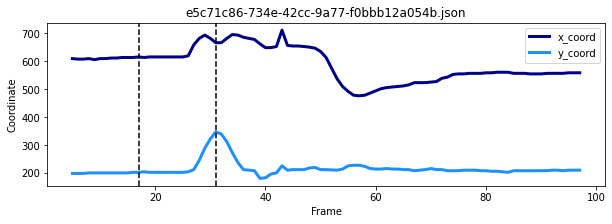

Video 63
End frame: 33


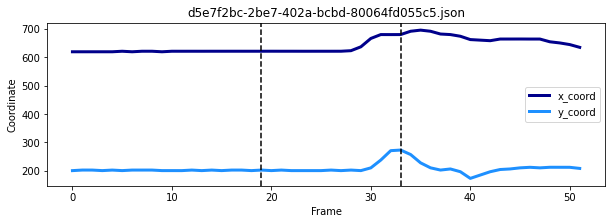

Video 64
End frame: 32


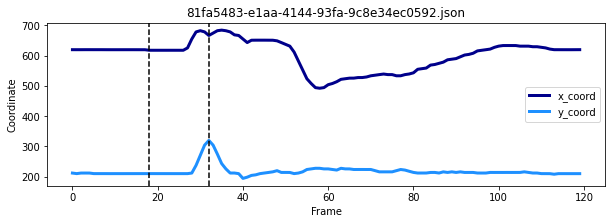

Video 65
End frame: 30


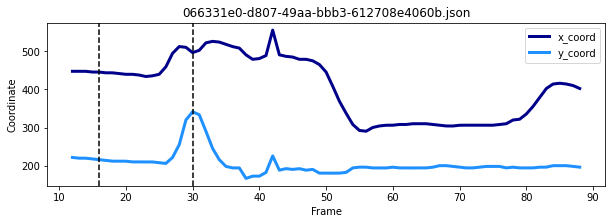

Video 66
End frame: 30


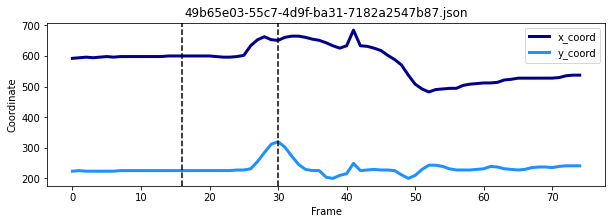

Video 67
End frame: 31
Not enough frames before knee kick.

Video 68
End frame: 33


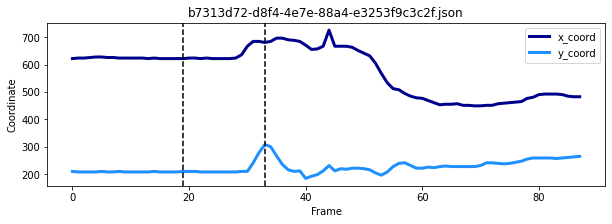

Video 69
End frame: 32
Not enough frames before knee kick.

Video 70
End frame: 45
Not enough frames before knee kick.

Video 71
End frame: 32


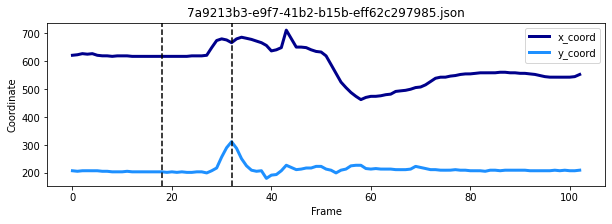

Video 72
End frame: 32


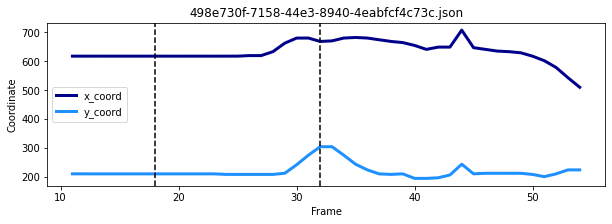

Video 73
End frame: 31
Not enough frames before knee kick.

Video 74
End frame: 33


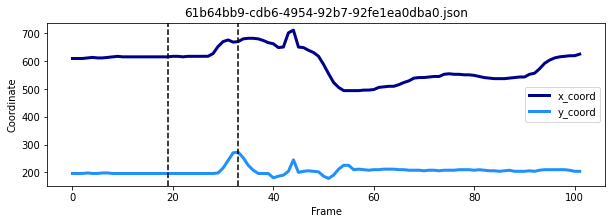

Video 75
End frame: 0
Not enough frames before knee kick.

Video 76
End frame: 41
Not enough frames before knee kick.

Video 77
End frame: 33


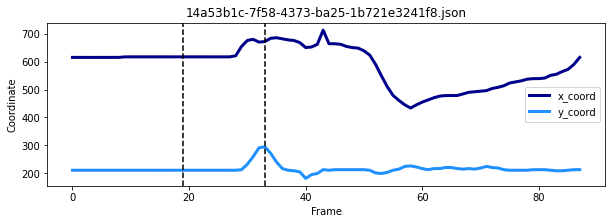

Video 78
End frame: 32


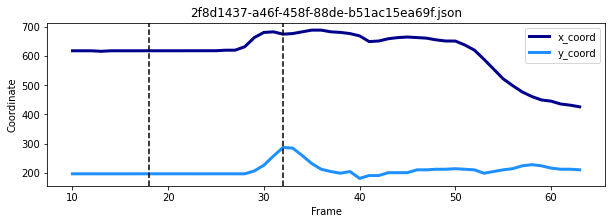

Video 79
End frame: 32


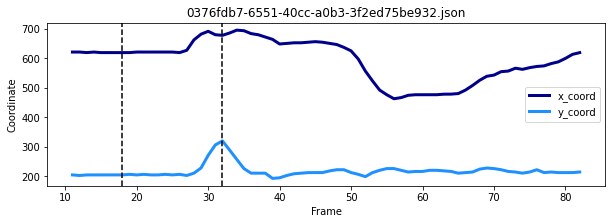

Video 80
End frame: 30


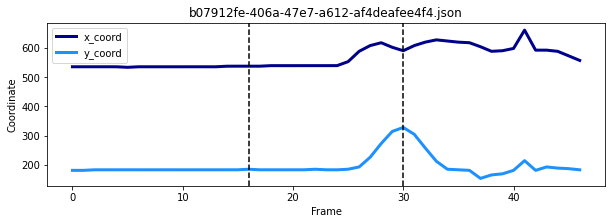

Video 81
End frame: 30


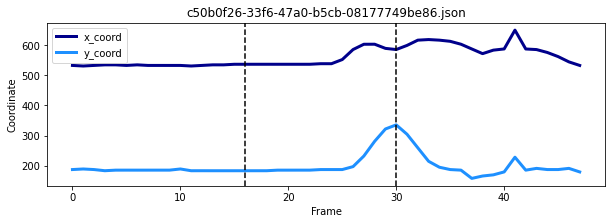

Video 82
End frame: 30


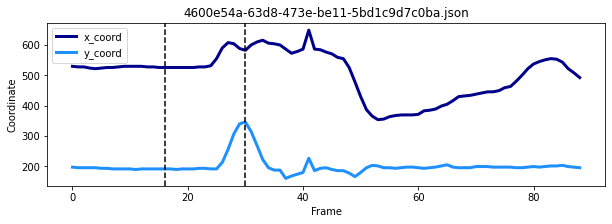

Video 83
End frame: 32


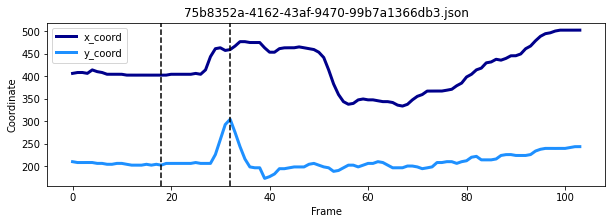

Video 84
End frame: 33


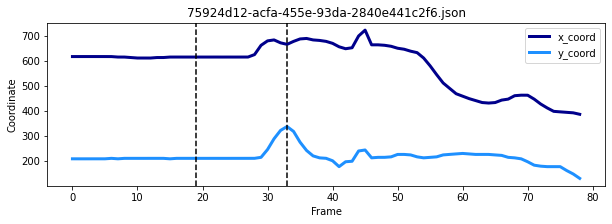

Video 85
End frame: 30


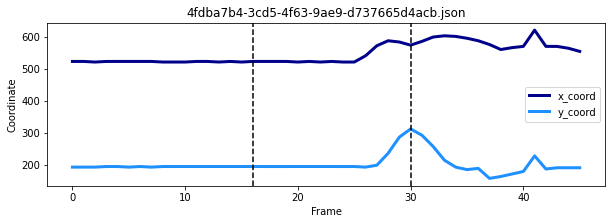

Video 86
End frame: 31


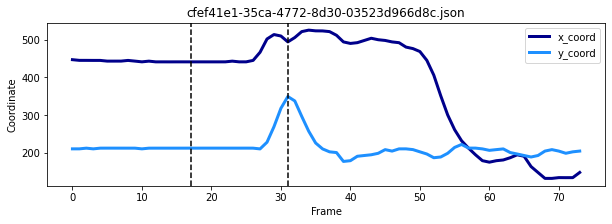

Video 87
End frame: 32


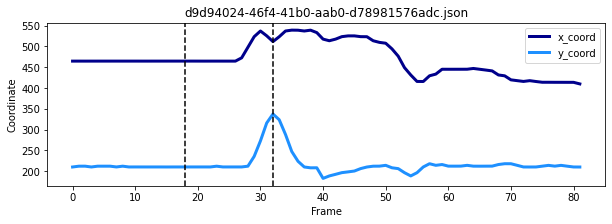

Video 88
End frame: 30


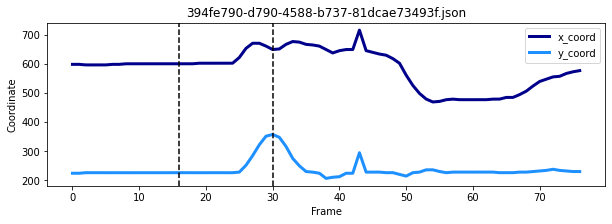

Video 89
End frame: 33
Not enough frames before knee kick.

Video 90
End frame: 30


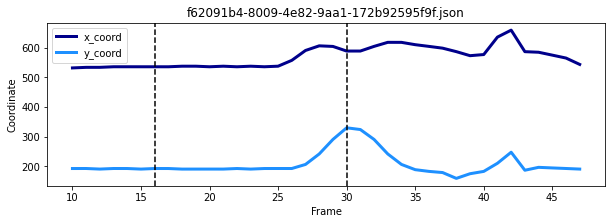

Video 91
End frame: 31


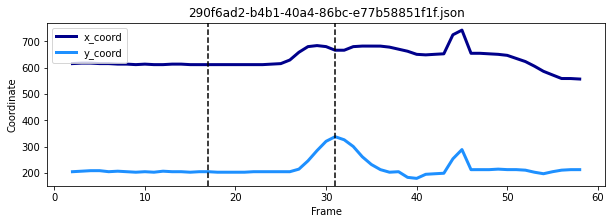

Video 92
End frame: 44
Not enough frames before knee kick.

Video 93
End frame: 31


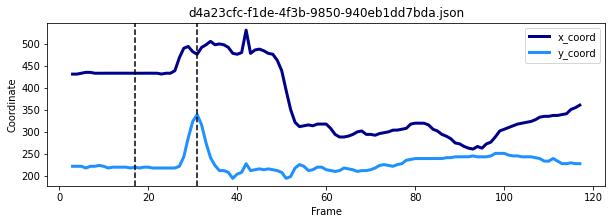

Video 94
End frame: 33


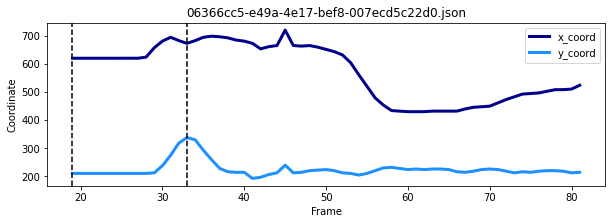

Video 95
End frame: 32


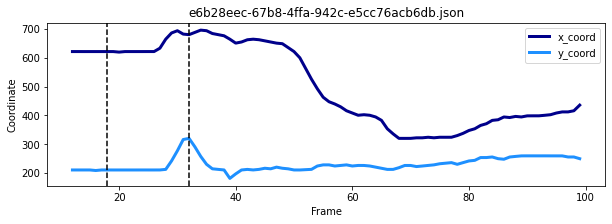

Video 96
End frame: 33


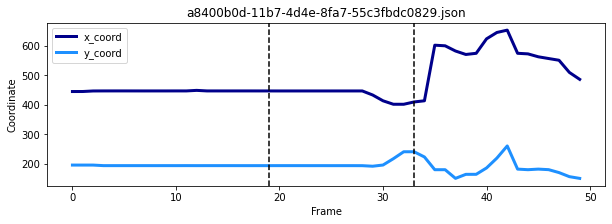

Video 97
End frame: 30


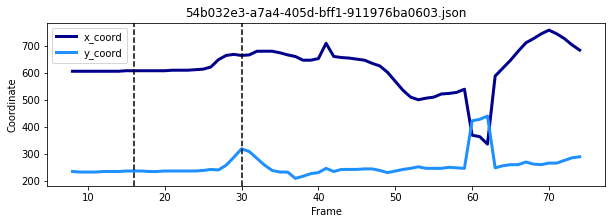

Video 98
End frame: 31


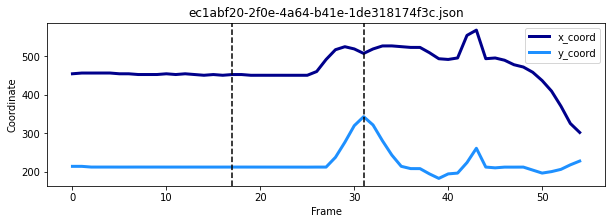

Video 99
End frame: 42


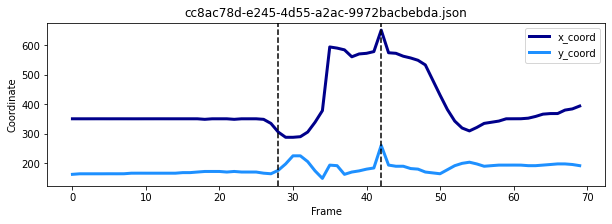

Video 100
End frame: 31
Not enough frames before knee kick.

Video 101
End frame: 31


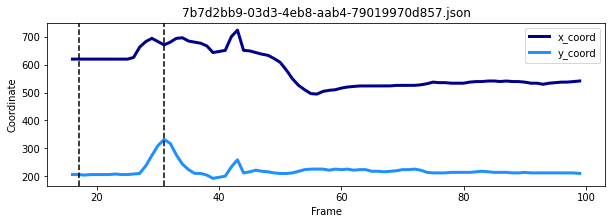

Video 102
End frame: 32


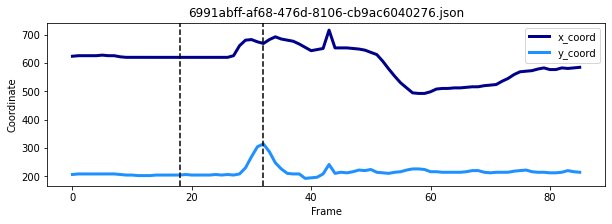

Video 103
End frame: 30


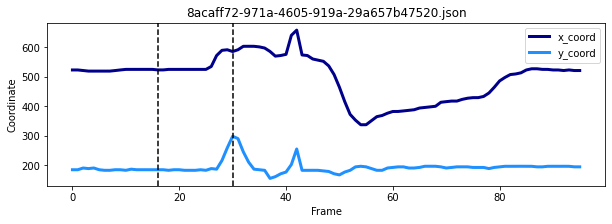

Video 104
End frame: 33
Not enough frames before knee kick.

Video 105
End frame: 35
Not enough frames before knee kick.

Video 106
End frame: 32


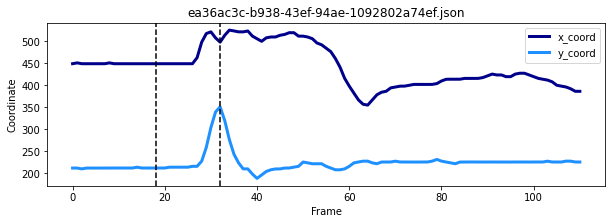

Video 107
End frame: 33


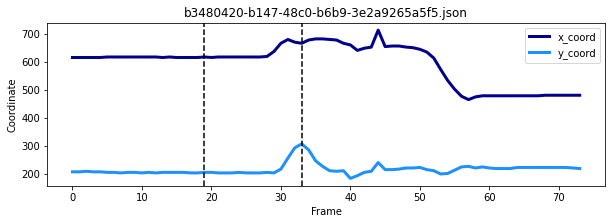

Video 108
End frame: 31


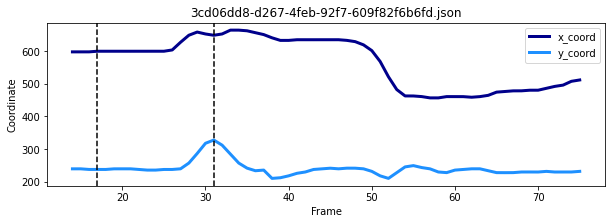

Video 109
End frame: 32
Not enough frames before knee kick.

Video 110
End frame: 33


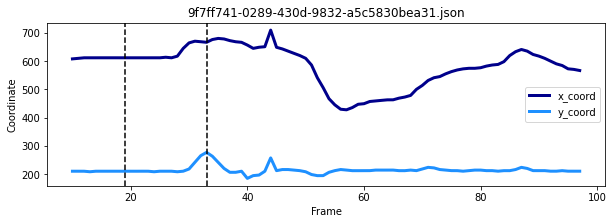

Video 111
End frame: 31


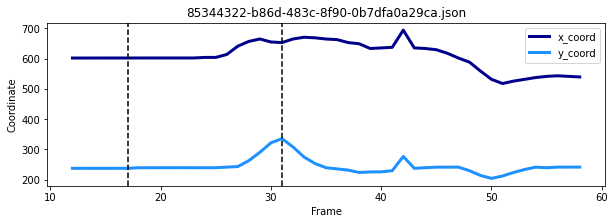

Video 112
End frame: 33
Not enough frames before knee kick.

Video 113
End frame: 33


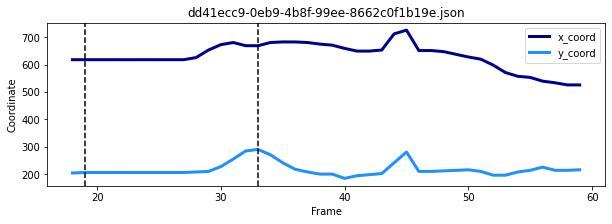

Video 114
End frame: 33


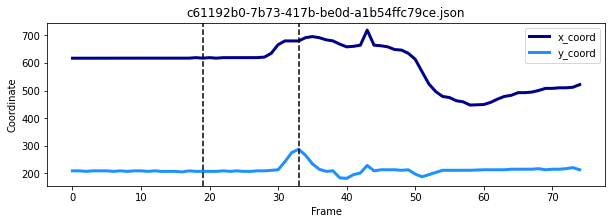

Video 115
End frame: 31


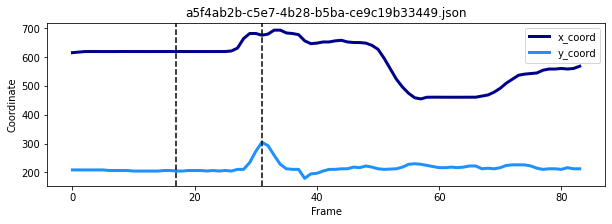

Video 116
End frame: 31


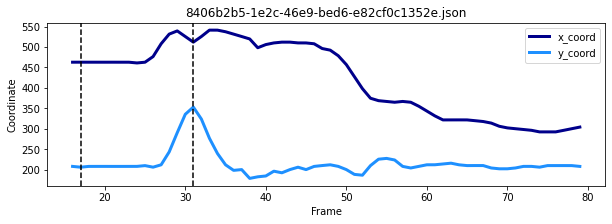

Video 117
End frame: 32


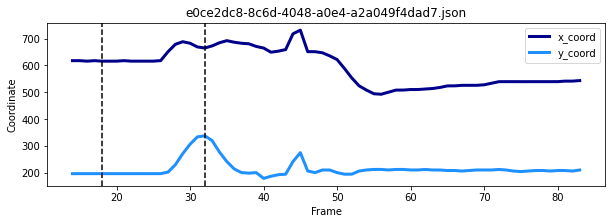

Video 118
End frame: 57
Not enough frames before knee kick.

Video 119
End frame: 33
Not enough frames before knee kick.

Video 120
End frame: 32


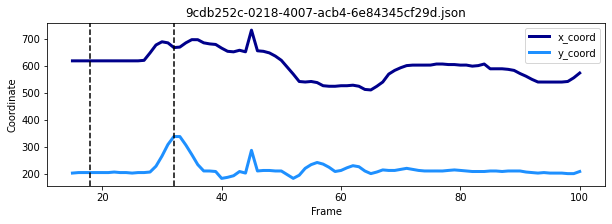

Video 121
End frame: 31


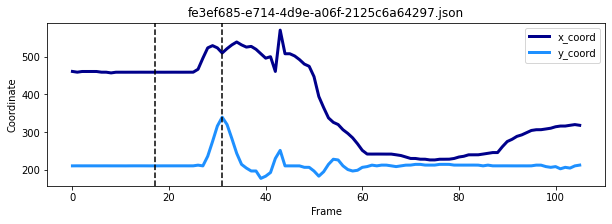

Video 122
End frame: 31


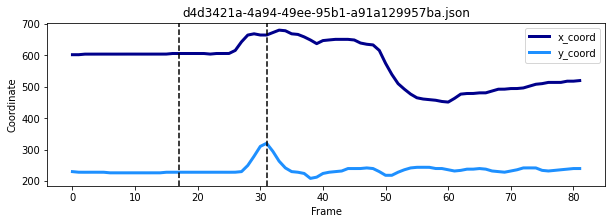

Video 123
End frame: 30


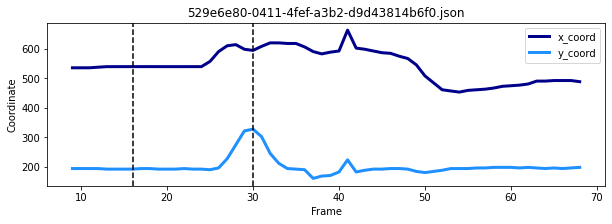

Video 124
End frame: 32


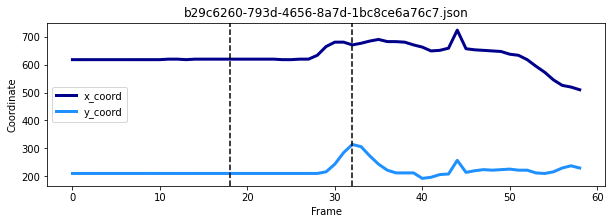

Video 125
End frame: 32


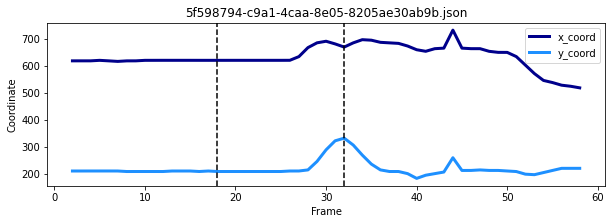

Video 126
End frame: 32


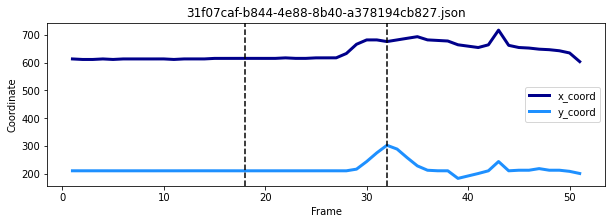

Video 127
End frame: 31


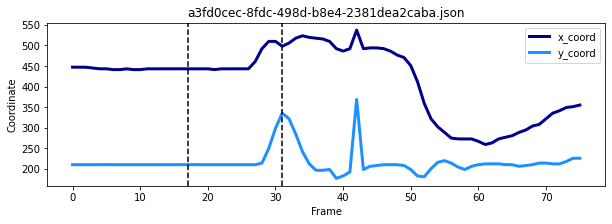

Video 128
End frame: 33


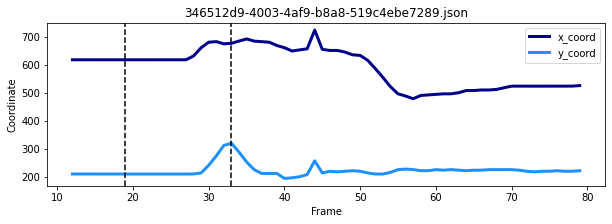

Video 129
End frame: 33


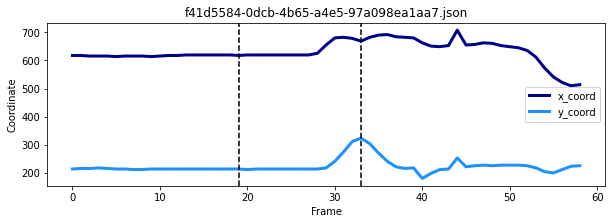

Video 130
End frame: 32


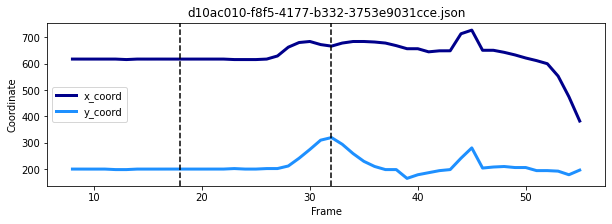

Video 131
End frame: 32
Not enough frames before knee kick.

Video 132
End frame: 32


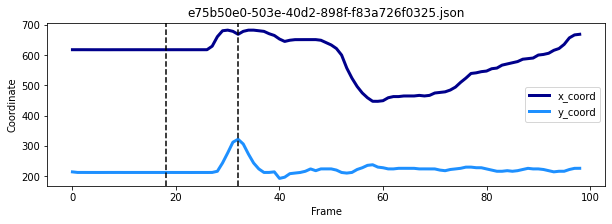

Video 133
End frame: 32


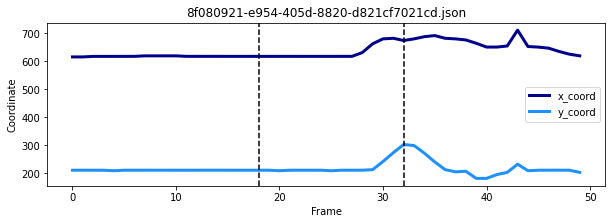

Video 134
End frame: 42
Not enough frames before knee kick.

Video 135
End frame: 32
Not enough frames before knee kick.

Video 136
End frame: 30


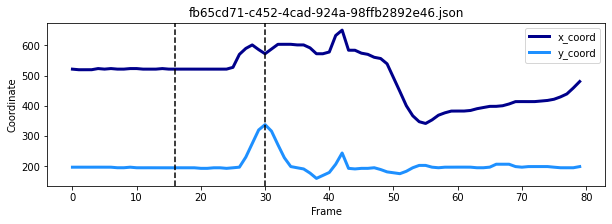

Video 137
End frame: 31


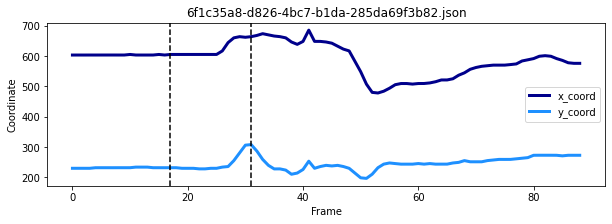

Video 138
End frame: 33


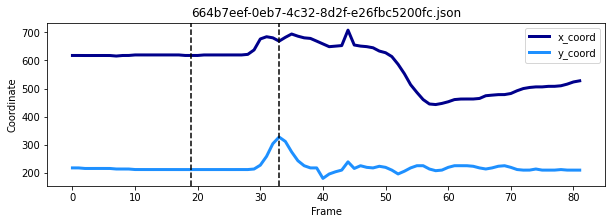

Video 139
End frame: 31
Not enough frames before knee kick.

Video 140
End frame: 32


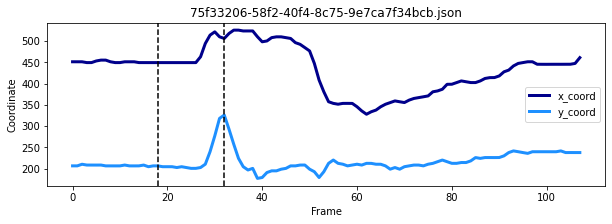

Video 141
End frame: 30


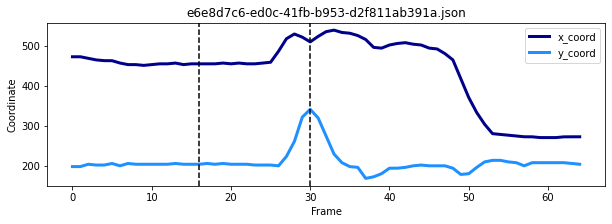

Video 142
End frame: 31


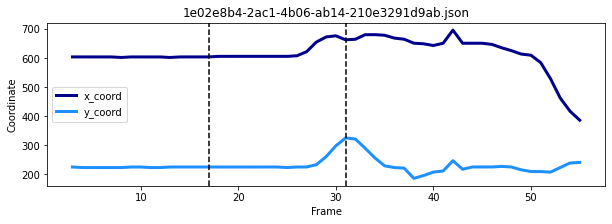

Video 143
End frame: 40
Not enough frames before knee kick.

Video 144
End frame: 32


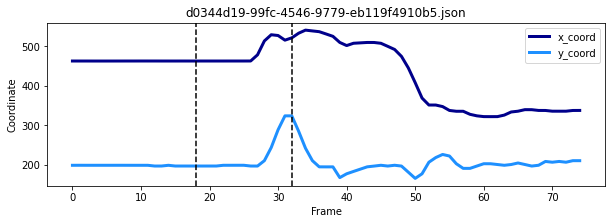

Video 145
End frame: 33


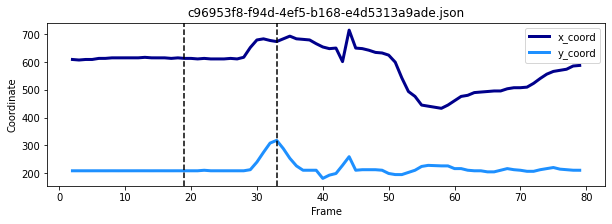

Video 146
End frame: 32


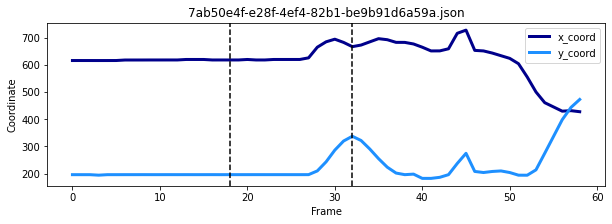

Video 147
End frame: 31


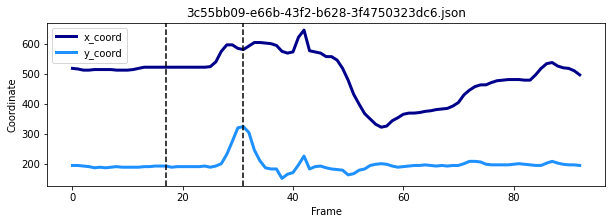

Video 148
End frame: 30


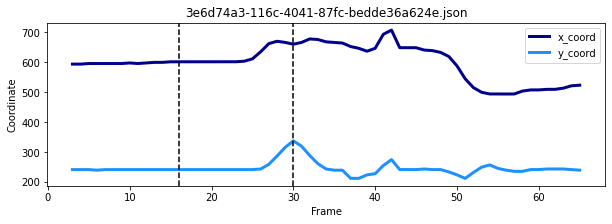

Video 149
End frame: 33


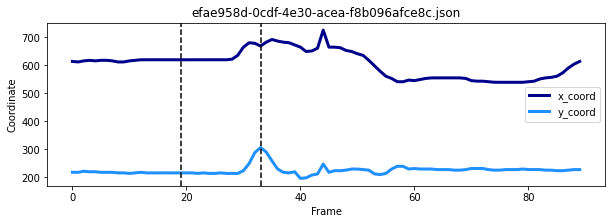

Video 150
End frame: 30


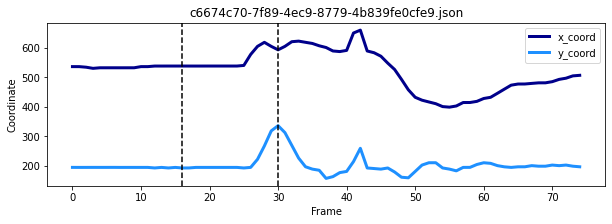

Video 151
End frame: 30


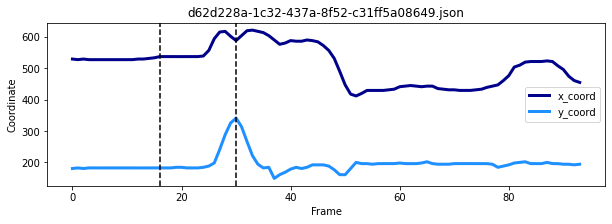

Video 152
End frame: 30
Not enough frames before knee kick.

Video 153
End frame: 33


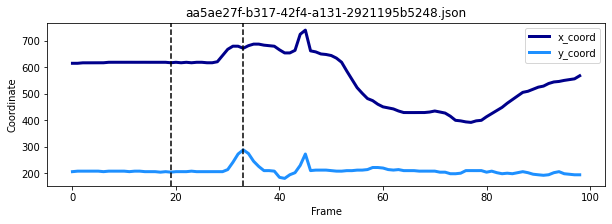

Video 154
End frame: 30


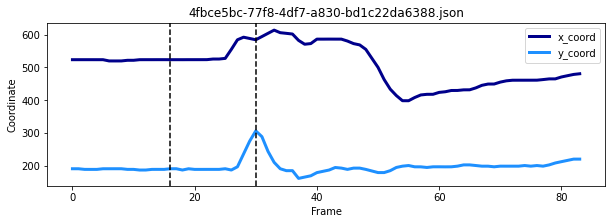

Video 155
End frame: 31
Not enough frames before knee kick.

Video 156
End frame: 31


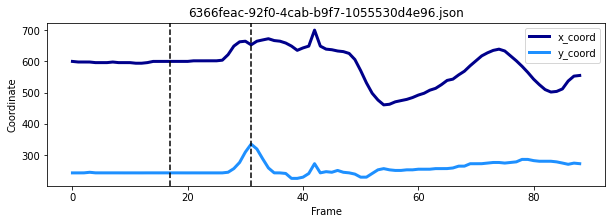

Video 157
End frame: 32
Not enough frames before knee kick.

Video 158
End frame: 32
Not enough frames before knee kick.

Video 159
End frame: 32


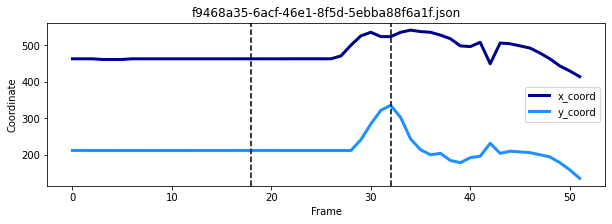

Video 160
End frame: 30


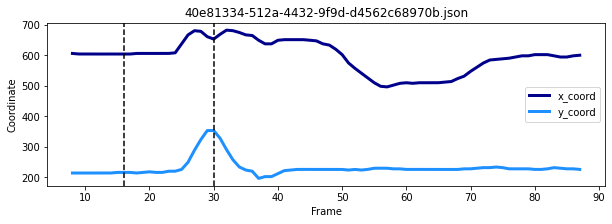

Video 161
End frame: 31
Not enough frames before knee kick.

Video 162
End frame: 32


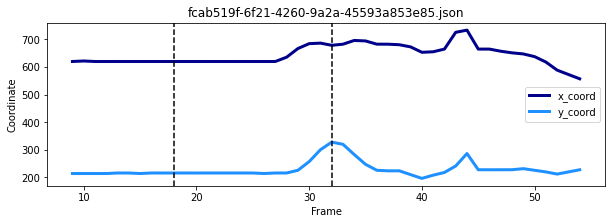

Video 163
End frame: 32


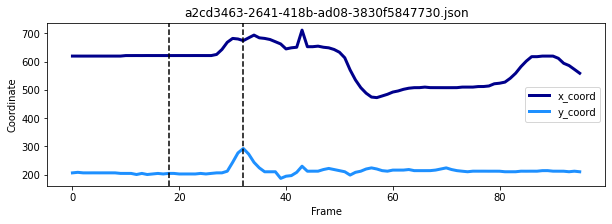

Video 164
End frame: 31
Not enough frames before knee kick.

Video 165
End frame: 30
Not enough frames before knee kick.

Video 166
End frame: 31


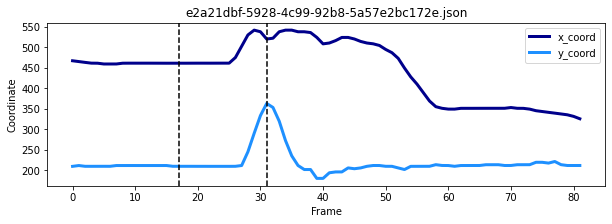

Video 167
End frame: 32


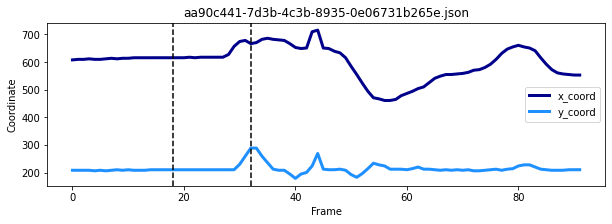

Video 168
End frame: 31
Not enough frames before knee kick.

Video 169
End frame: 34
Not enough frames before knee kick.

Video 170
End frame: 32


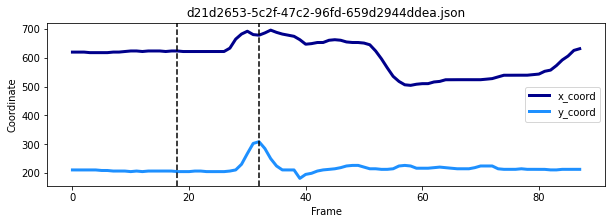

Video 171
End frame: 33


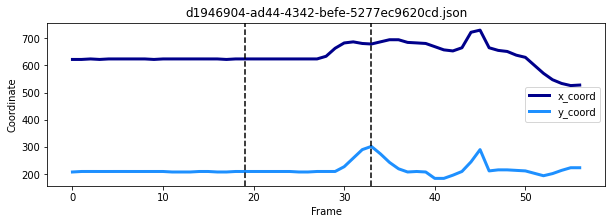

Video 172
End frame: 31


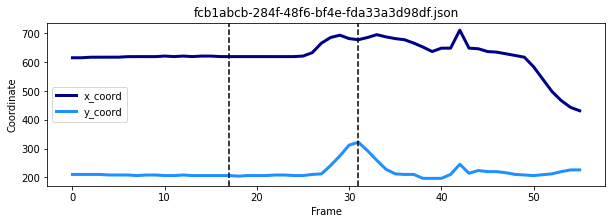

Video 173
End frame: 33
Not enough frames before knee kick.

Video 174
End frame: 31


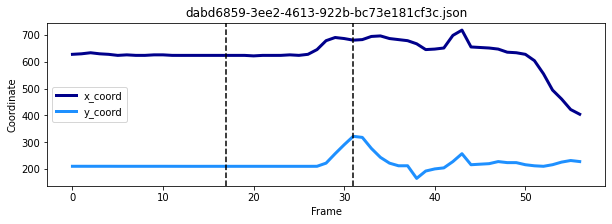

Video 175
End frame: 31


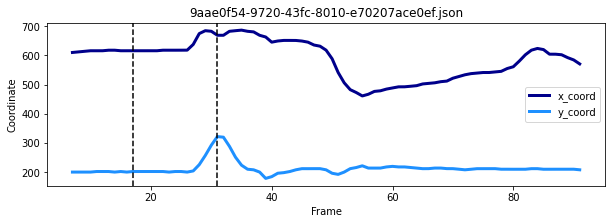

Video 176
End frame: 31


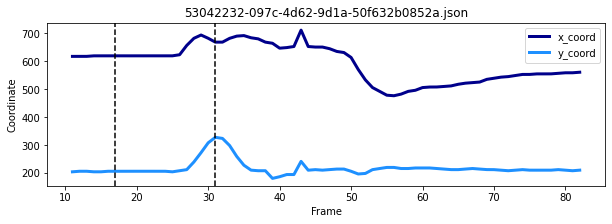

Video 177
End frame: 32


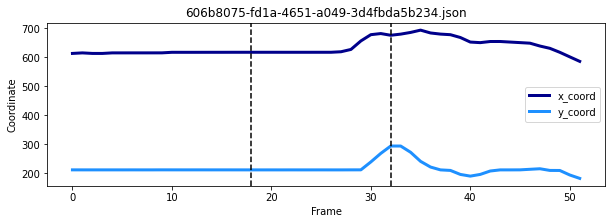

Video 178
End frame: 32


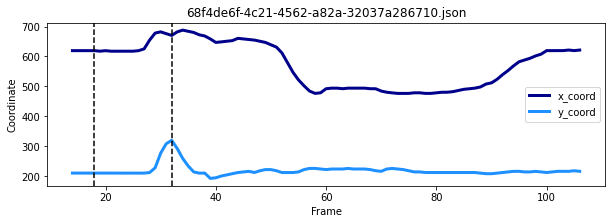

Video 179
End frame: 31


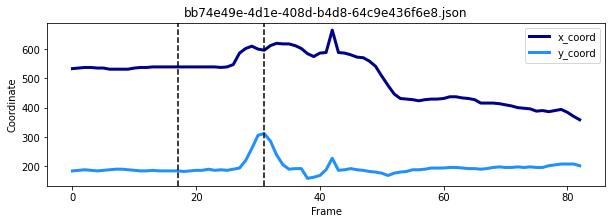

Video 180
End frame: 30


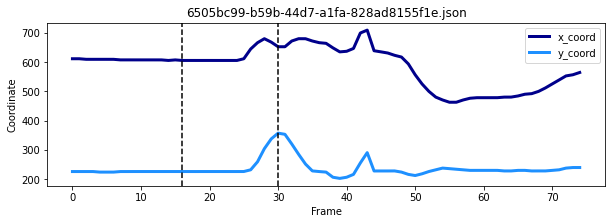

Video 181
End frame: 33


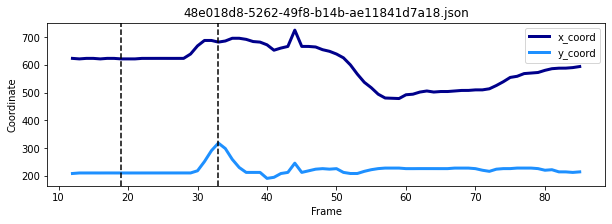

Video 182
End frame: 30


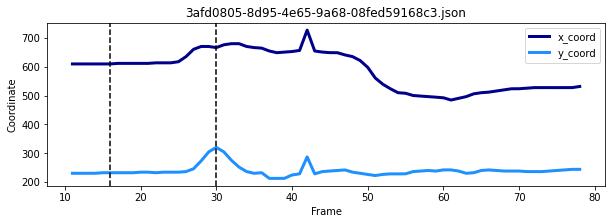

Video 183
End frame: 31


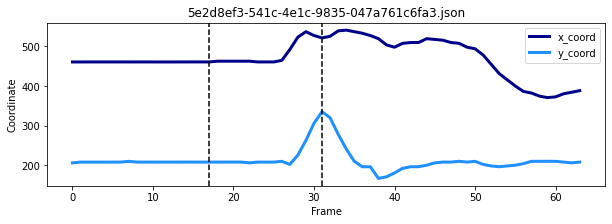

Video 184
End frame: 32


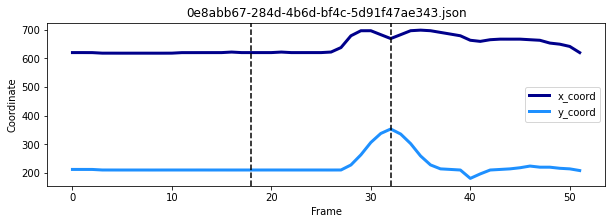

Video 185
End frame: 32


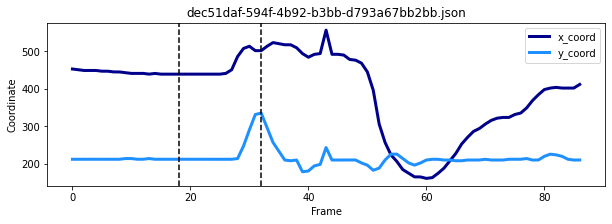

Video 186
End frame: 33


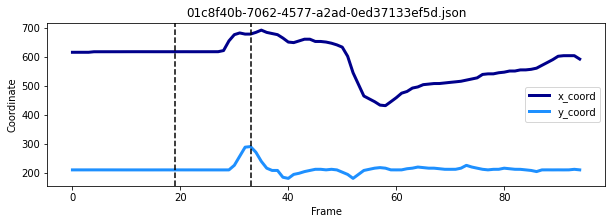

Video 187
End frame: 33


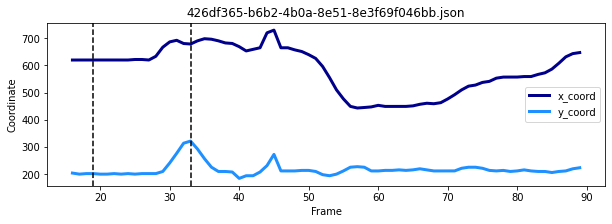

Video 188
End frame: 30


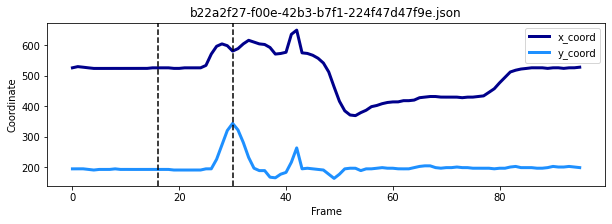

Video 189
End frame: 30


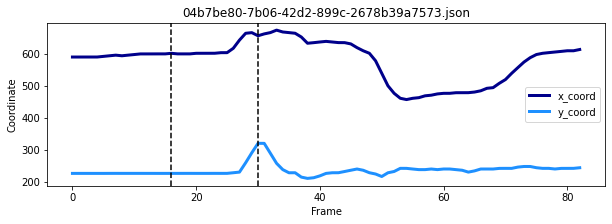

Video 190
End frame: 31


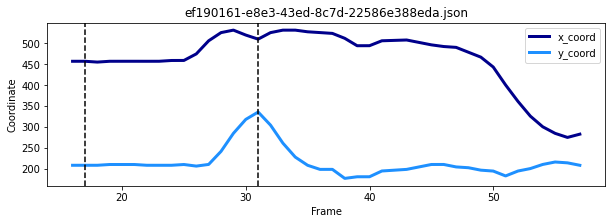

Video 191
End frame: 32


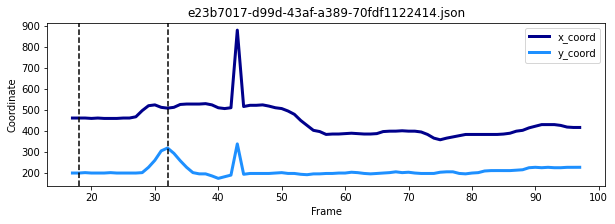

Video 192
End frame: 32


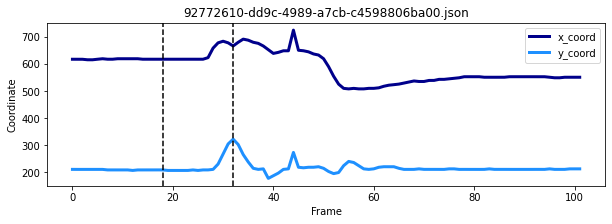

Video 193
End frame: 31


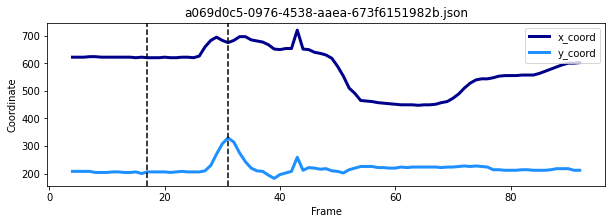

Video 194
End frame: 30


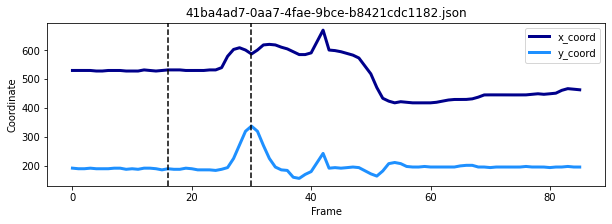

Video 195
End frame: 30


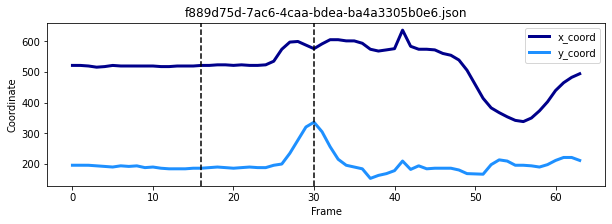

Video 196
End frame: 30


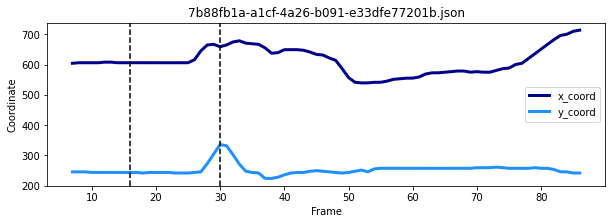

Video 197
End frame: 30


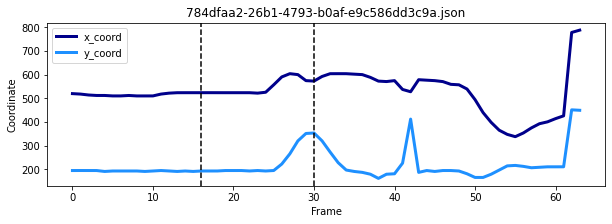

Video 198
End frame: 32


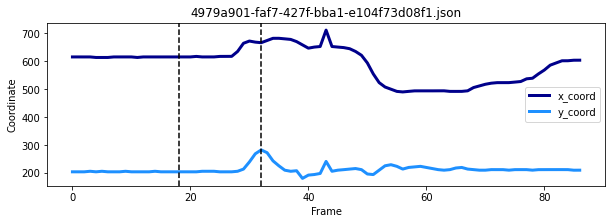

Video 199
End frame: 31


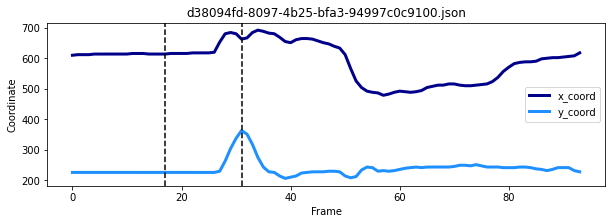

Video 200
End frame: 32


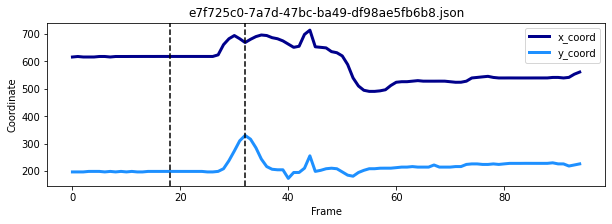

Video 201
End frame: 30


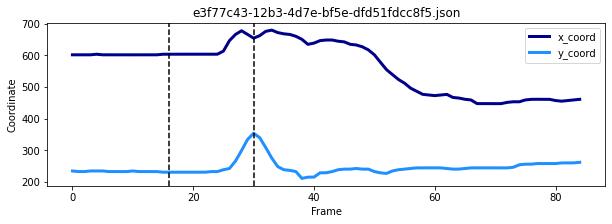

Video 202
End frame: 32


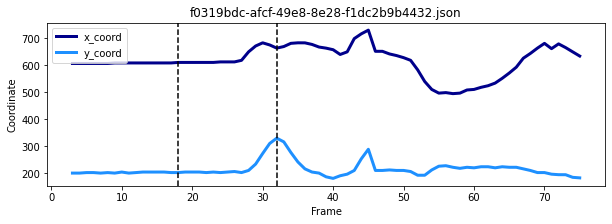

Video 203
End frame: 30


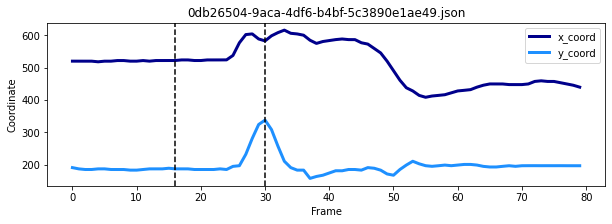

Video 204
End frame: 31


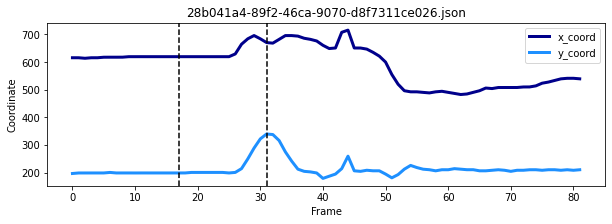

Video 205
End frame: 30


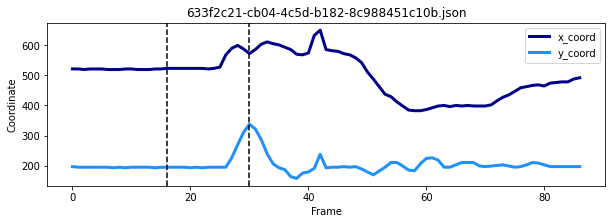

Video 206
End frame: 32


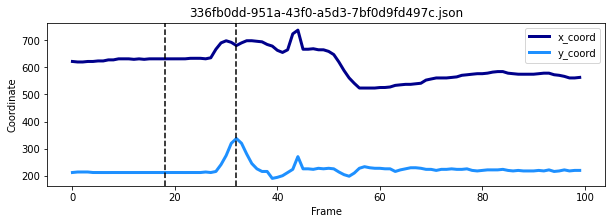

Video 207
End frame: 32
Not enough frames before knee kick.

Video 208
End frame: 33


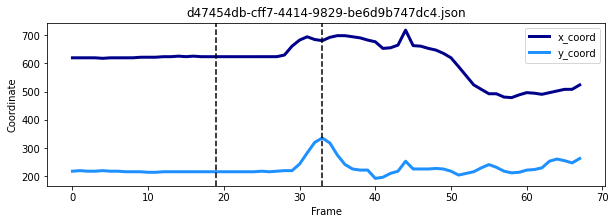

Video 209
End frame: 32


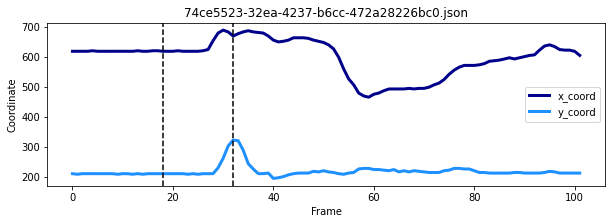

Video 210
End frame: 32


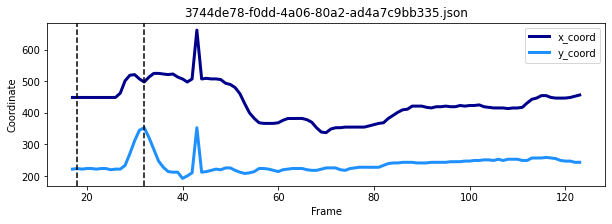

Video 211
End frame: 32


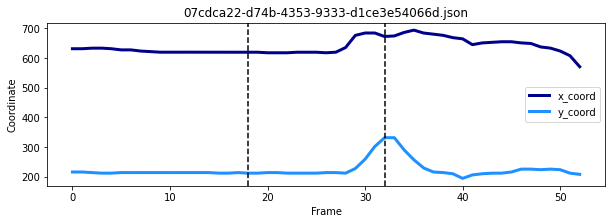

Video 212
End frame: 31


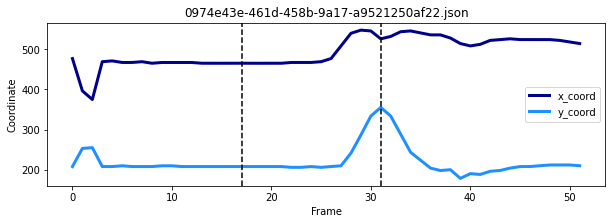

Video 213
End frame: 32


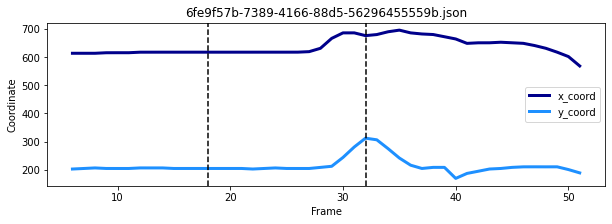

Video 214
End frame: 32


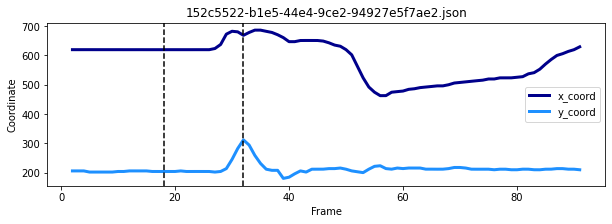

Video 215
End frame: 33
Not enough frames before knee kick.

Video 216
End frame: 30


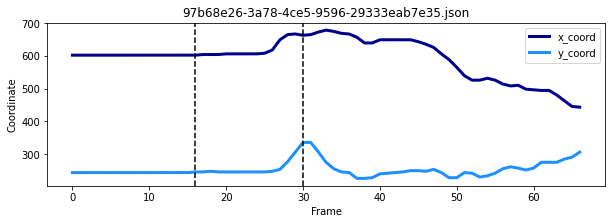

Video 217
End frame: 32


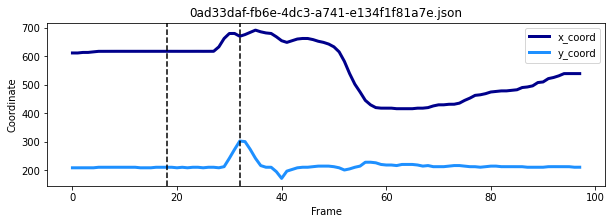

Video 218
End frame: 33


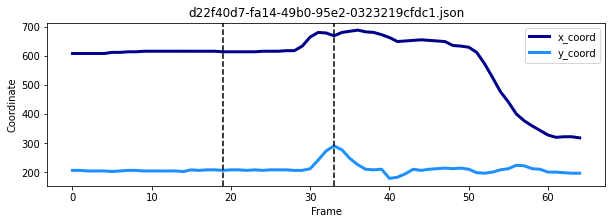

Video 219
End frame: 31


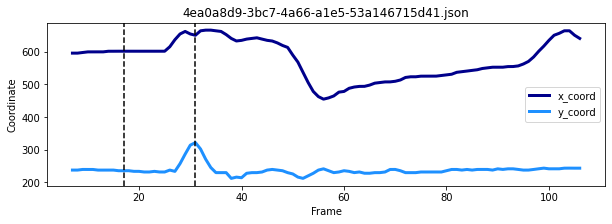

Video 220
End frame: 31


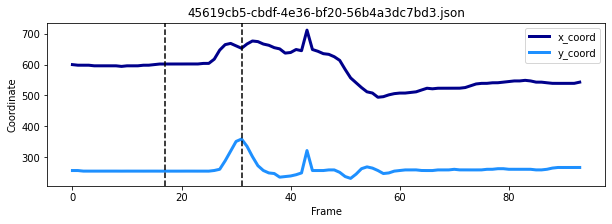

Video 221
End frame: 33


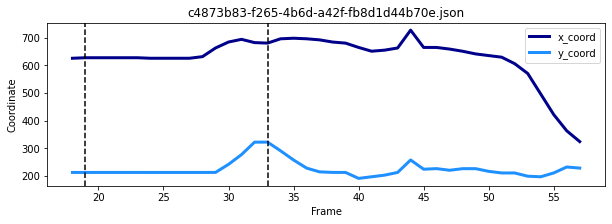

Video 222
End frame: 32


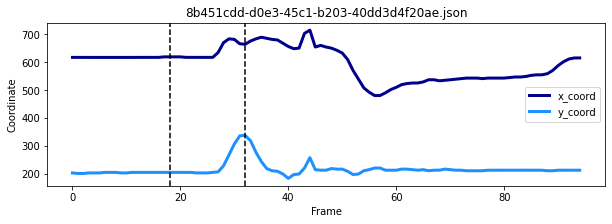

Video 223
End frame: 31


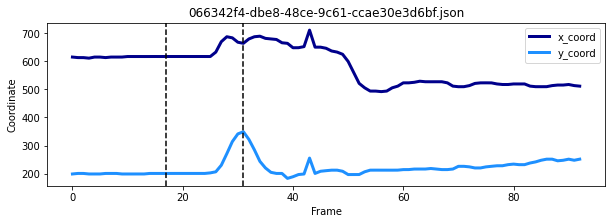

Video 224
End frame: 30


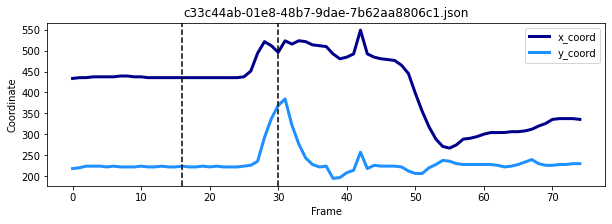

Video 225
End frame: 33
Not enough frames before knee kick.

Video 226
End frame: 32
Not enough frames before knee kick.

Video 227
End frame: 32


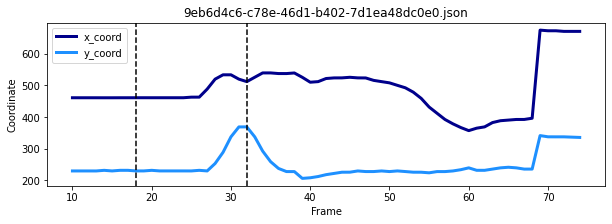

Video 228
End frame: 33


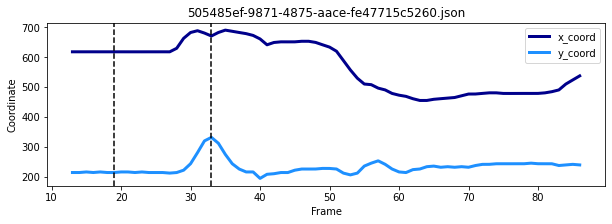

Video 229
End frame: 31


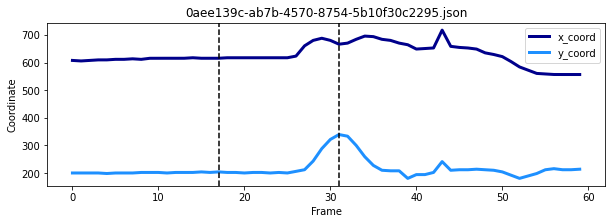

Video 230
End frame: 32


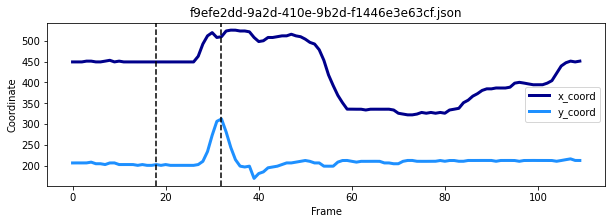

Video 231
End frame: 30


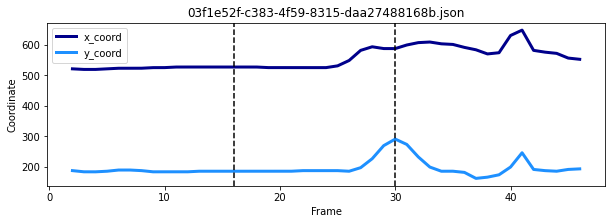

Video 232
End frame: 31


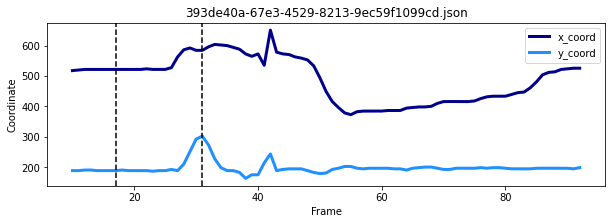

Video 233
End frame: 30
Not enough frames before knee kick.

Video 234
End frame: 30


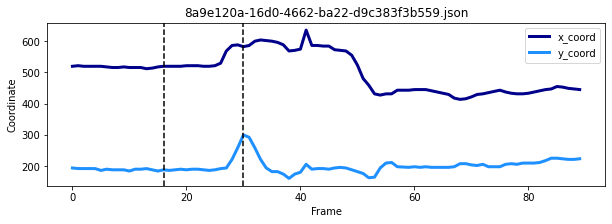

Video 235
End frame: 30


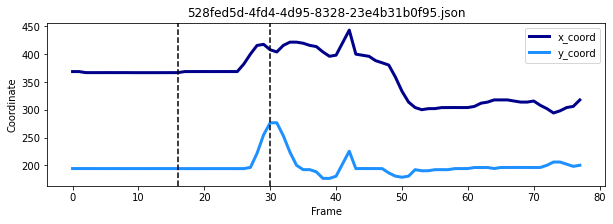

Video 236
End frame: 30


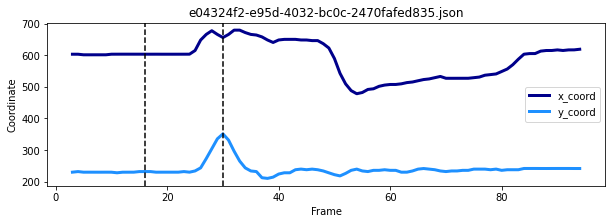

Video 237
End frame: 32


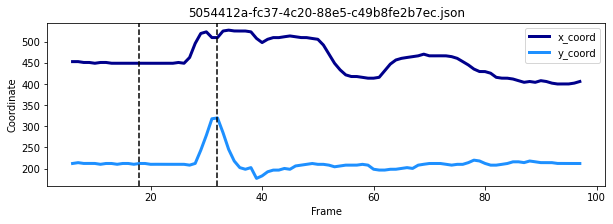

Video 238
End frame: 32


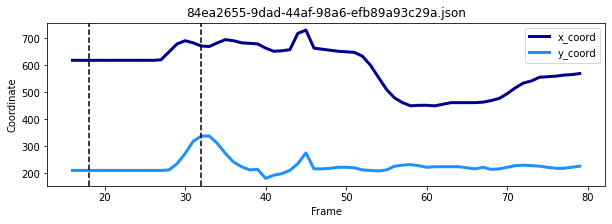

Video 239
End frame: 31


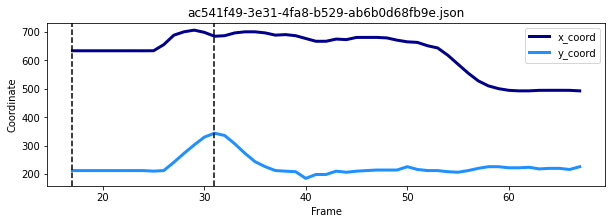

Video 240
End frame: 33


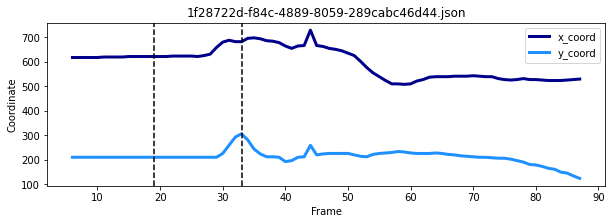

Video 241
End frame: 30


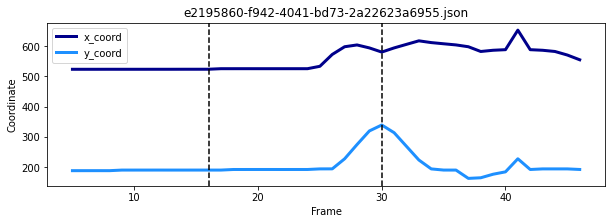

Video 242
End frame: 31


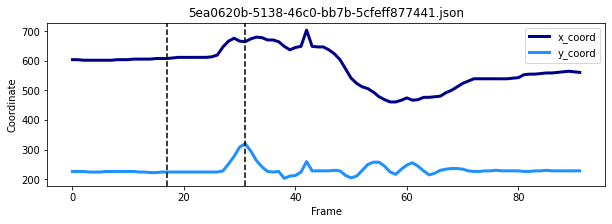

Video 243
End frame: 33


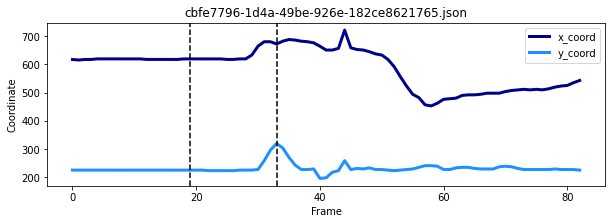

Video 244
End frame: 32
Not enough frames before knee kick.

Video 245
End frame: 32


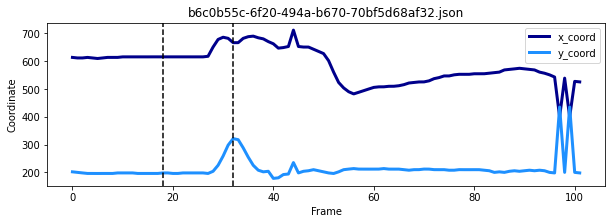

Video 246
End frame: 30


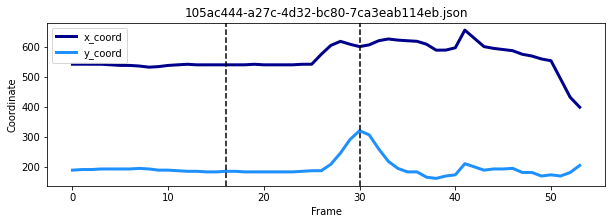

Video 247
End frame: 31


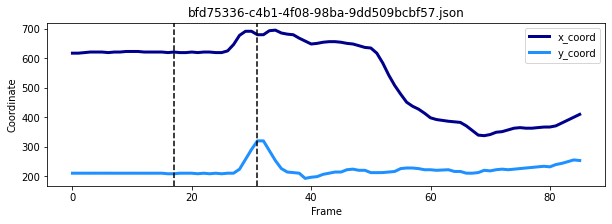

Video 248
End frame: 30


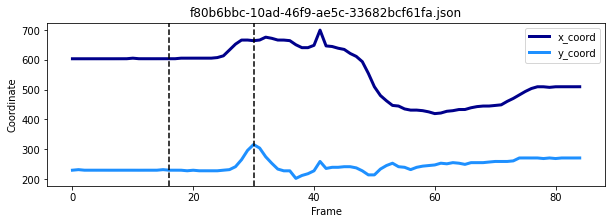

Video 249
End frame: 30


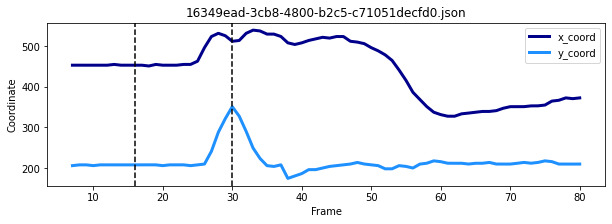

Video 250
End frame: 32


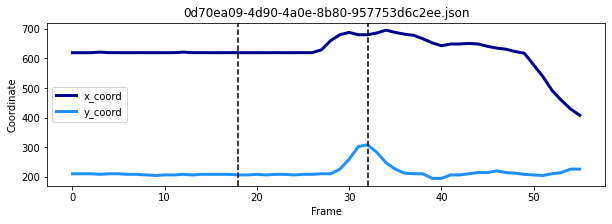

Video 251
End frame: 32


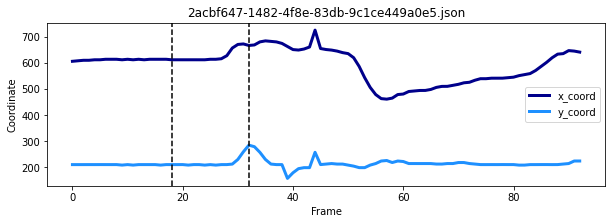

Video 252
End frame: 30


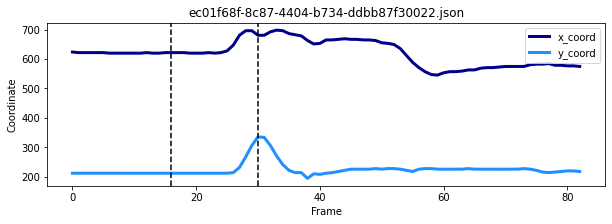

Video 253
End frame: 32


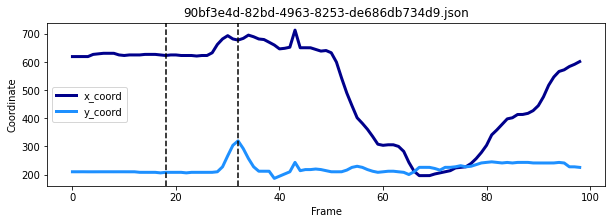

Video 254
End frame: 30


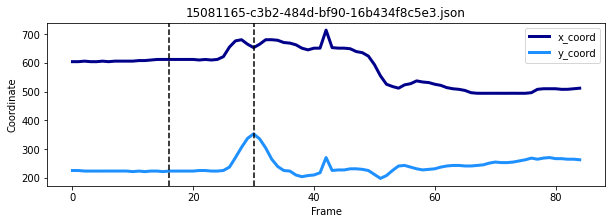

Video 255
End frame: 33


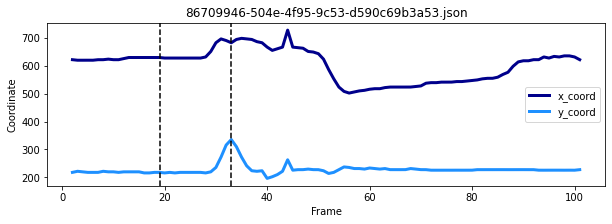

Video 256
End frame: 33


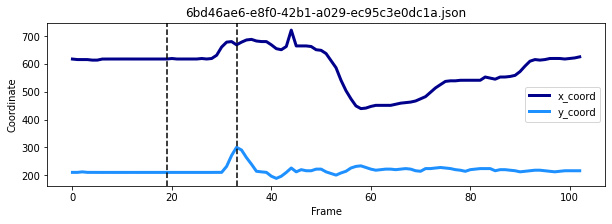

Video 257
End frame: 32


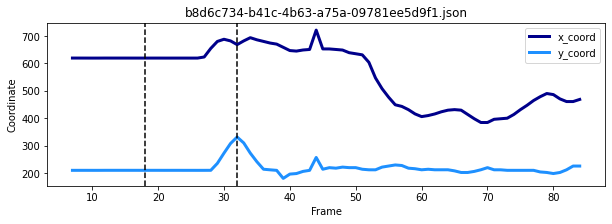

Video 258
End frame: 32


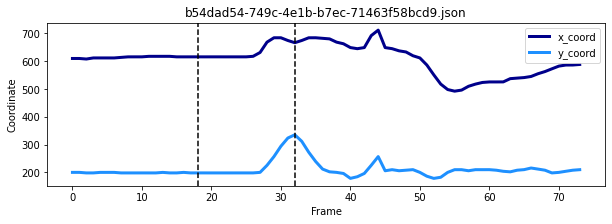

Video 259
End frame: 32


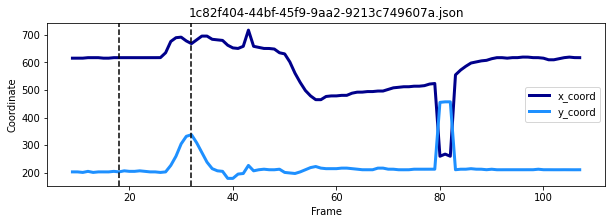

Video 260
End frame: 33


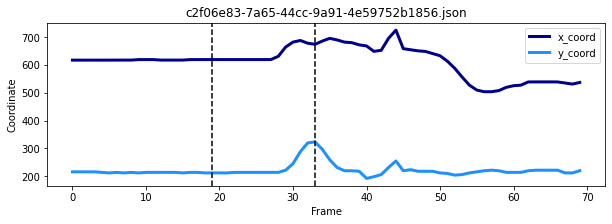

Video 261
End frame: 32


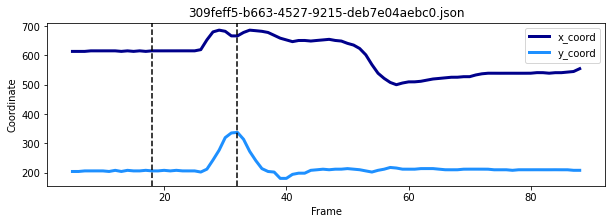

Video 262
End frame: 31


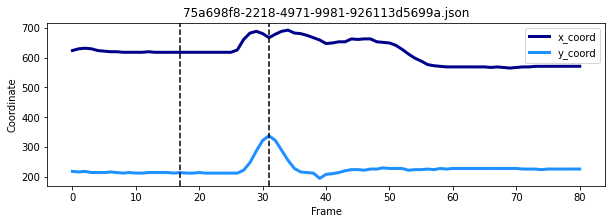

Video 263
End frame: 32


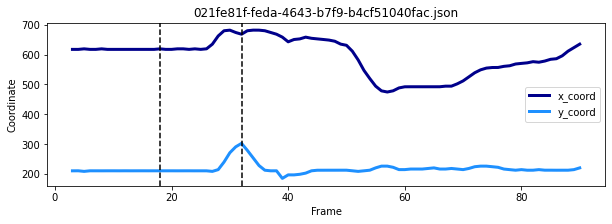

Video 264
End frame: 34


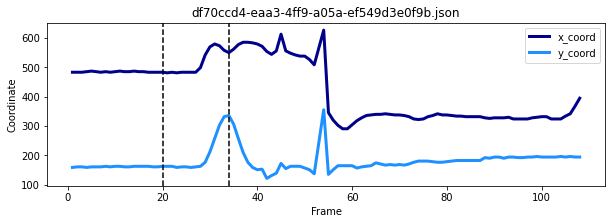

Video 265
End frame: 32


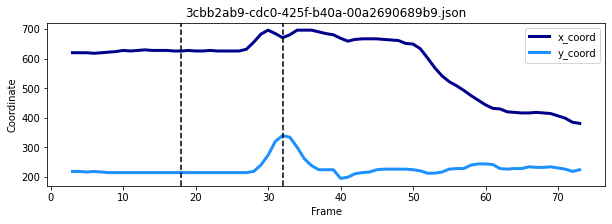

Video 266
End frame: 32


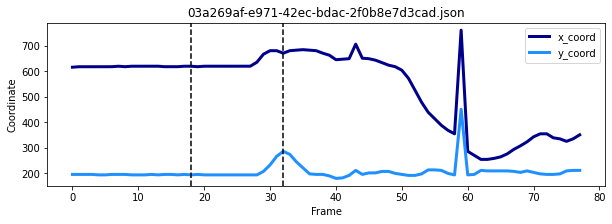

Video 267
End frame: 33


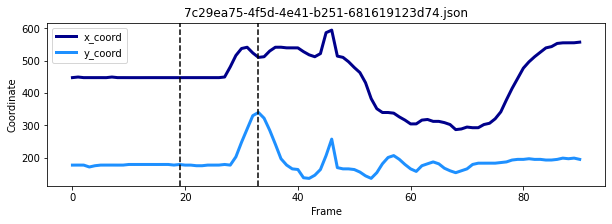

Video 268
End frame: 32
Not enough frames before knee kick.

Video 269
End frame: 32


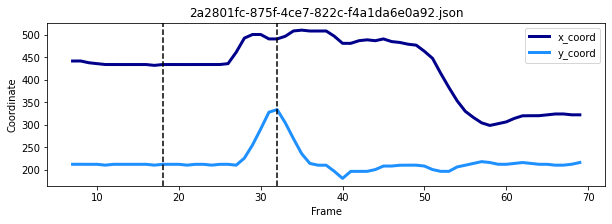

Video 270
End frame: 33


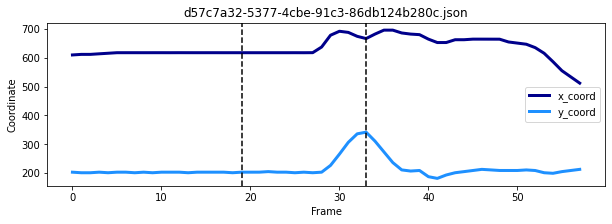

Video 271
End frame: 33


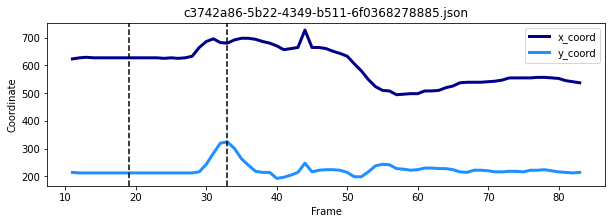

Video 272
End frame: 32


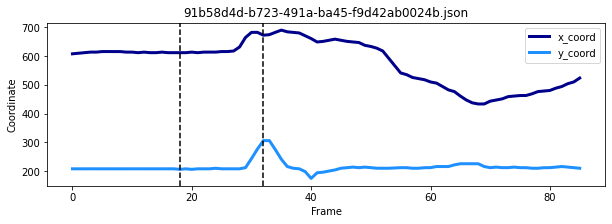

Video 273
End frame: 33
Not enough frames before knee kick.

Video 274
End frame: 30
Not enough frames before knee kick.

Video 275
End frame: 31


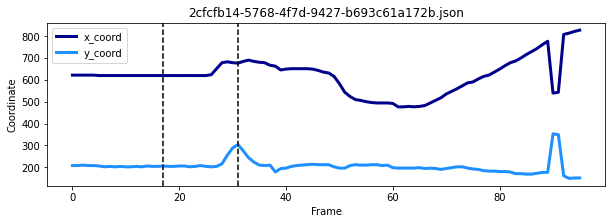

Video 276
End frame: 31


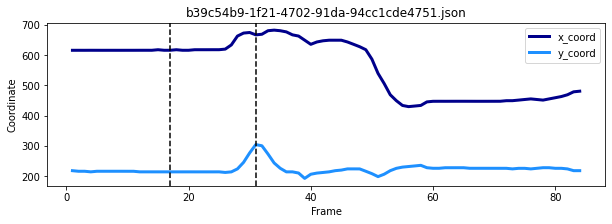

Video 277
End frame: 32


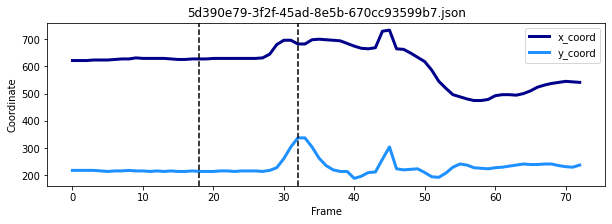

Video 278
End frame: 32


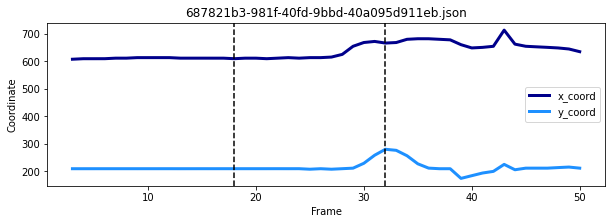

Video 279
End frame: 30


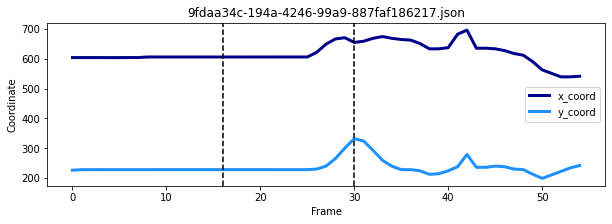

Video 280
End frame: 32


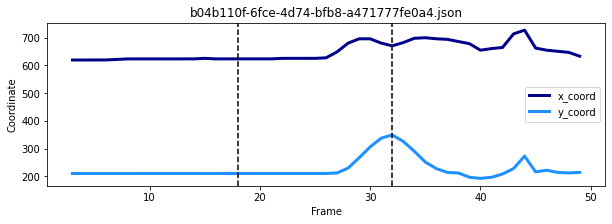

Video 281
End frame: 29


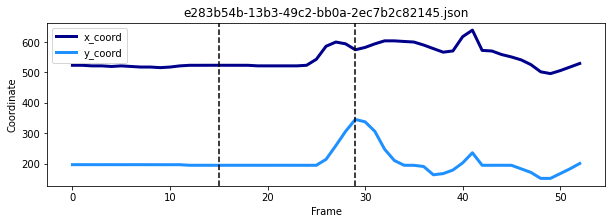

Video 282
End frame: 30


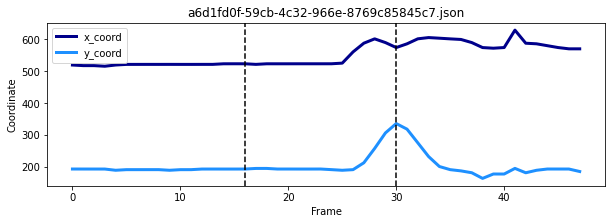

Video 283
End frame: 30


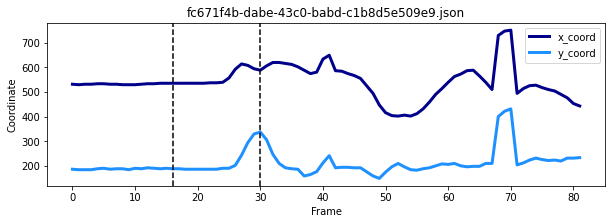

Video 284
End frame: 29


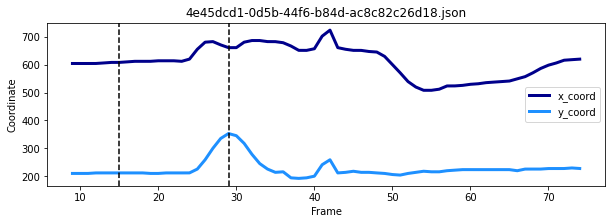

Video 285
End frame: 32


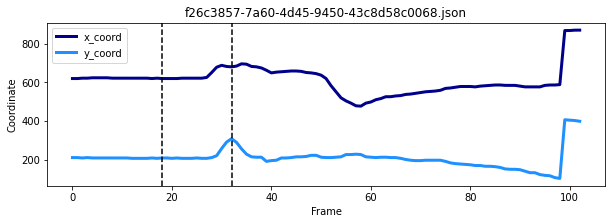

Video 286
End frame: 35
Not enough frames before knee kick.

Video 287
End frame: 31


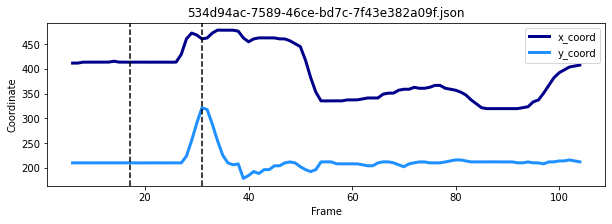

Video 288
End frame: 32


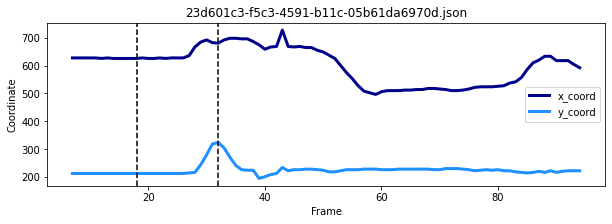

Video 289
End frame: 33


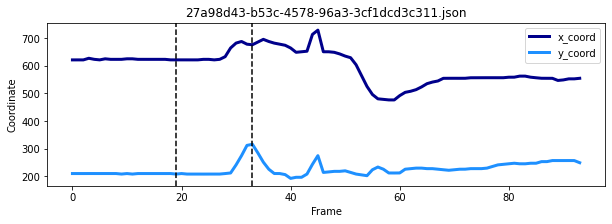

Video 290
End frame: 30


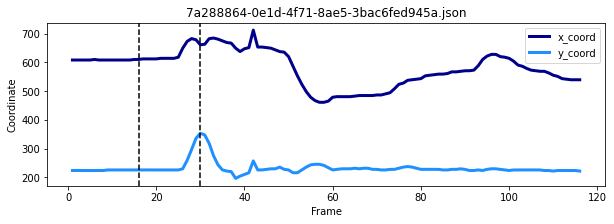

Video 291
End frame: 33
Not enough frames before knee kick.

Video 292
End frame: 32
Not enough frames before knee kick.

Video 293
End frame: 33


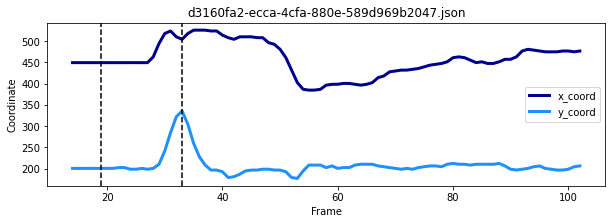

Video 294
End frame: 30


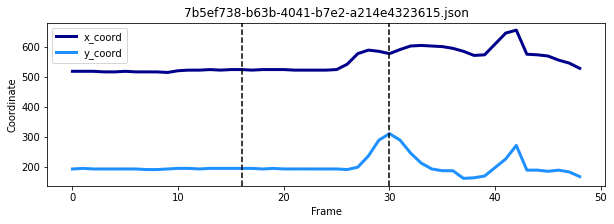

Video 295
End frame: 31


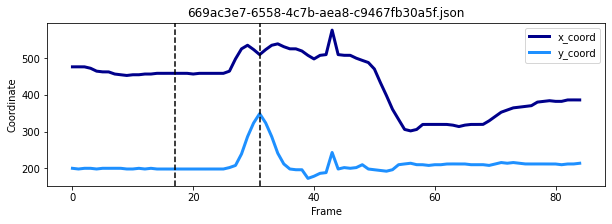

Video 296
End frame: 31


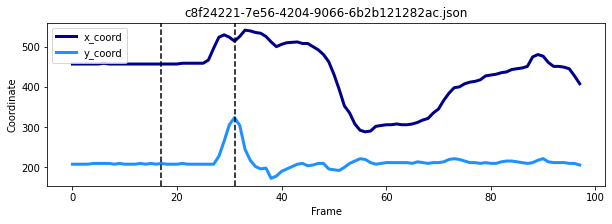

Video 297
End frame: 32


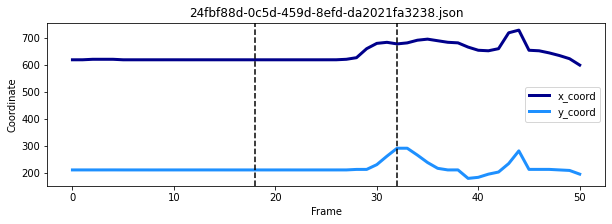

Video 298
End frame: 33


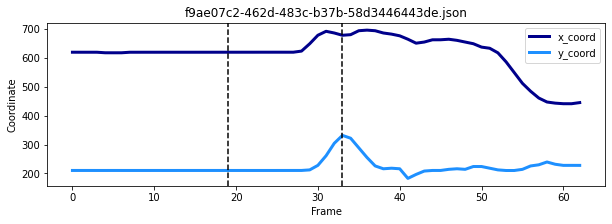

Video 299
End frame: 31


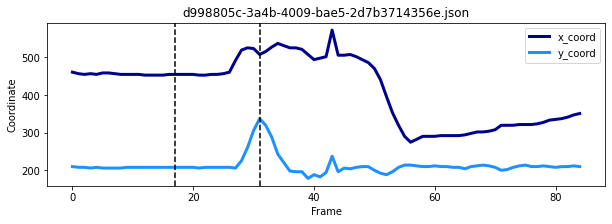

Video 300
End frame: 32


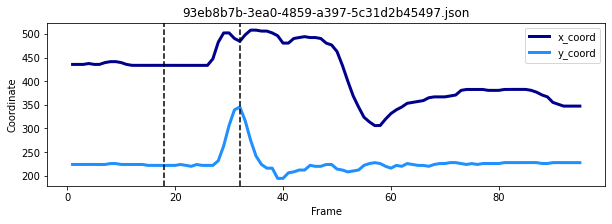

Video 301
End frame: 32


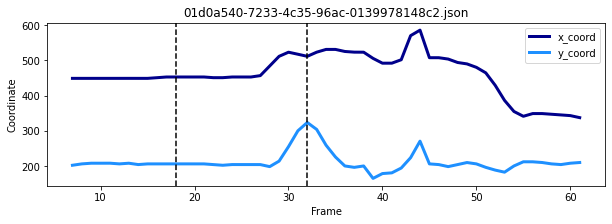

Video 302
End frame: 30


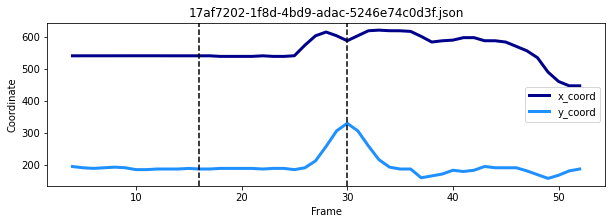

Video 303
End frame: 33


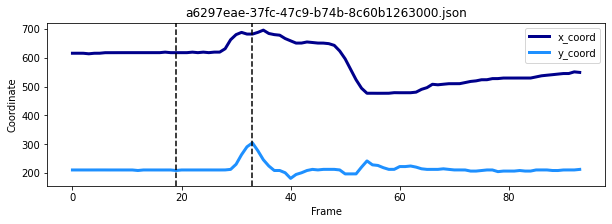

Video 304
End frame: 32


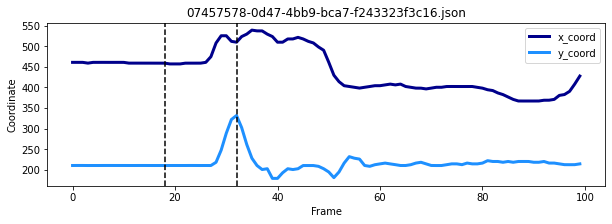

Video 305
End frame: 31


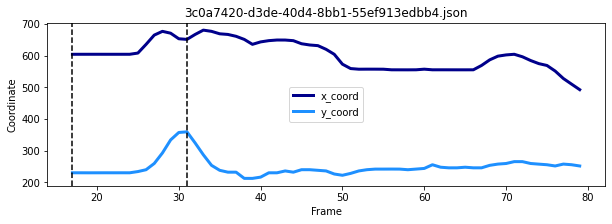

Video 306
End frame: 32


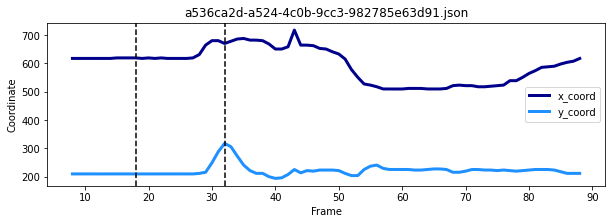

Video 307
End frame: 30


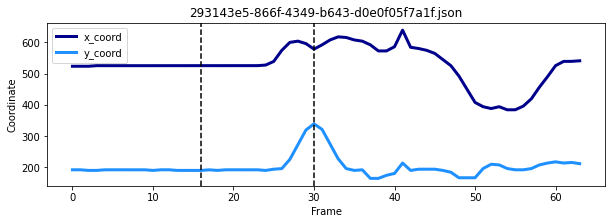

Video 308
End frame: 32


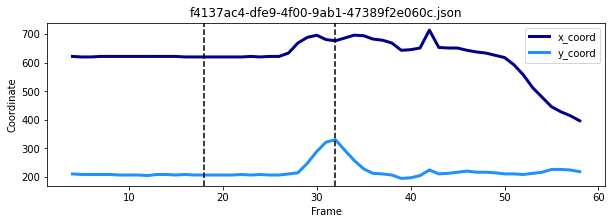

Video 309
End frame: 104


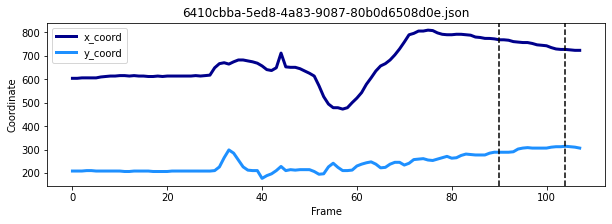

Video 310
End frame: 33


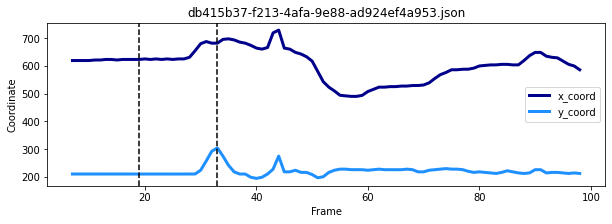

Video 311
End frame: 32
Not enough frames before knee kick.

Video 312
End frame: 33


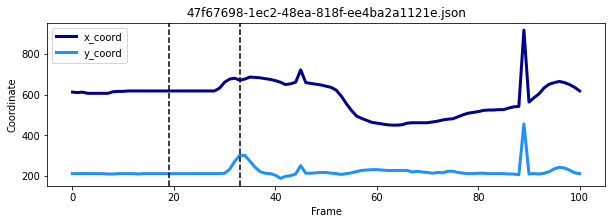

Video 313
End frame: 33
Not enough frames before knee kick.

Video 314
End frame: 32


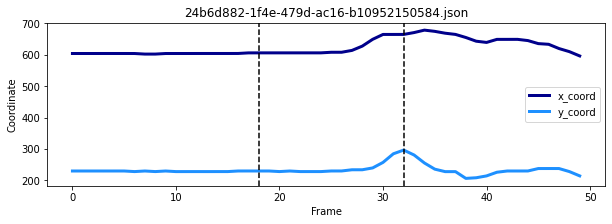

Video 315
End frame: 33


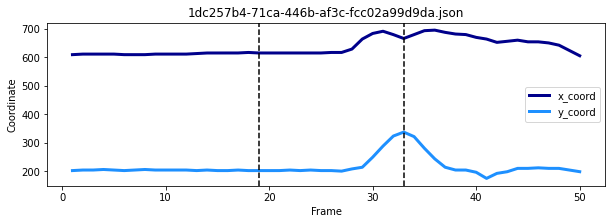

Video 316
End frame: 33


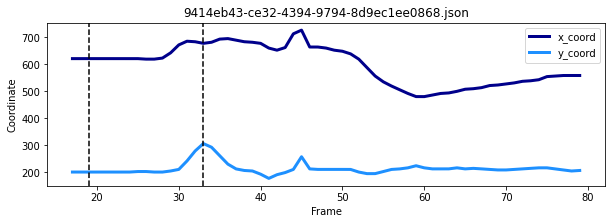

Video 317
End frame: 31


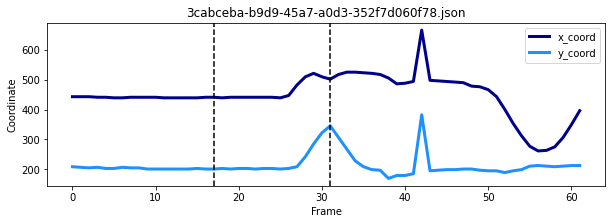

Video 318
End frame: 32


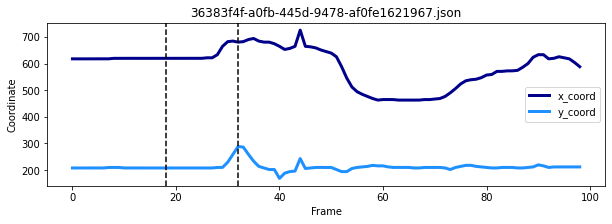

Video 319
End frame: 30


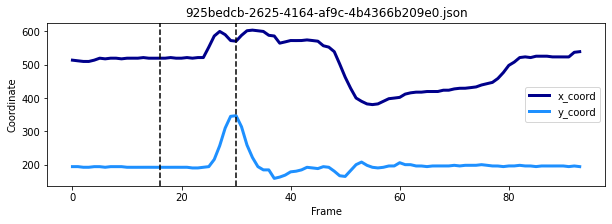

Video 320
End frame: 32


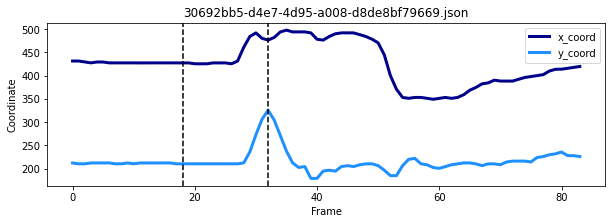

Video 321
End frame: 35
Not enough frames before knee kick.

Video 322
End frame: 32


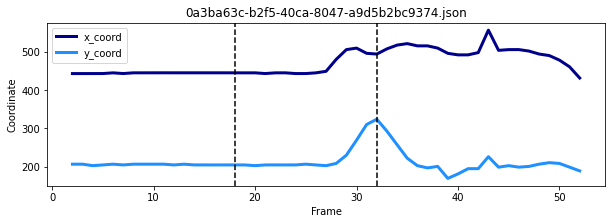

Video 323
End frame: 33


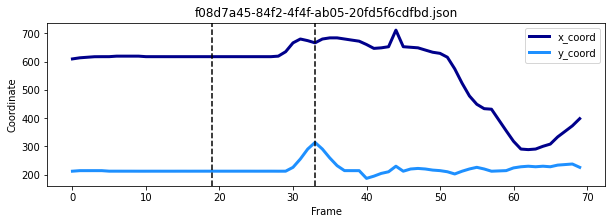

Video 324
End frame: 31
Not enough frames before knee kick.

Video 325
End frame: 31
Not enough frames before knee kick.

Video 326
End frame: 32


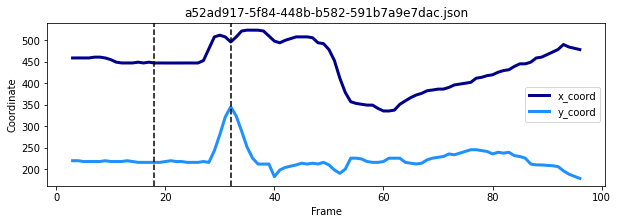

Video 327
End frame: 30


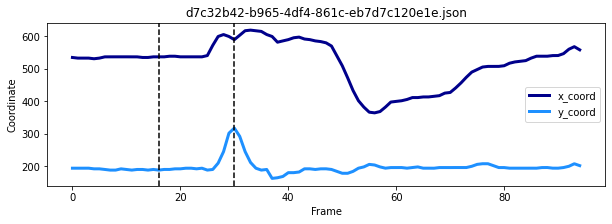

Video 328
End frame: 30


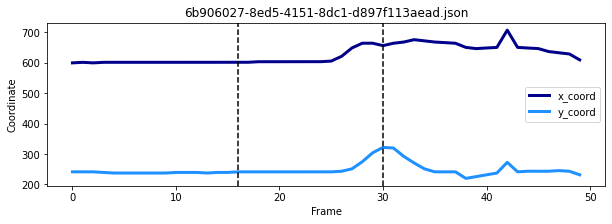

Video 329
End frame: 30


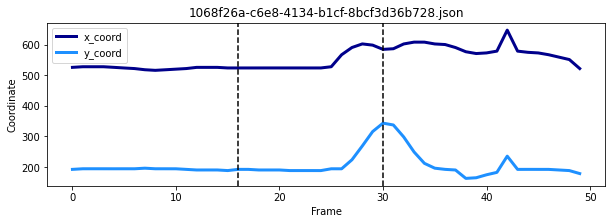

Video 330
End frame: 32


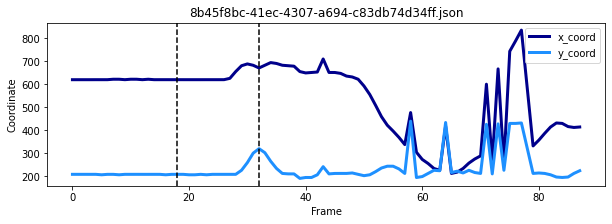

Video 331
End frame: 30


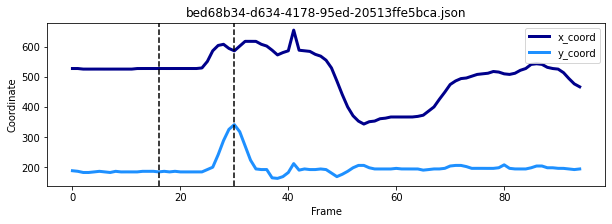

Video 332
End frame: 30


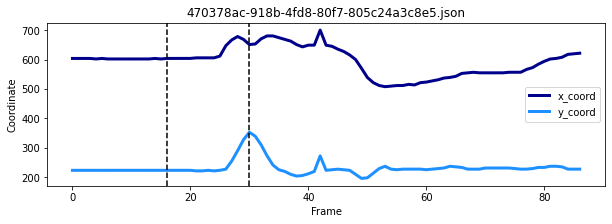

Video 333
End frame: 32
Not enough frames before knee kick.

Video 334
End frame: 31


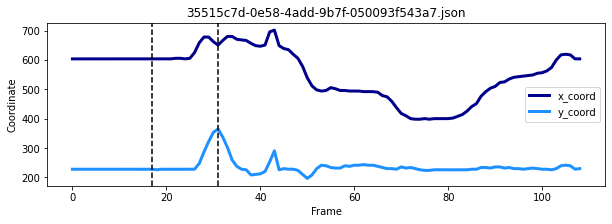

Video 335
End frame: 30


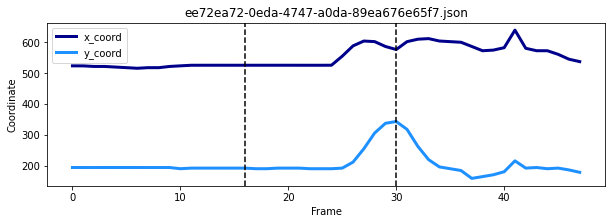

Video 336
End frame: 33
Not enough frames before knee kick.

Video 337
End frame: 32


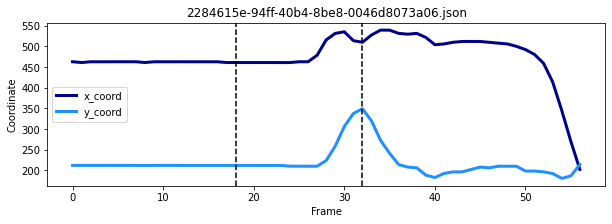

Video 338
End frame: 32


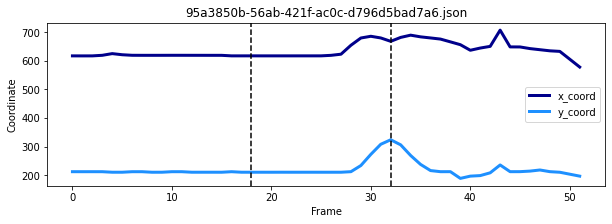

Video 339
End frame: 33


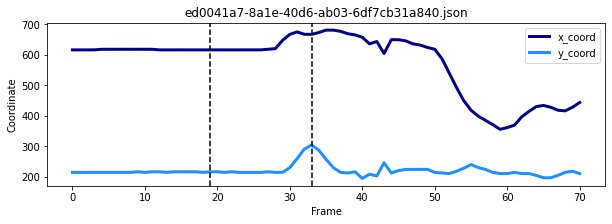

Video 340
End frame: 31


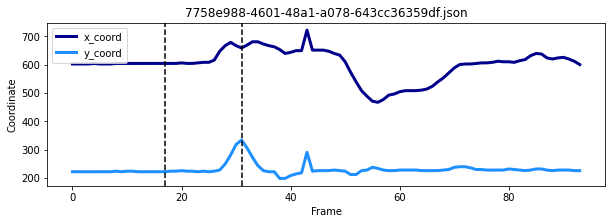

Video 341
End frame: 32


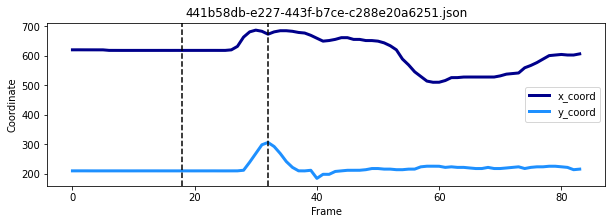

Video 342
End frame: 30


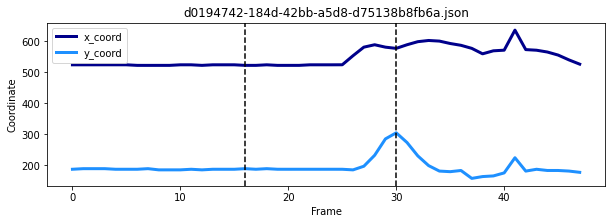

Video 343
End frame: 32


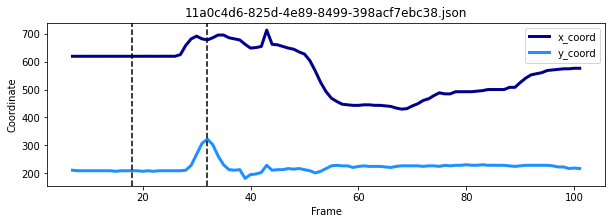

Video 344
End frame: 30


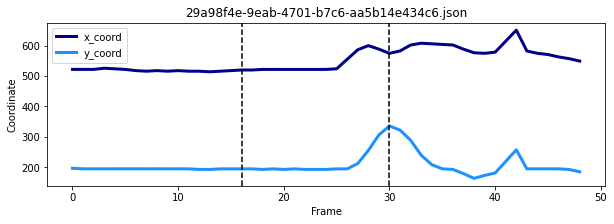

Video 345
End frame: 29


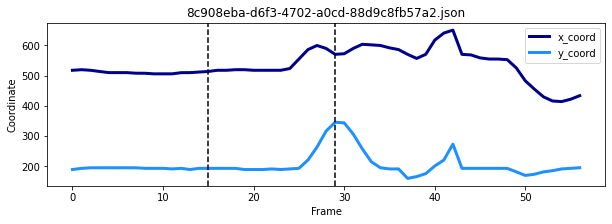

Video 346
End frame: 31


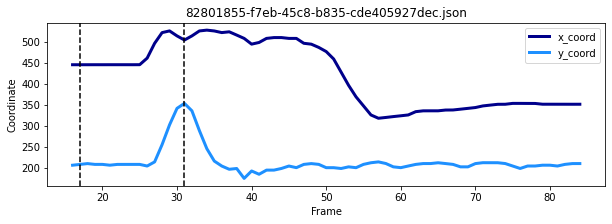

Video 347
End frame: 32


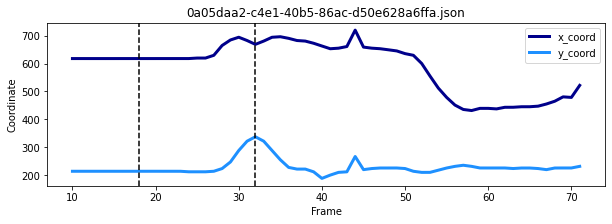

Video 348
End frame: 32


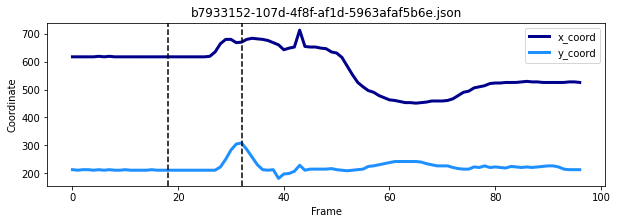

Video 349
End frame: 30


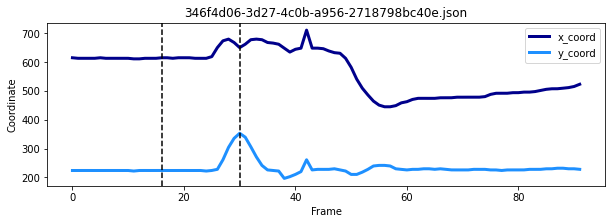

Video 350
End frame: 31


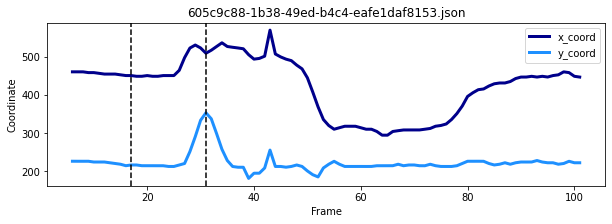

Video 351
End frame: 30


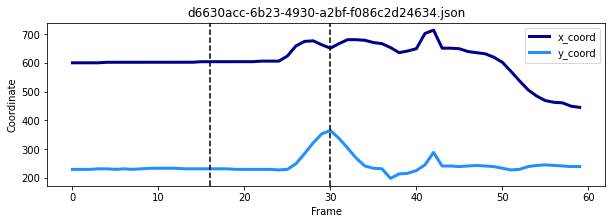

Video 352
End frame: 32


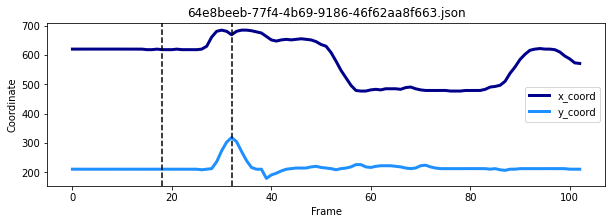

Video 353
End frame: 32
Not enough frames before knee kick.

Video 354
End frame: 32


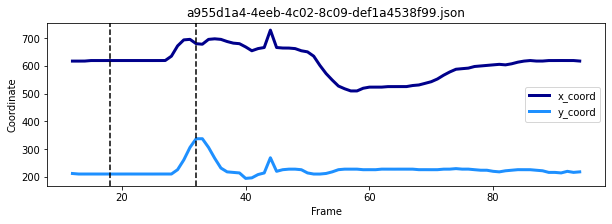

Video 355
End frame: 30


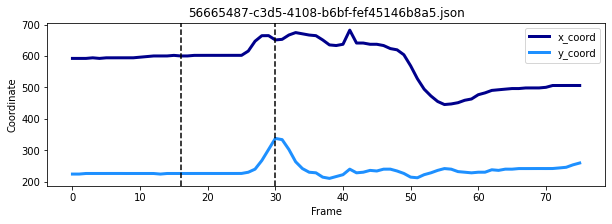

Video 356
End frame: 33


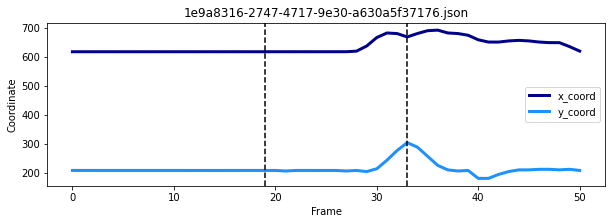

Video 357
End frame: 30


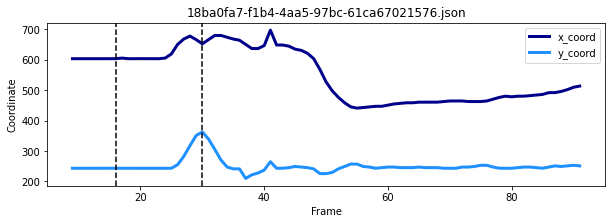

Video 358
End frame: 33


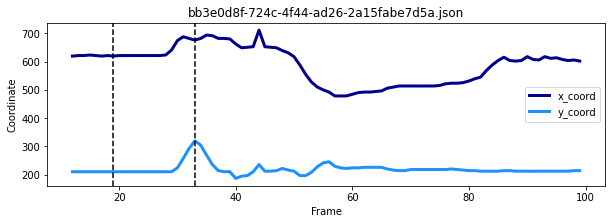

Video 359
End frame: 32
Not enough frames before knee kick.

Video 360
End frame: 31


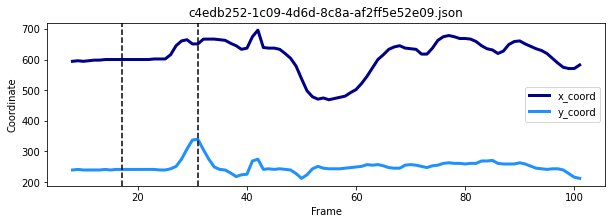

Video 361
End frame: 32
Not enough frames before knee kick.

Video 362
End frame: 31


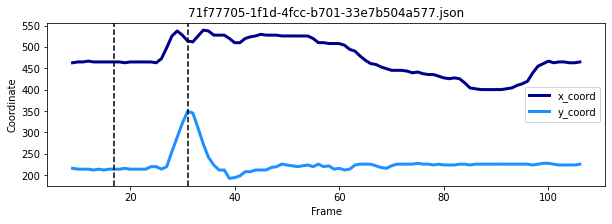

Video 363
End frame: 33


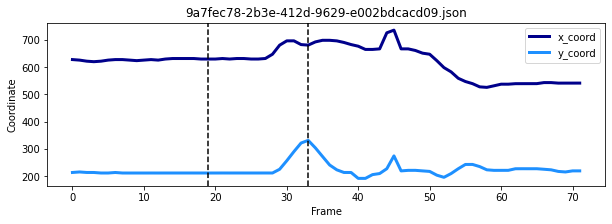

Video 364
End frame: 32


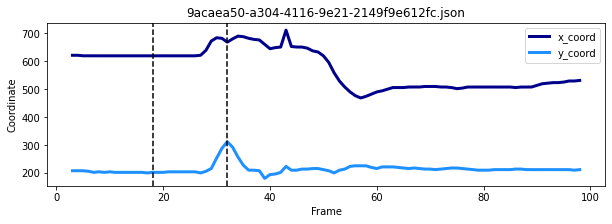

Video 365
End frame: 32
Not enough frames before knee kick.

Video 366
End frame: 32


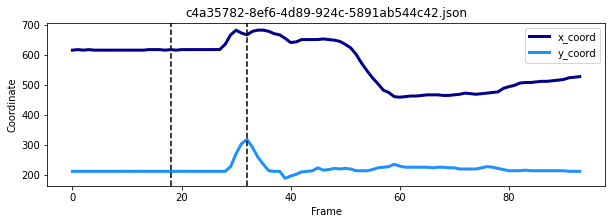

Video 367
End frame: 43
Not enough frames before knee kick.

Video 368
End frame: 32
Not enough frames before knee kick.

Video 369
End frame: 88


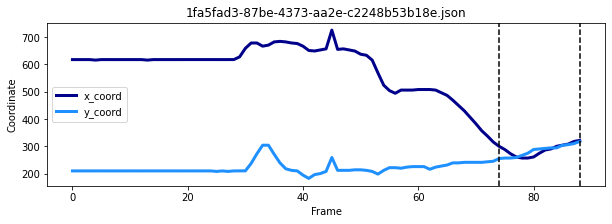

Video 370
End frame: 31


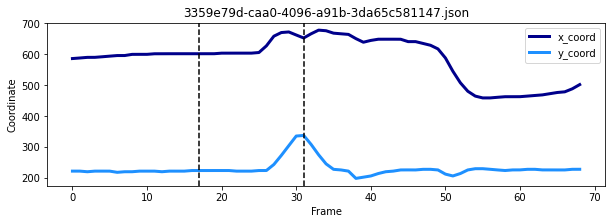

Video 371
End frame: 31


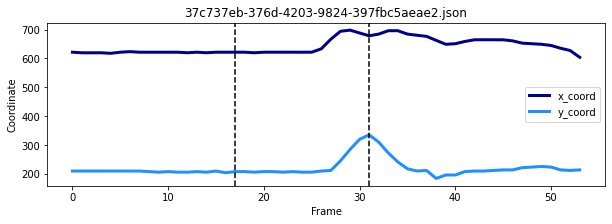

Video 372
End frame: 32
Not enough frames before knee kick.

Video 373
End frame: 31


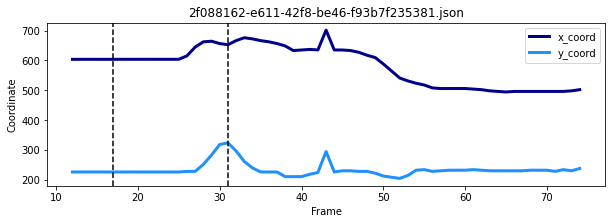

Video 374
End frame: 31


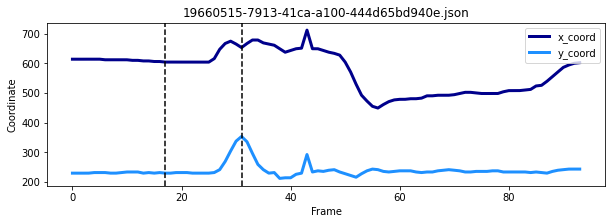

Video 375
End frame: 31


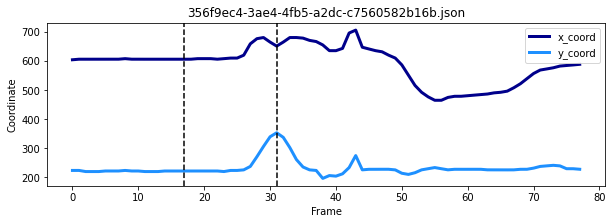

Video 376
End frame: 31


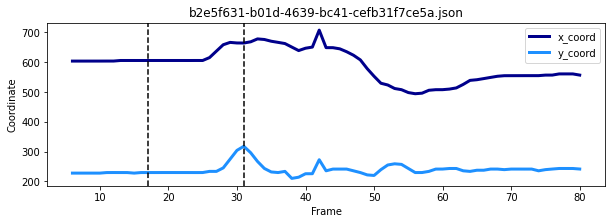

Video 377
End frame: 32
Not enough frames before knee kick.

Video 378
End frame: 31


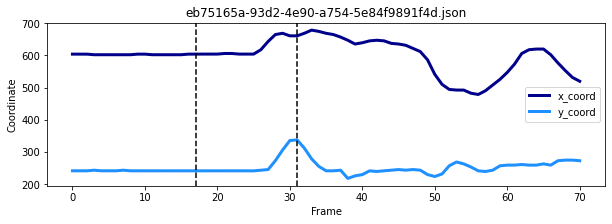

Video 379
End frame: 30


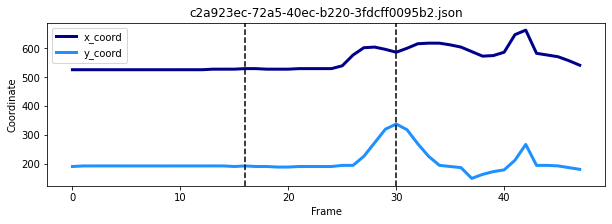

Video 380
End frame: 31
Not enough frames before knee kick.

Video 381
End frame: 31


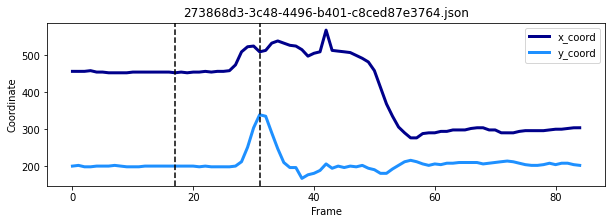

Video 382
End frame: 33


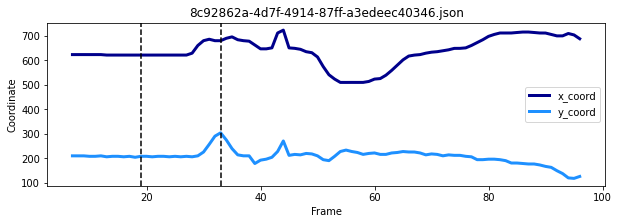

Video 383
End frame: 34


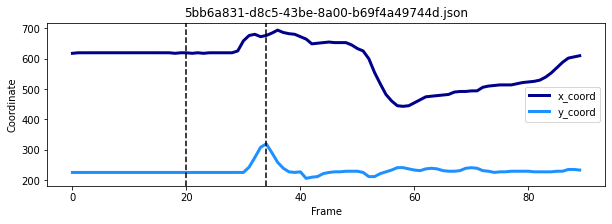

Video 384
End frame: 31


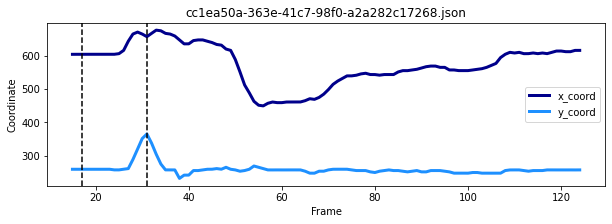

Video 385
End frame: 32


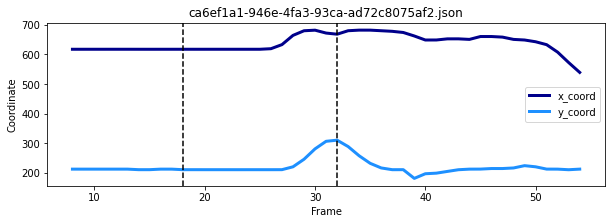

Video 386
End frame: 33


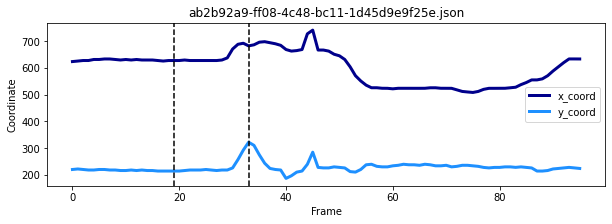

Video 387
End frame: 33
Not enough frames before knee kick.

Video 388
End frame: 30


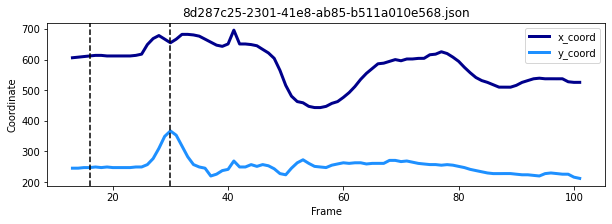

Video 389
End frame: 33


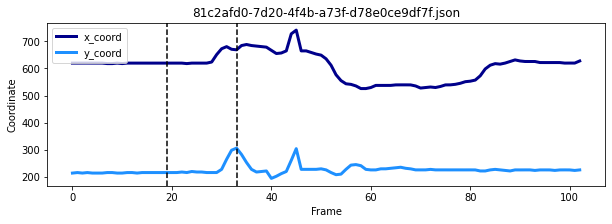

Video 390
End frame: 31


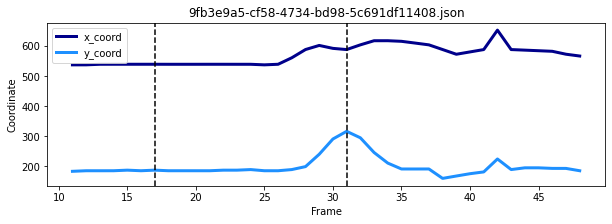

Video 391
End frame: 33


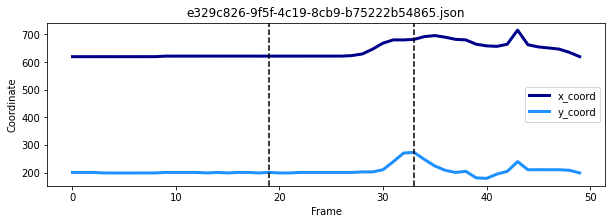

Video 392
End frame: 32


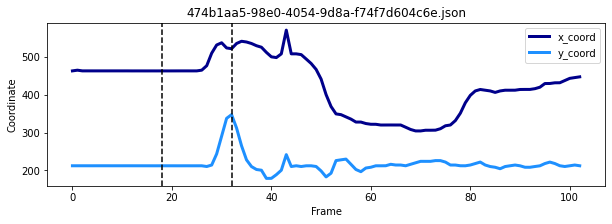

Video 393
End frame: 32


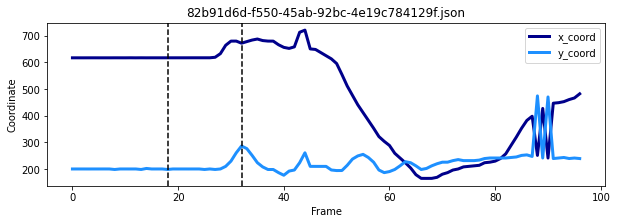

Video 394
End frame: 31


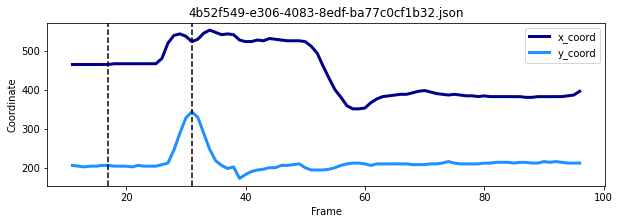

Video 395
End frame: 32


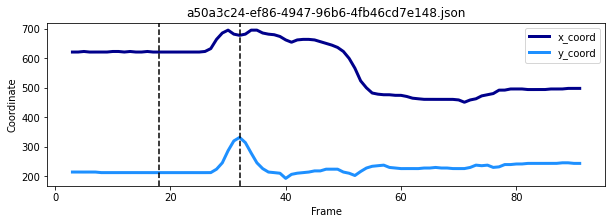

Video 396
End frame: 30


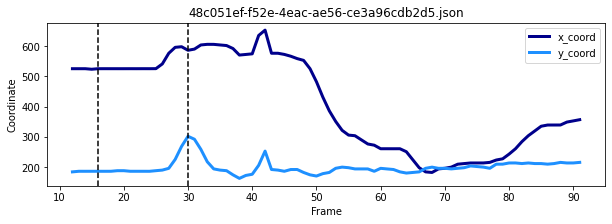

Video 397
End frame: 32


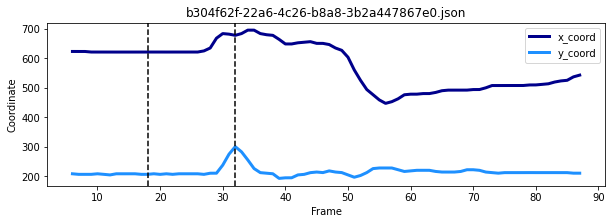

Video 398
End frame: 29


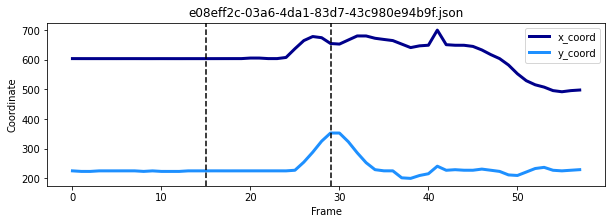

Video 399
End frame: 31


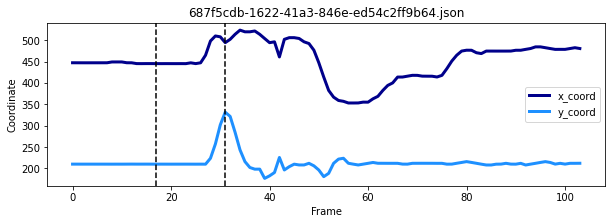

Video 400
End frame: 32


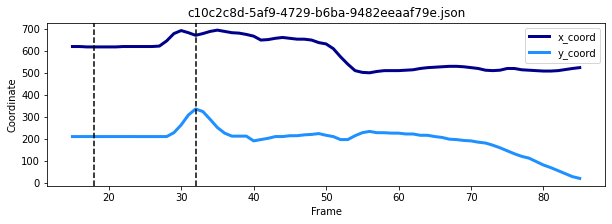

Video 401
End frame: 30


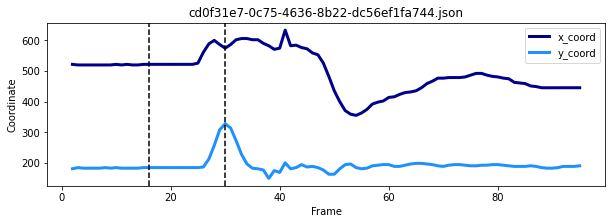

Video 402
End frame: 31


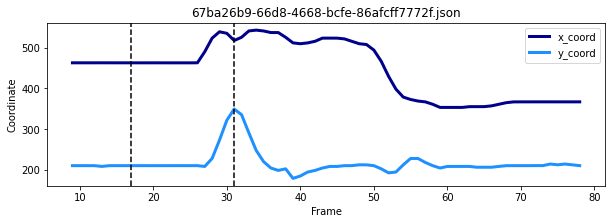

Video 403
End frame: 32
Not enough frames before knee kick.

Video 404
End frame: 32


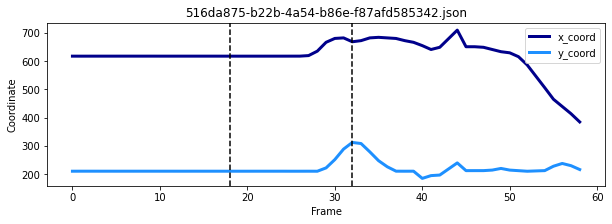

Video 405
End frame: 32


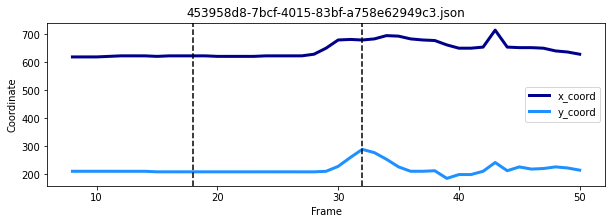

Video 406
End frame: 33
Not enough frames before knee kick.

Video 407
End frame: 30


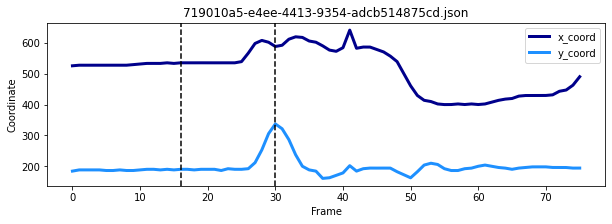

Video 408
End frame: 32


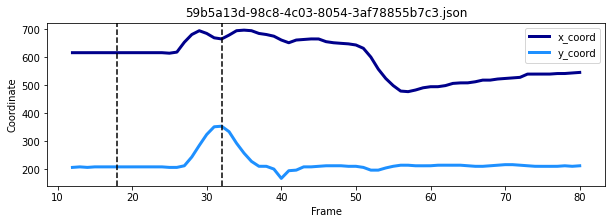

Video 409
End frame: 33


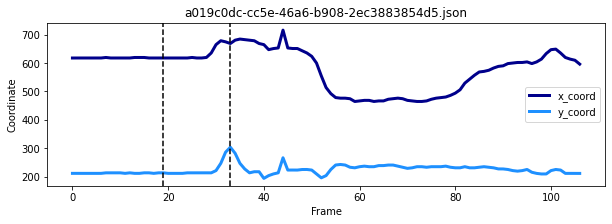

Video 410
End frame: 30


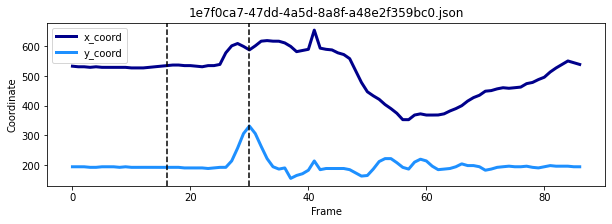

Video 411
End frame: 33


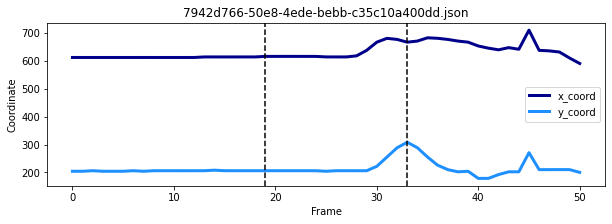

Video 412
End frame: 32


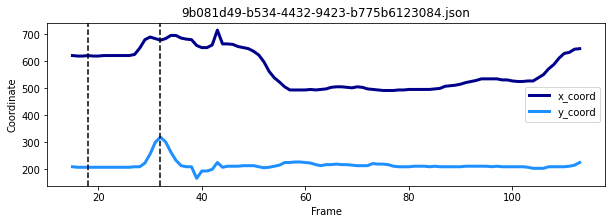

Video 413
End frame: 33


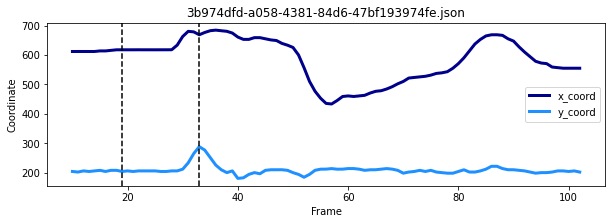

Video 414
End frame: 31


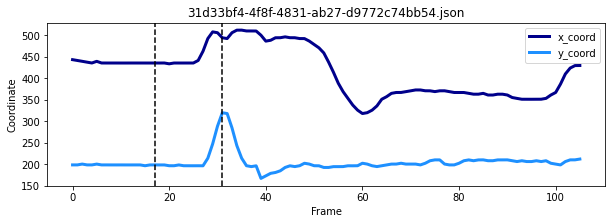

Video 415
End frame: 31


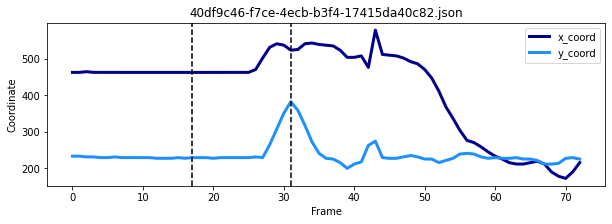

Video 416
End frame: 30


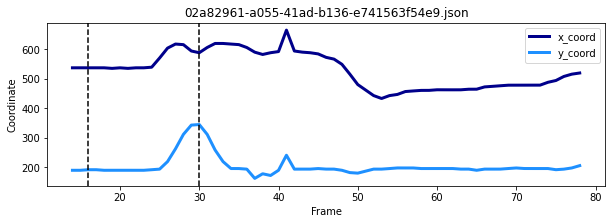

Video 417
End frame: 31


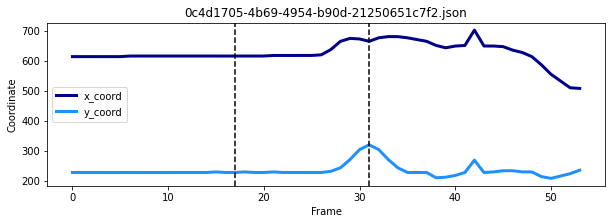

Video 418
End frame: 33


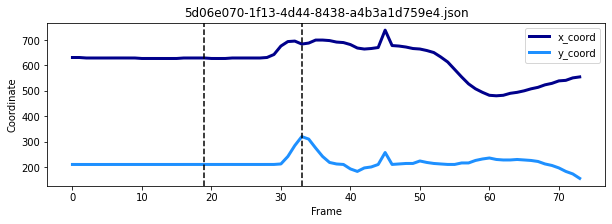

Video 419
End frame: 30


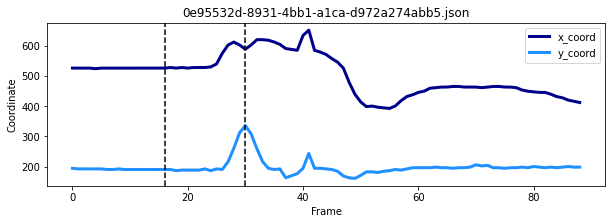

Video 420
End frame: 32


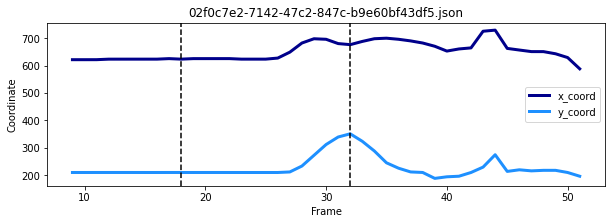

Video 421
End frame: 31


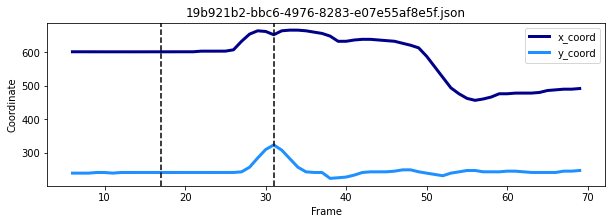

Video 422
End frame: 30


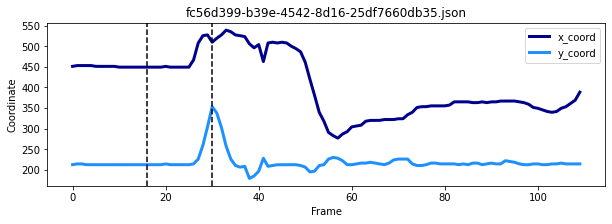

Video 423
End frame: 31


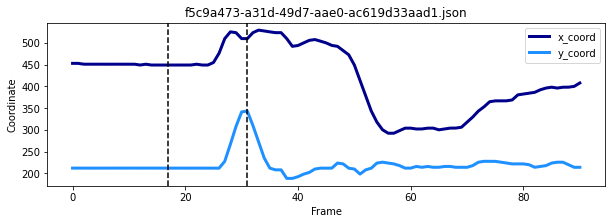

Video 424
End frame: 31
Not enough frames before knee kick.

Video 425
End frame: 87


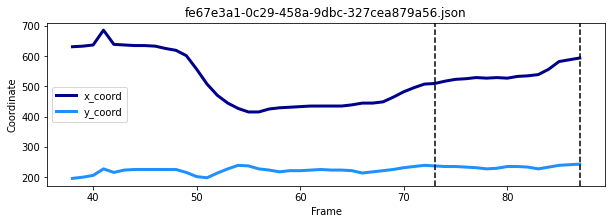

Video 426
End frame: 33


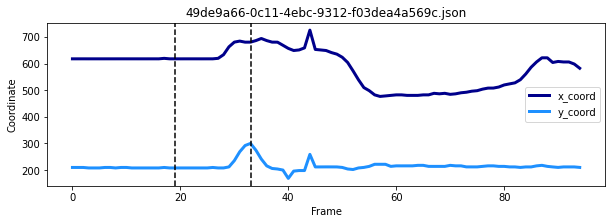

Video 427
End frame: 33


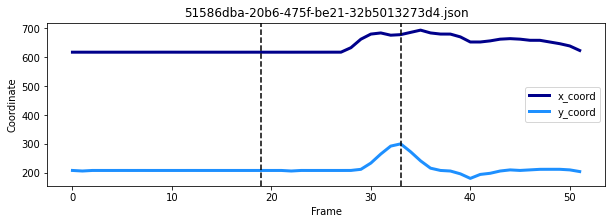

Video 428
End frame: 43
Not enough frames before knee kick.

Video 429
End frame: 32
Not enough frames before knee kick.

Video 430
End frame: 30


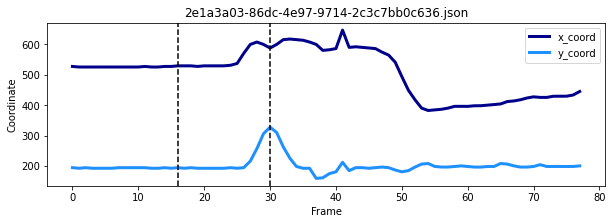

Video 431
End frame: 30


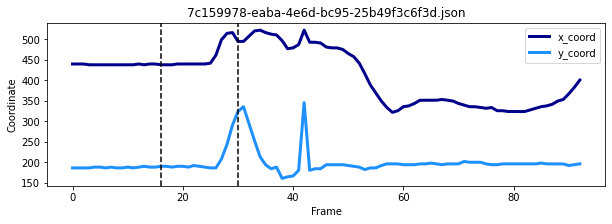

Video 432
End frame: 55


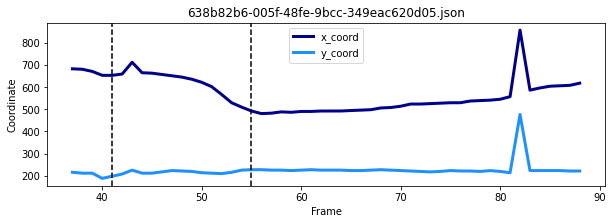

Video 433
End frame: 31
Not enough frames before knee kick.

Video 434
End frame: 33


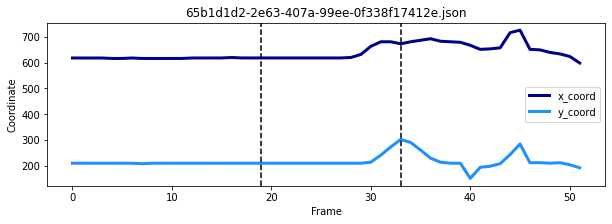

Video 435
End frame: 31


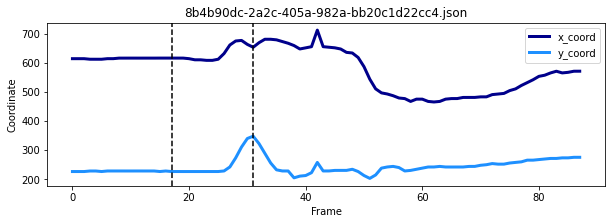

Video 436
End frame: 44
Not enough frames before knee kick.

Video 437
End frame: 31


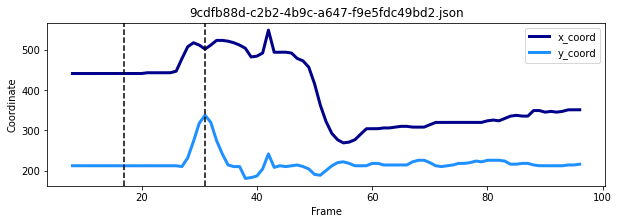

Video 438
End frame: 31


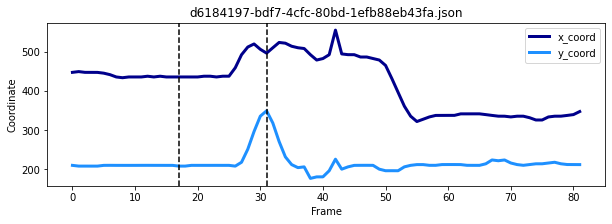

Video 439
End frame: 30


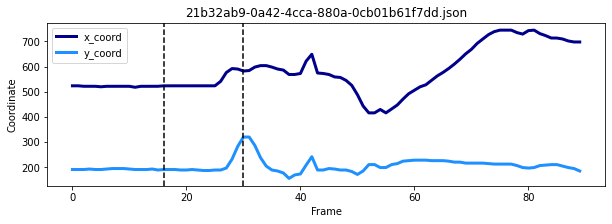

Video 440
End frame: 32


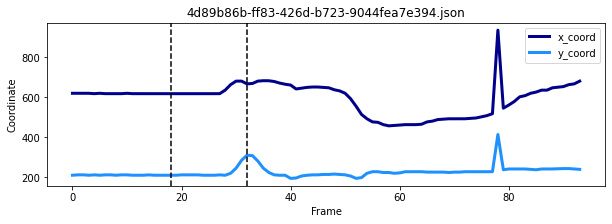

Video 441
End frame: 33


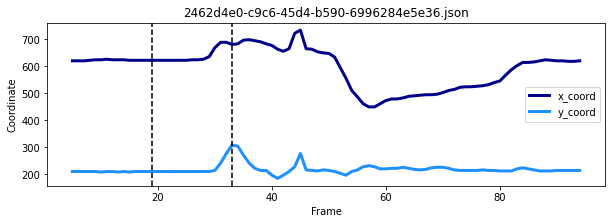

Video 442
End frame: 30


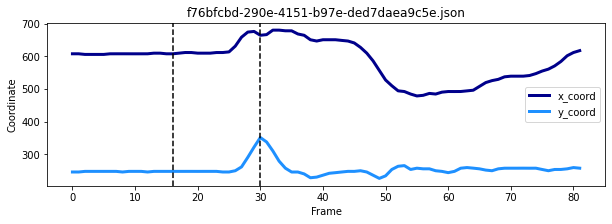

Video 443
End frame: 31


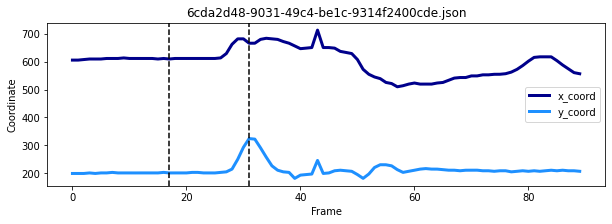

Video 444
End frame: 33


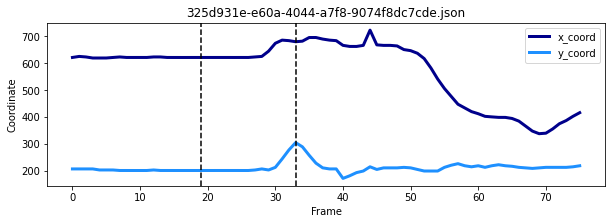

Video 445
End frame: 33


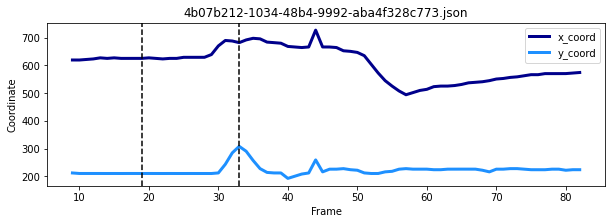

Video 446
End frame: 32


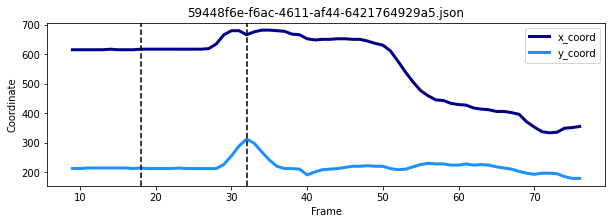

Video 447
End frame: 32


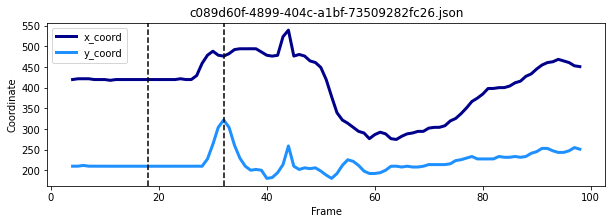

Video 448
End frame: 31


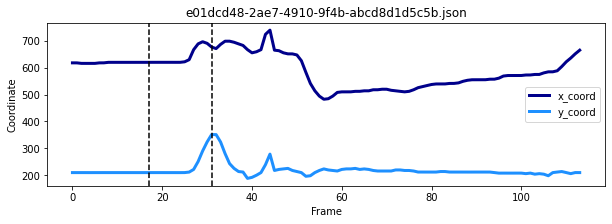

Video 449
End frame: 31


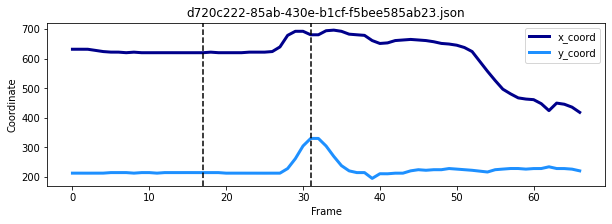

Video 450
End frame: 31
Not enough frames before knee kick.

Video 451
End frame: 30


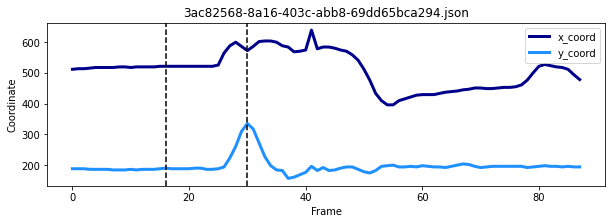

Video 452
End frame: 32


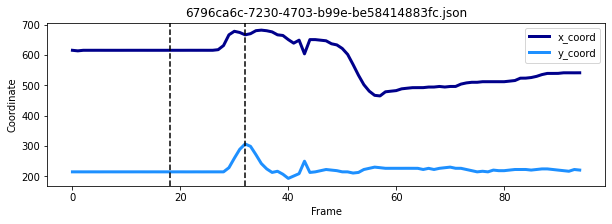

Video 453
End frame: 30
Not enough frames before knee kick.

Video 454
End frame: 33


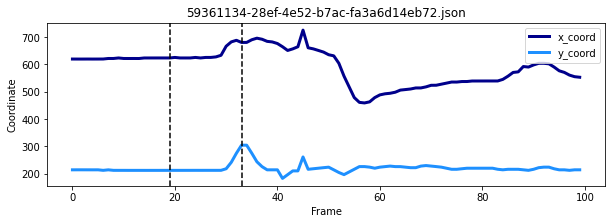

Video 455
End frame: 32


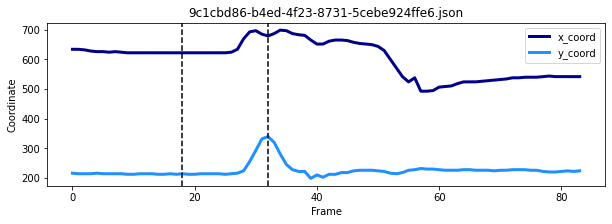

Video 456
End frame: 33
Not enough frames before knee kick.

Video 457
End frame: 32


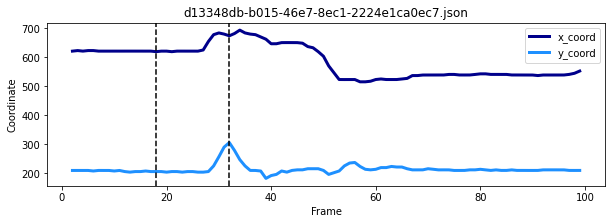

Video 458
End frame: 33


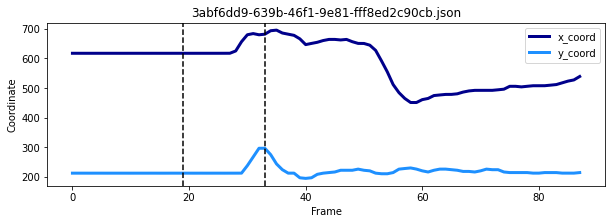

Video 459
End frame: 31


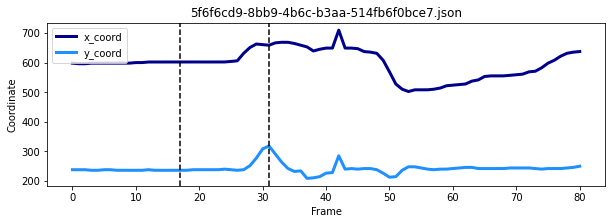

Video 460
End frame: 32


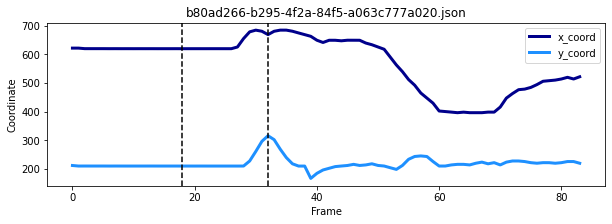

Video 461
End frame: 32


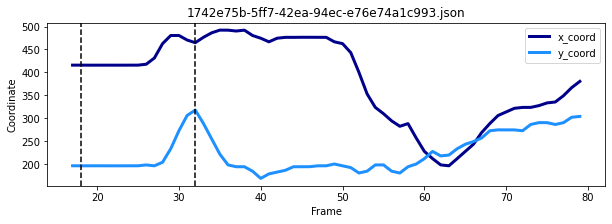

Video 462
End frame: 32


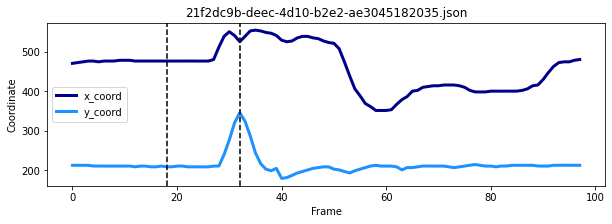

Video 463
End frame: 32
Not enough frames before knee kick.

Video 464
End frame: 32


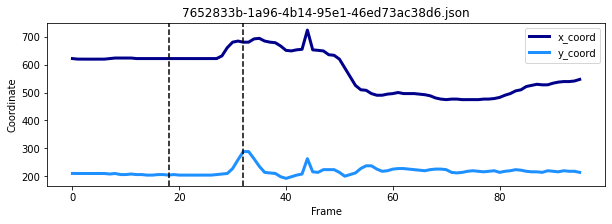

Video 465
End frame: 32


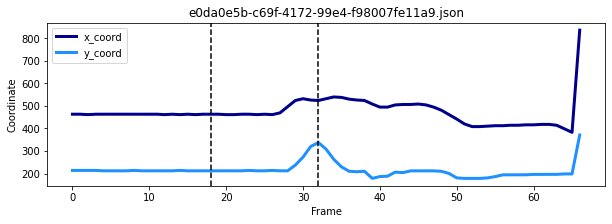

Video 466
End frame: 32


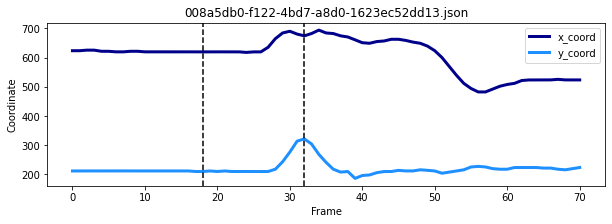

Video 467
End frame: 33


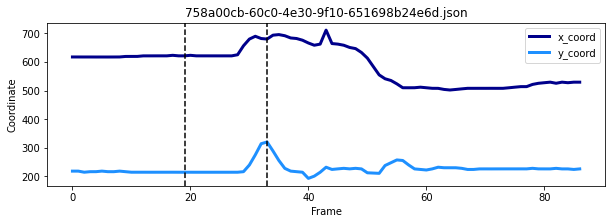

Video 468
End frame: 9
Not enough frames before knee kick.

Video 469
End frame: 31


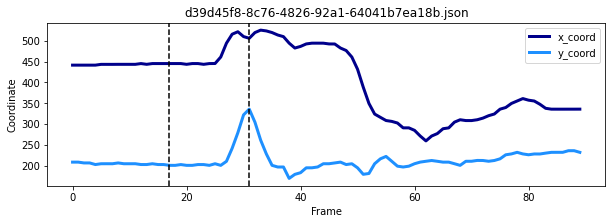

Video 470
End frame: 33


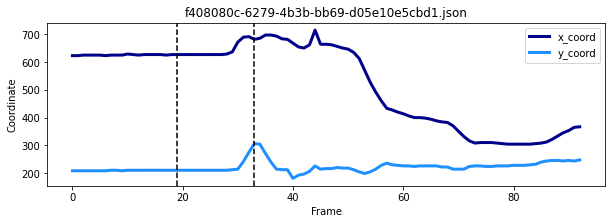

Video 471
End frame: 32


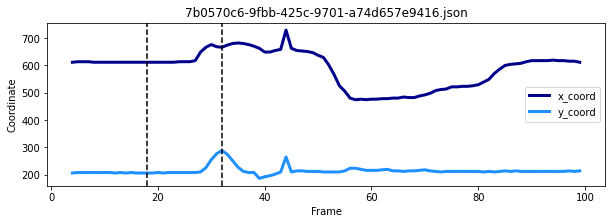

Video 472
End frame: 94


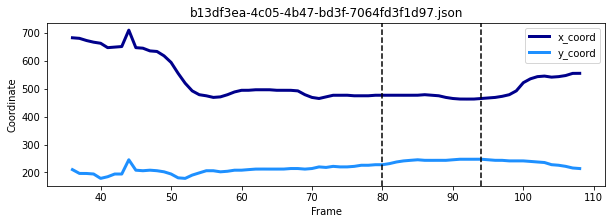

Video 473
End frame: 30


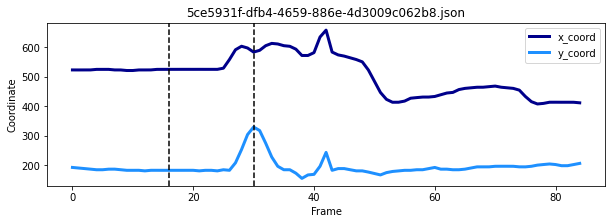

Video 474
End frame: 32


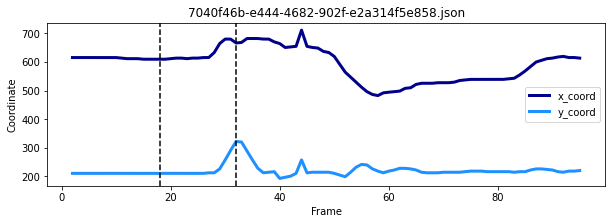

Video 475
End frame: 30


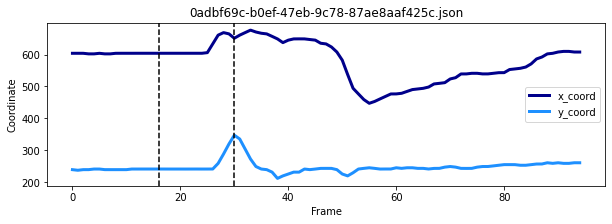

Video 476
End frame: 32
Not enough frames before knee kick.

Video 477
End frame: 33


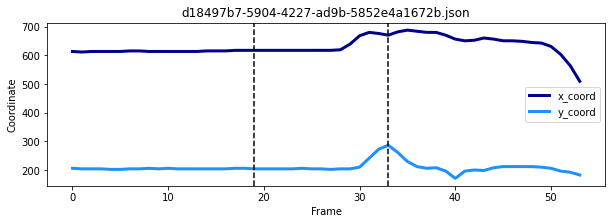

Video 478
End frame: 31
Not enough frames before knee kick.

Video 479
End frame: 30


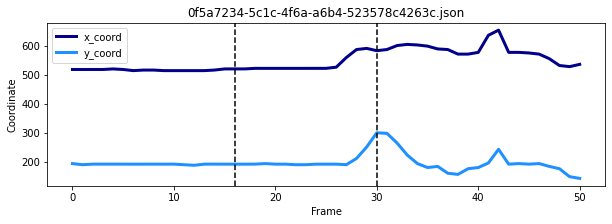

Video 480
End frame: 31
Not enough frames before knee kick.

Video 481
End frame: 32


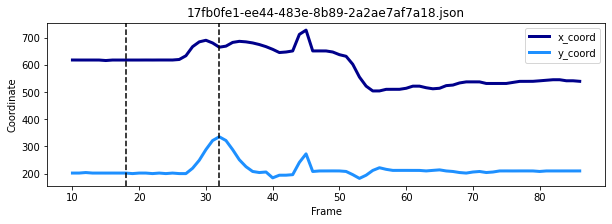

Video 482
End frame: 32


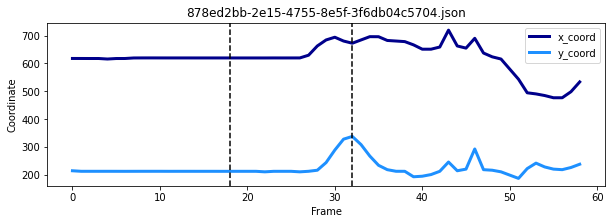

Video 483
End frame: 31


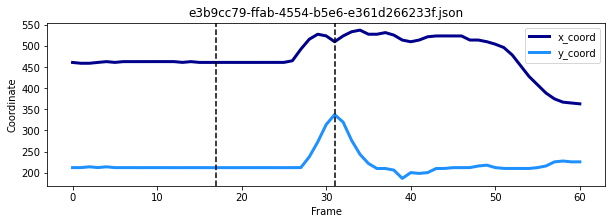

Video 484
End frame: 31


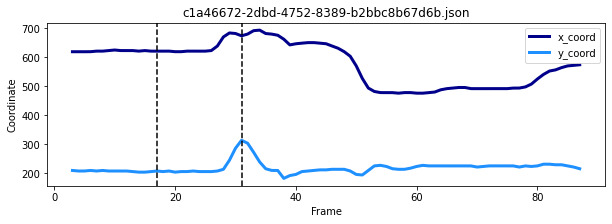

Video 485
End frame: 33


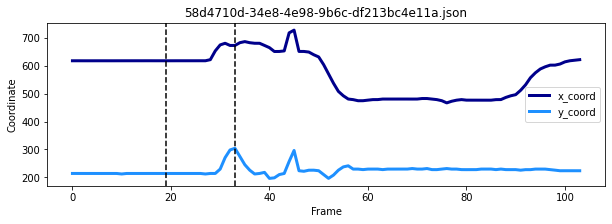

Video 486
End frame: 31
Not enough frames before knee kick.

Video 487
End frame: 30


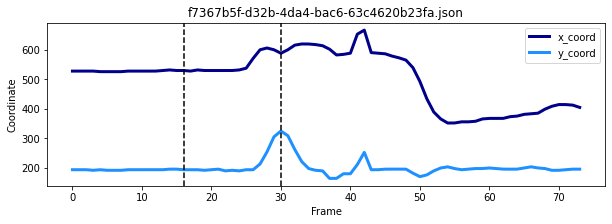

Video 488
End frame: 32


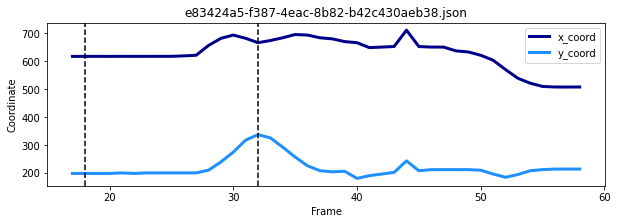

Video 489
End frame: 32
Not enough frames before knee kick.

Video 490
End frame: 32


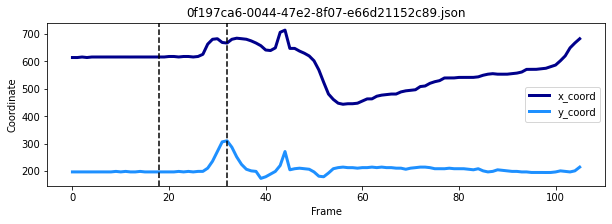

Video 491
End frame: 32


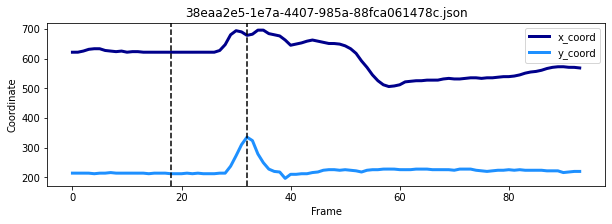

Video 492
End frame: 30


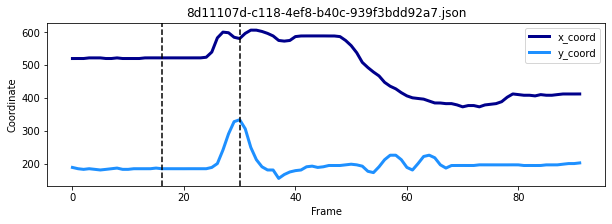

Video 493
End frame: 31
Not enough frames before knee kick.

Video 494
End frame: 31


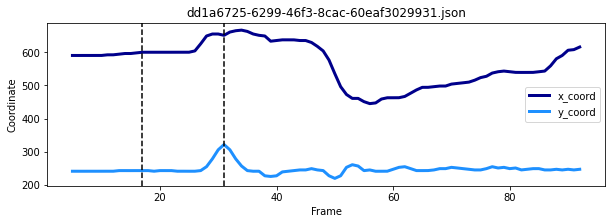

Video 495
End frame: 32
Not enough frames before knee kick.

Video 496
End frame: 30
Not enough frames before knee kick.

Video 497
End frame: 31


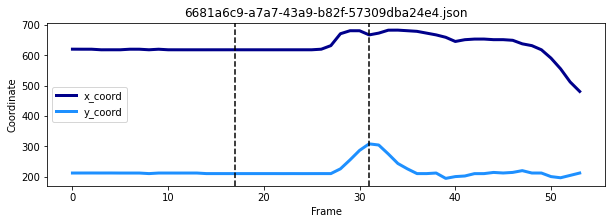

Video 498
End frame: 32


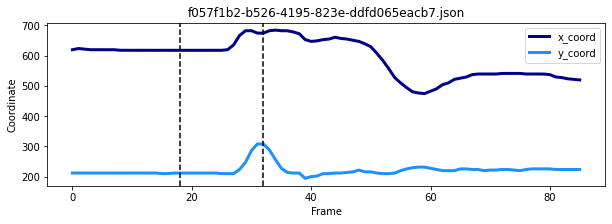

Video 499
End frame: 32
Not enough frames before knee kick.

Video 500
End frame: 29


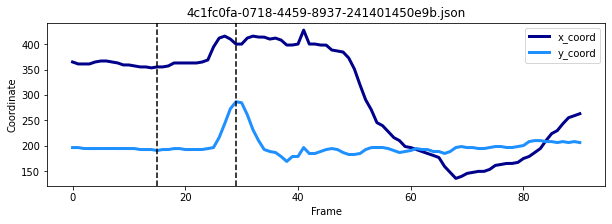

Video 501
End frame: 31
Not enough frames before knee kick.

Video 502
End frame: 32


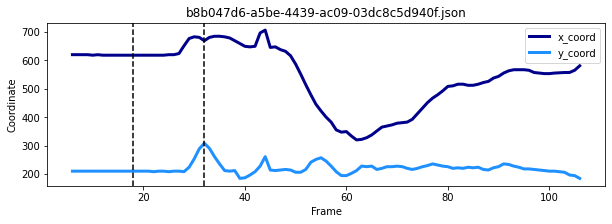

Video 503
End frame: 33


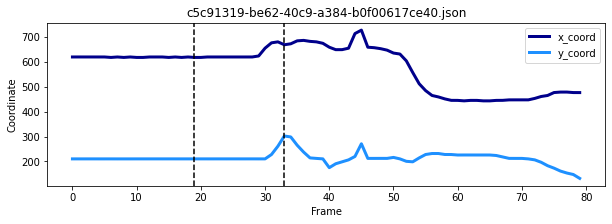

Video 504
End frame: 32


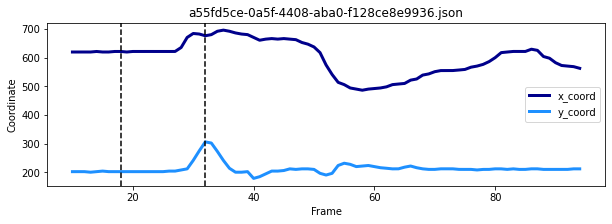

Video 505
End frame: 50
Not enough frames before knee kick.

Video 506
End frame: 31
Not enough frames before knee kick.

Video 507
End frame: 30


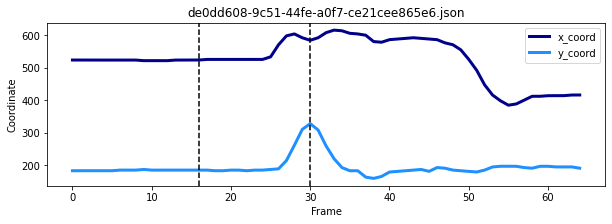

Video 508
End frame: 31


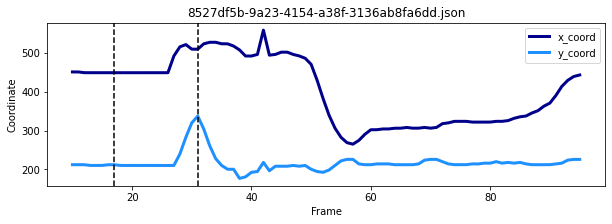

Video 509
End frame: 31


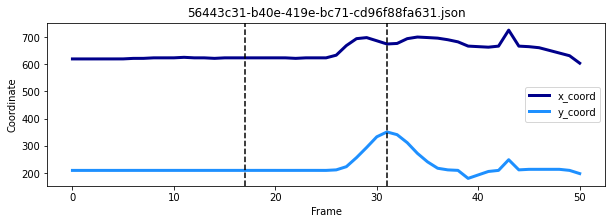

Video 510
End frame: 31


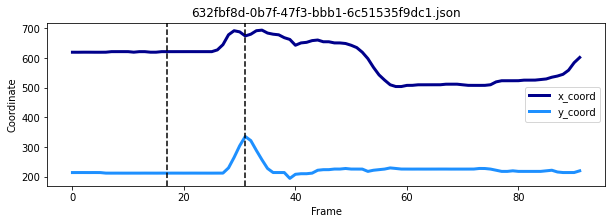

Video 511
End frame: 31


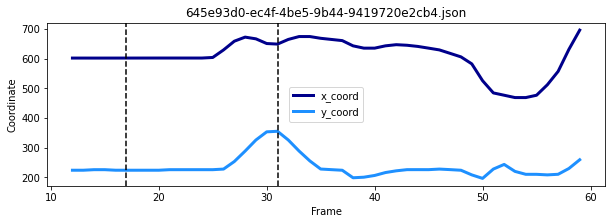

Video 512
End frame: 32


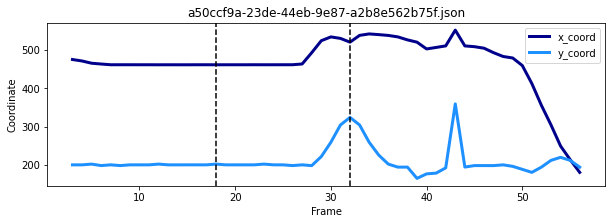

Video 513
End frame: 31


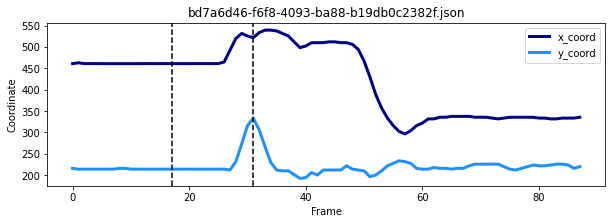

Video 514
End frame: 33


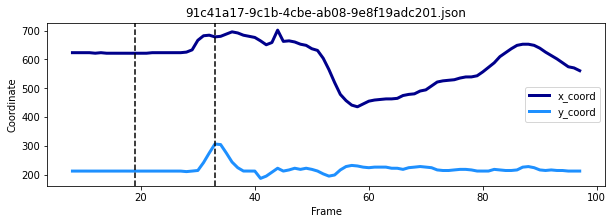

Video 515
End frame: 33


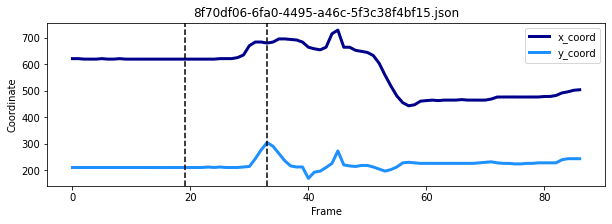

Video 516
End frame: 33


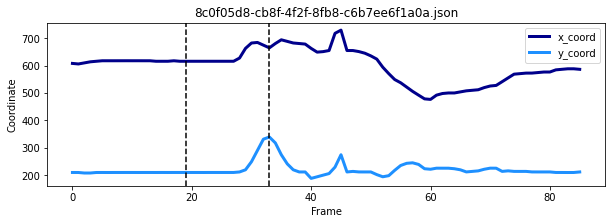

Video 517
End frame: 29


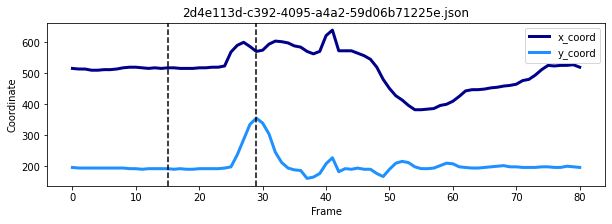

Video 518
End frame: 30


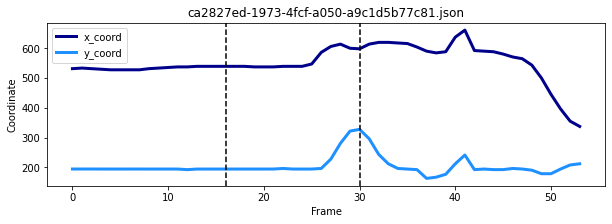

Video 519
End frame: 33


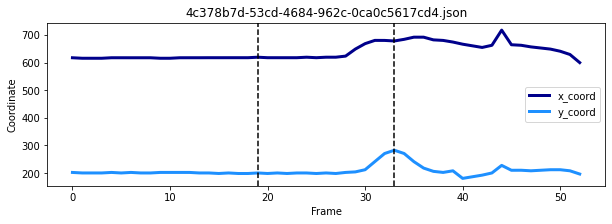

Video 520
End frame: 33


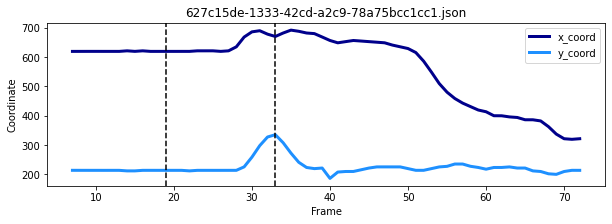

Video 521
End frame: 30


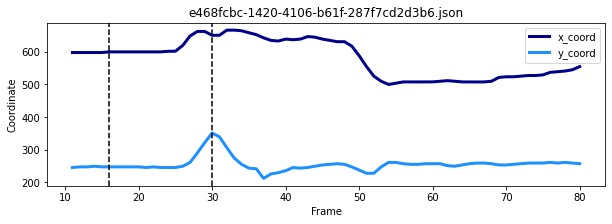

Video 522
End frame: 31


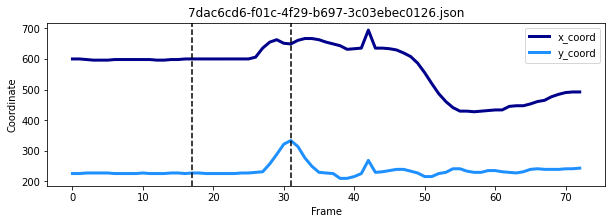

Video 523
End frame: 30


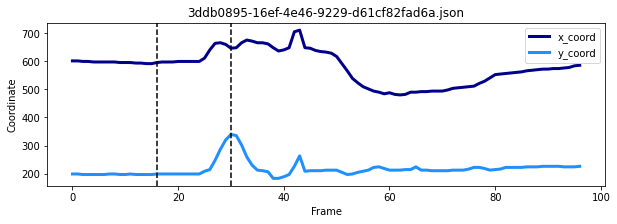

Video 524
End frame: 30


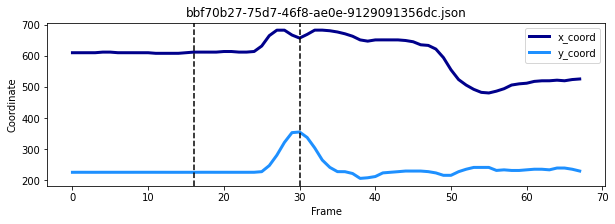

Video 525
End frame: 34
Not enough frames before knee kick.

Video 526
End frame: 31


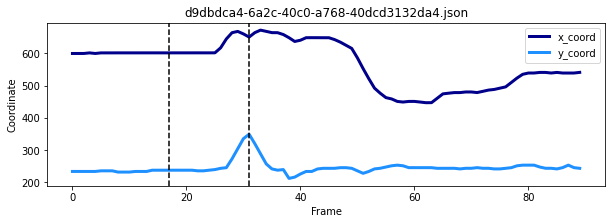

Video 527
End frame: 32
Not enough frames before knee kick.

Video 528
End frame: 30
Not enough frames before knee kick.

Video 529
End frame: 31


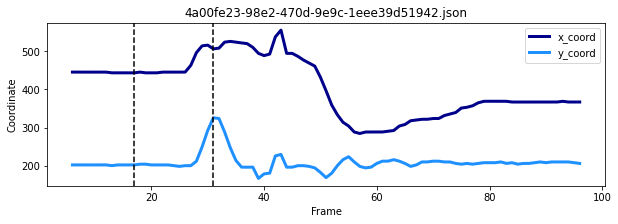

Video 530
End frame: 30


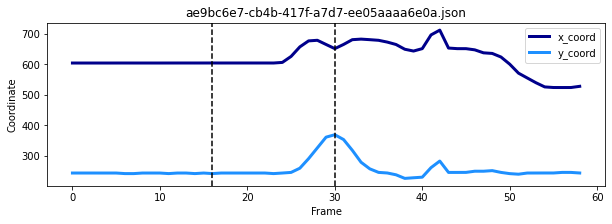

Video 531
End frame: 31
Not enough frames before knee kick.

Video 532
End frame: 30
Not enough frames before knee kick.

Video 533
End frame: 30


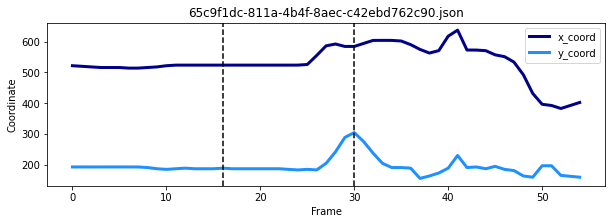

Video 534
End frame: 33
Not enough frames before knee kick.

Video 535
End frame: 31


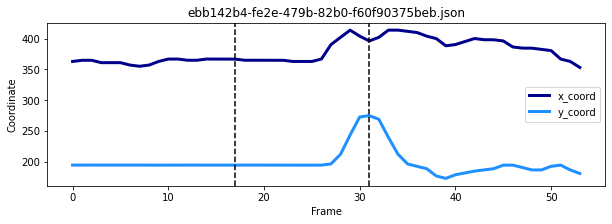

Video 536
End frame: 30


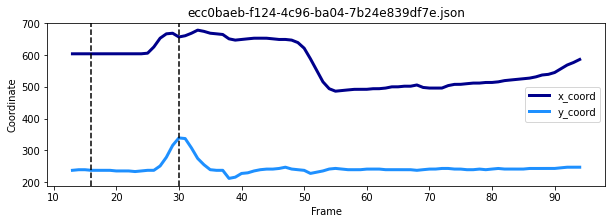

Video 537
End frame: 31


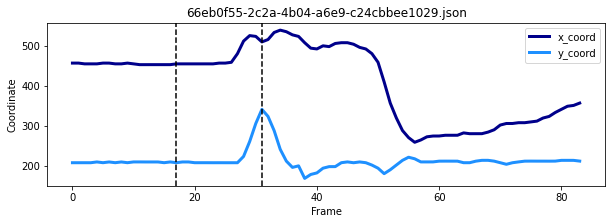

Video 538
End frame: 32


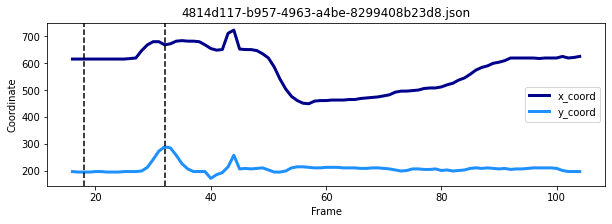

Video 539
End frame: 30


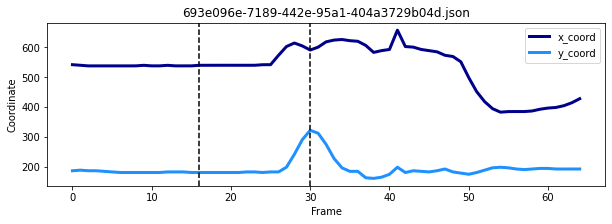

Video 540
End frame: 30


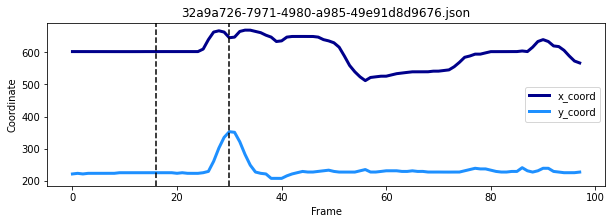

Video 541
End frame: 32


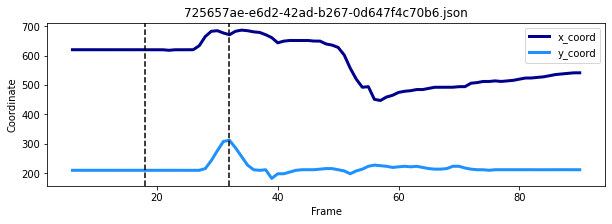

Video 542
End frame: 34


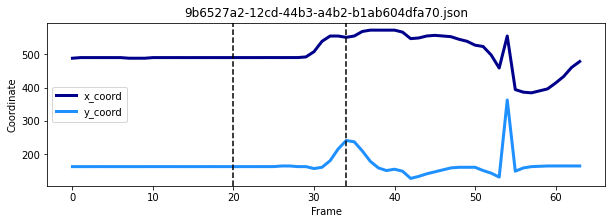

Video 543
End frame: 33


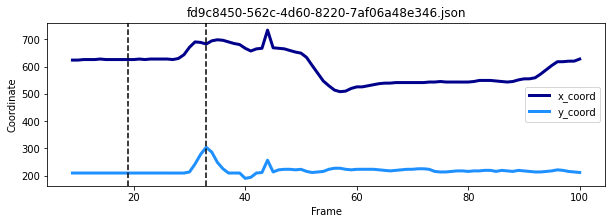

Video 544
End frame: 30


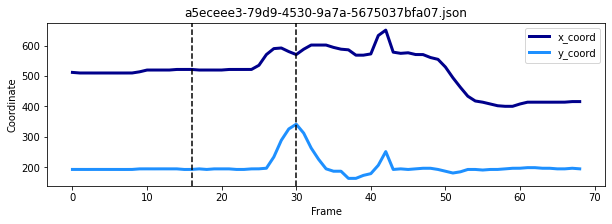

Video 545
End frame: 32


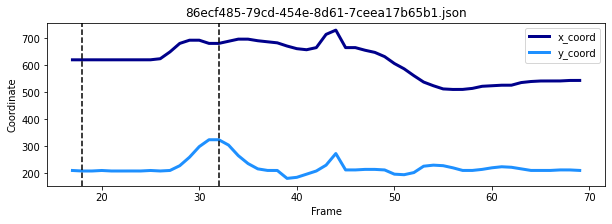

Video 546
End frame: 31


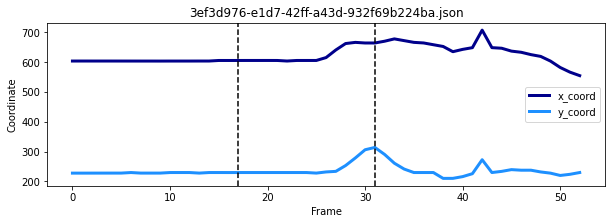

Video 547
End frame: 32


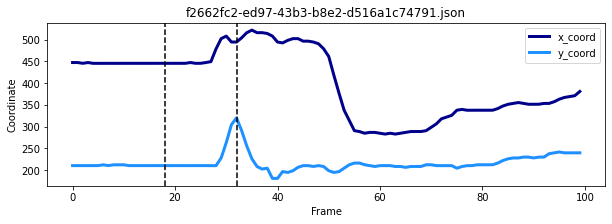

Video 548
End frame: 30


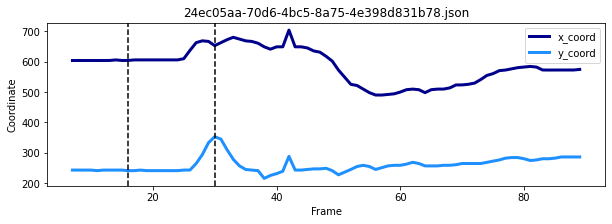

Video 549
End frame: 32


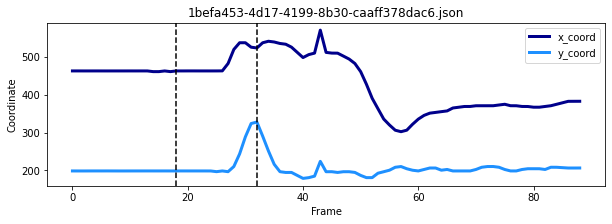

Video 550
End frame: 30


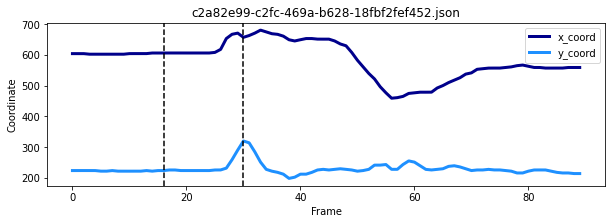

Video 551
End frame: 32


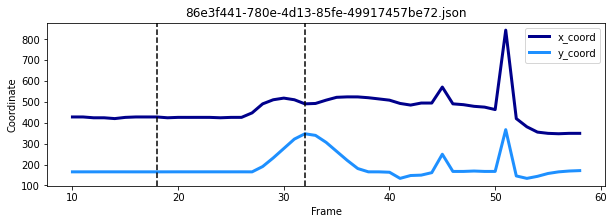

Video 552
End frame: 32


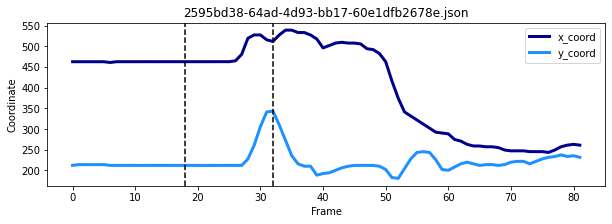

Video 553
End frame: 18


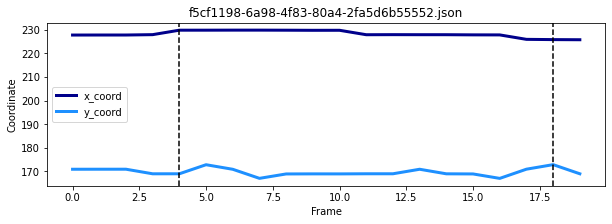

Video 554
End frame: 31
Not enough frames before knee kick.

Video 555
End frame: 30
Not enough frames before knee kick.

Video 556
End frame: 30


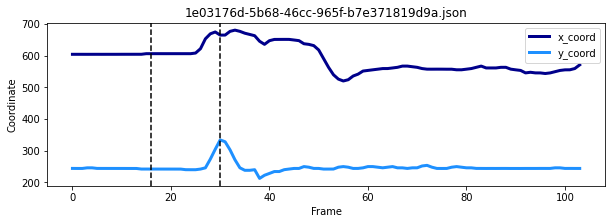

Video 557
End frame: 31


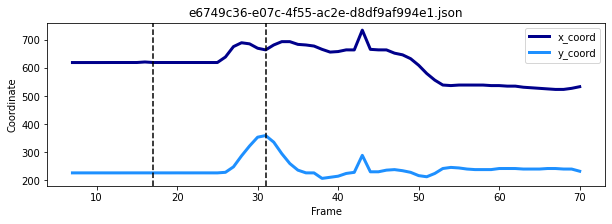

Video 558
End frame: 32


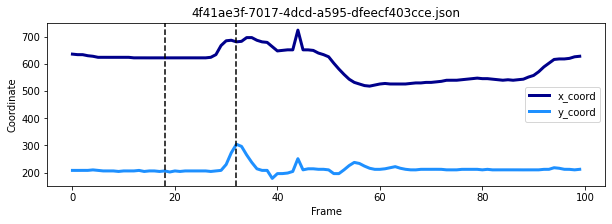

Video 559
End frame: 33


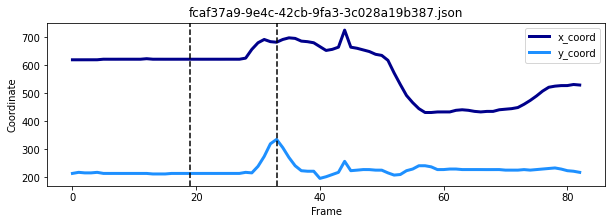

Video 560
End frame: 31


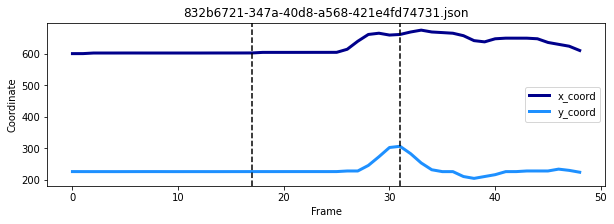

Video 561
End frame: 31


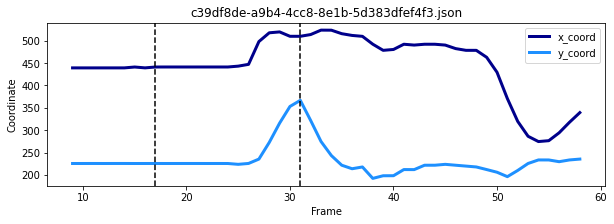

Video 562
End frame: 30


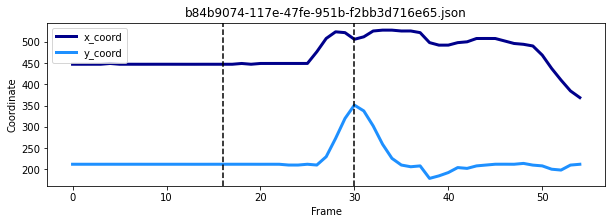

Video 563
End frame: 32


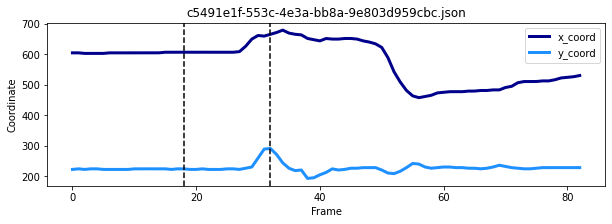

Video 564
End frame: 33


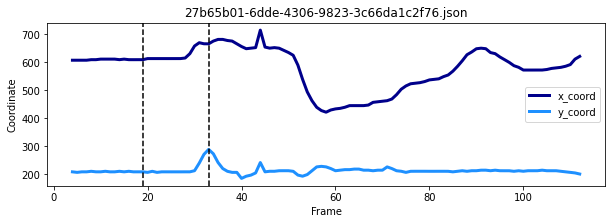

Video 565
End frame: 30


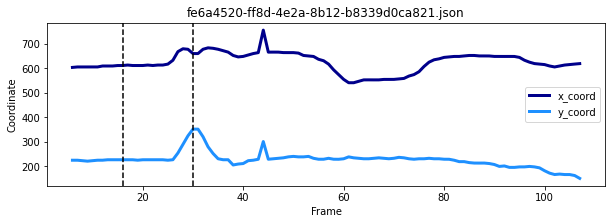

Video 566
End frame: 31


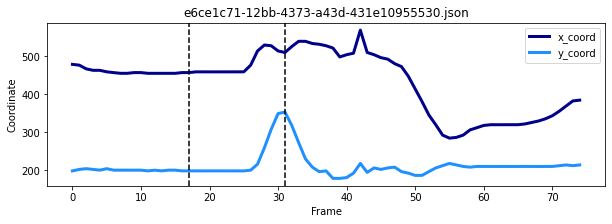

Video 567
End frame: 32


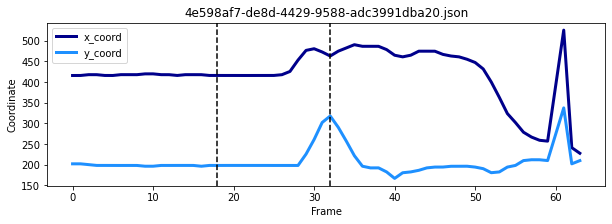

Video 568
End frame: 33


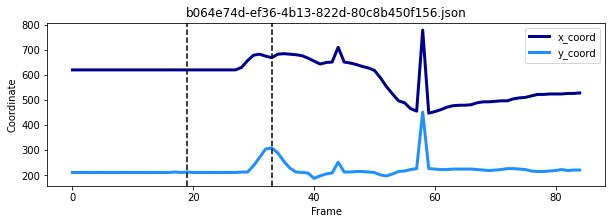

Video 569
End frame: 32


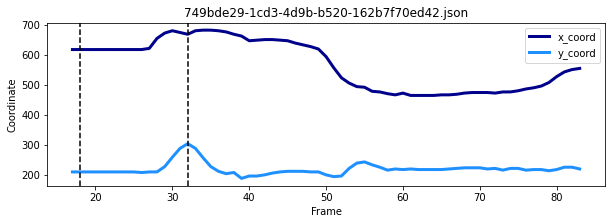

Video 570
End frame: 0
Not enough frames before knee kick.

Video 571
End frame: 30


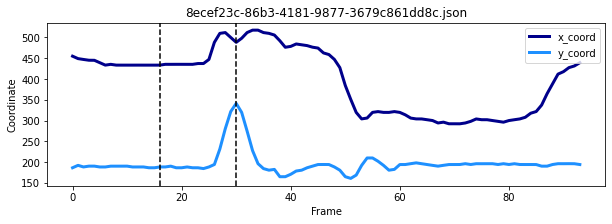

Video 572
End frame: 30


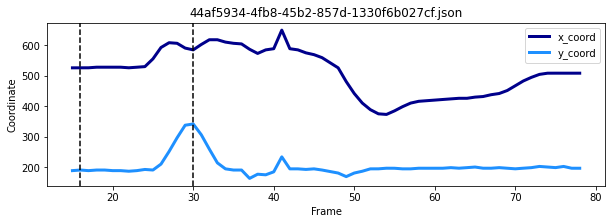

Video 573
End frame: 30


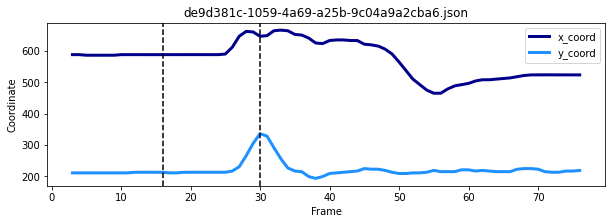

Video 574
End frame: 33


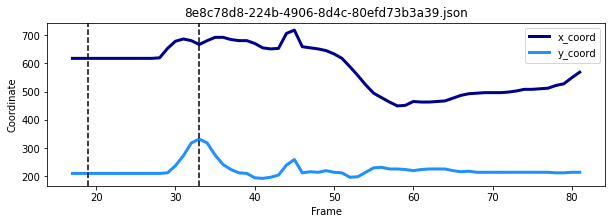

Video 575
End frame: 31


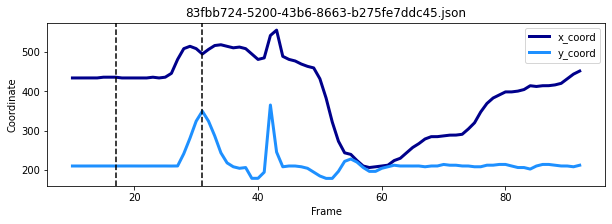

Video 576
End frame: 30


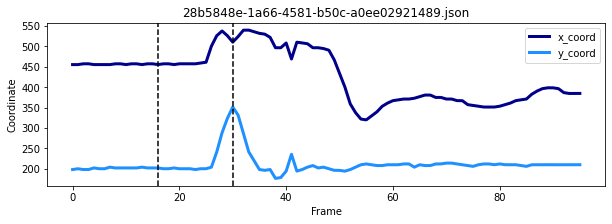

Video 577
End frame: 32


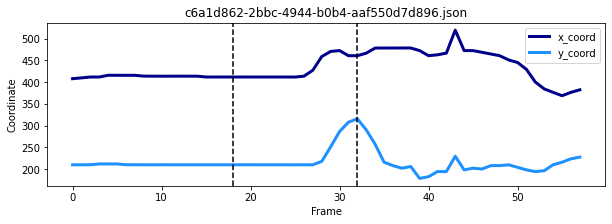

Video 578
End frame: 31


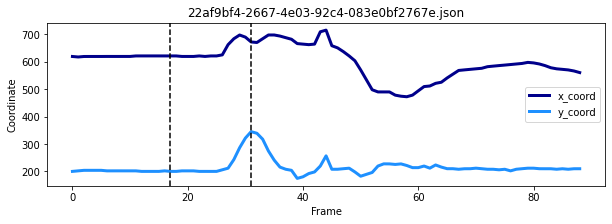

Video 579
End frame: 31


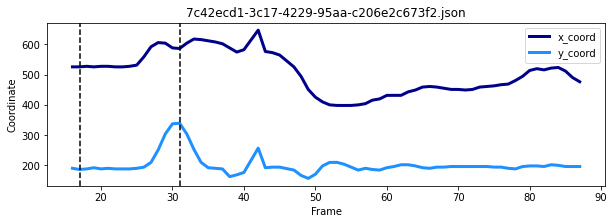

Video 580
End frame: 30


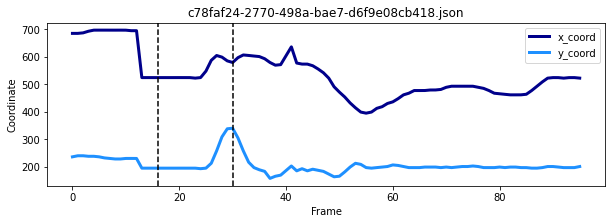

Video 581
End frame: 30


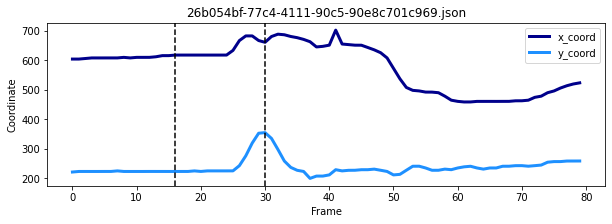

Video 582
End frame: 32


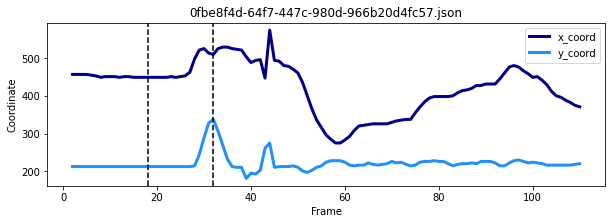

Video 583
End frame: 32


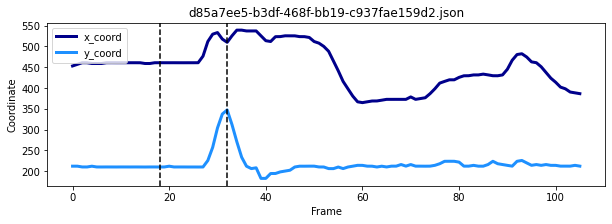

Video 584
End frame: 31


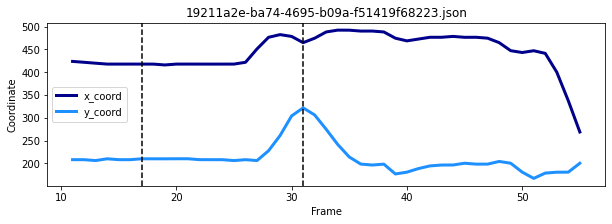

Video 585
End frame: 31


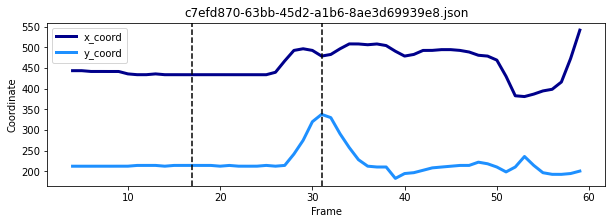

Video 586
End frame: 31


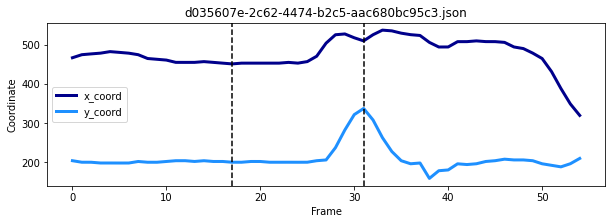

Video 587
End frame: 31


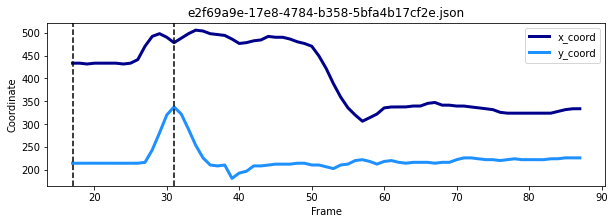

Video 588
End frame: 34


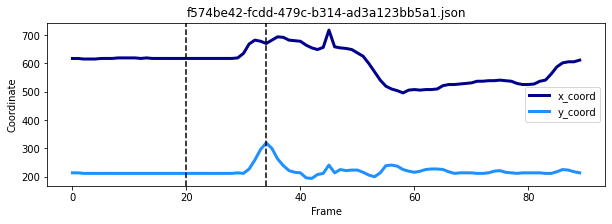

Video 589
End frame: 32


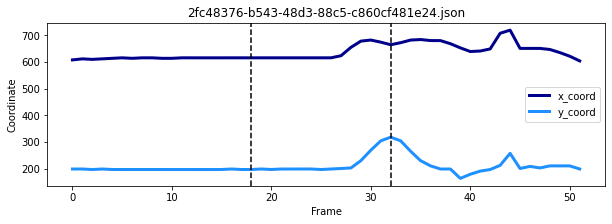

Video 590
End frame: 33


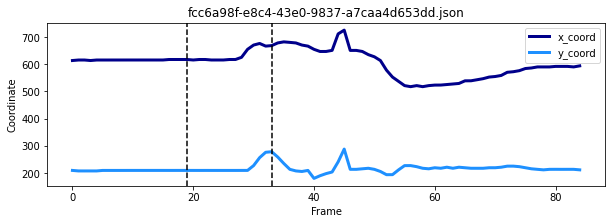

Video 591
End frame: 30


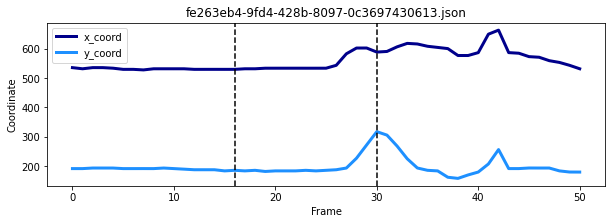

Video 592
End frame: 30


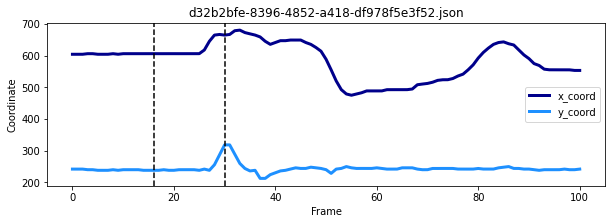

Video 593
End frame: 30


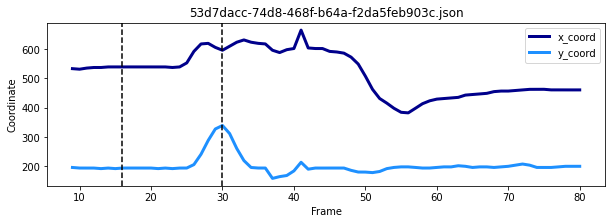

Video 594
End frame: 33


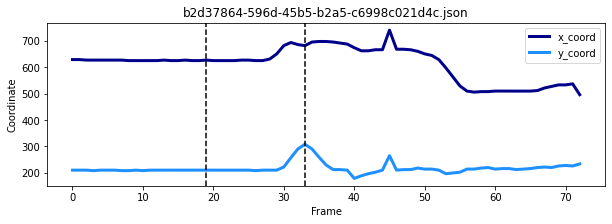

Video 595
End frame: 30


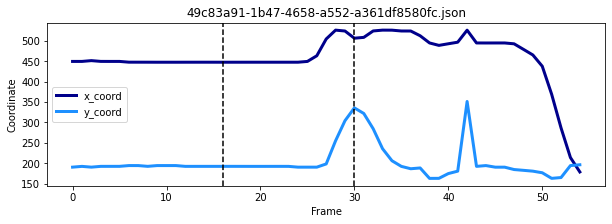

Video 596
End frame: 30


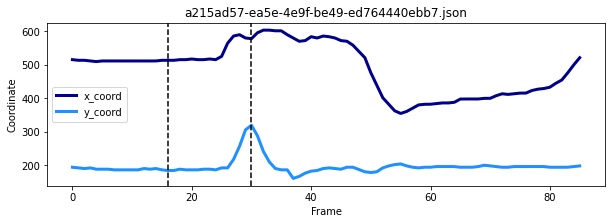

Video 597
End frame: 30


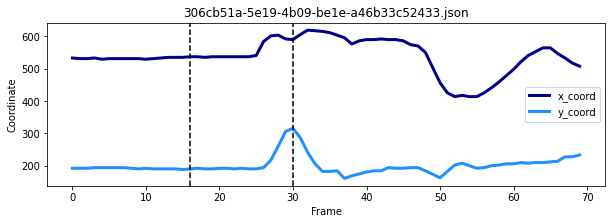

Video 598
End frame: 30


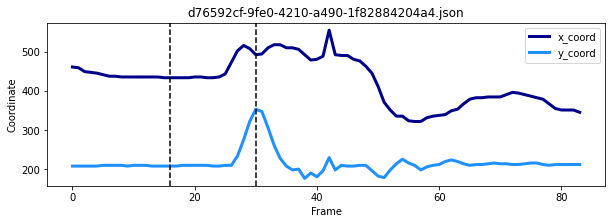

Video 599
End frame: 30


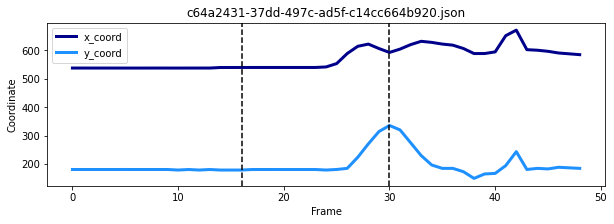

Video 600
End frame: 30
Not enough frames before knee kick.

Video 601
End frame: 32


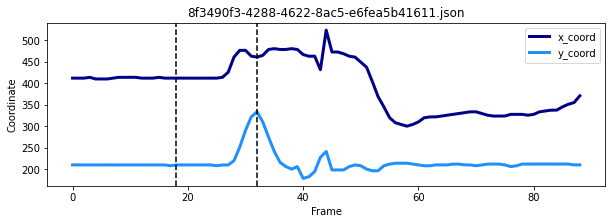

Video 602
End frame: 32


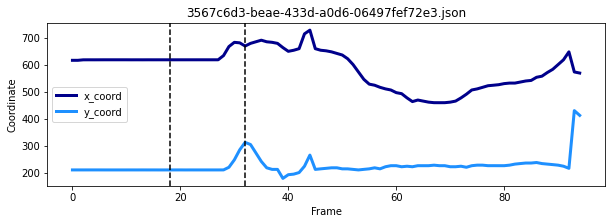

Video 603
End frame: 32


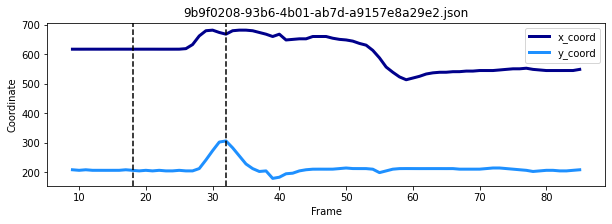

Video 604
End frame: 33
Not enough frames before knee kick.

Video 605
End frame: 33


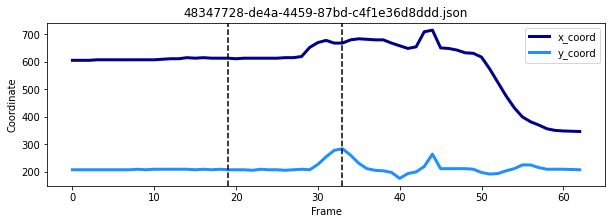

Video 606
End frame: 57


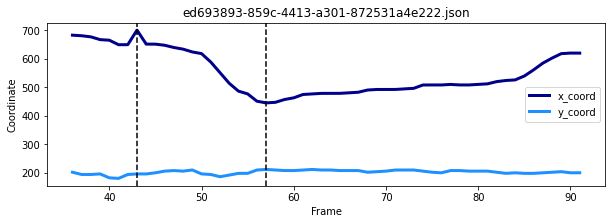

Video 607
End frame: 33


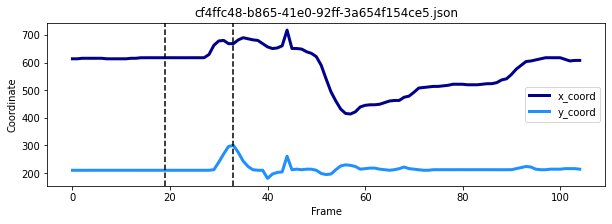

Video 608
End frame: 30


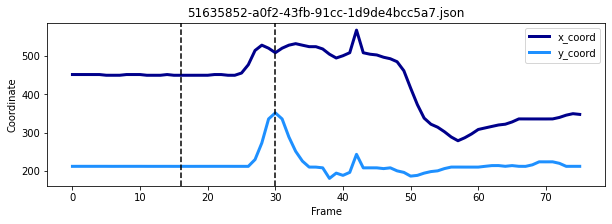

Video 609
End frame: 31


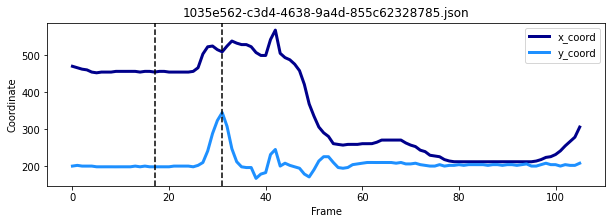

Video 610
End frame: 31


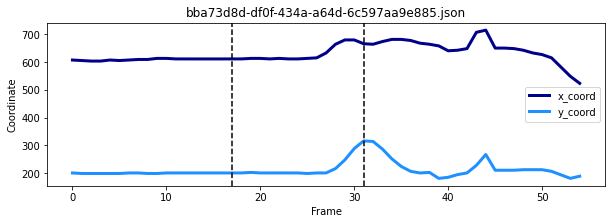

Video 611
End frame: 33


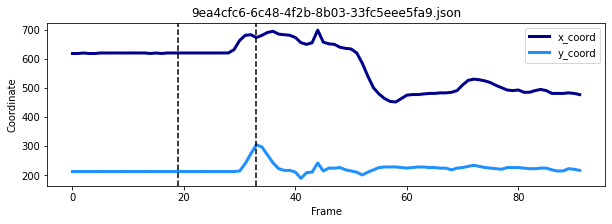

Video 612
End frame: 32


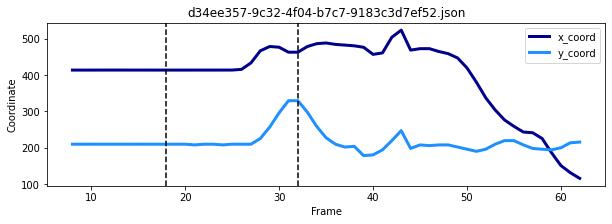

Video 613
End frame: 31


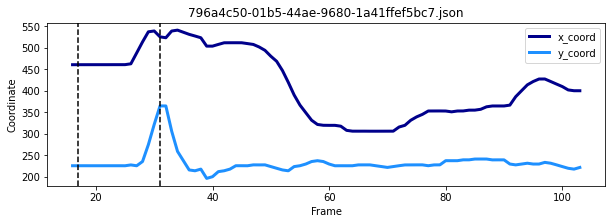

Video 614
End frame: 31
Not enough frames before knee kick.

Video 615
End frame: 32
Not enough frames before knee kick.

Video 616
End frame: 31
Not enough frames before knee kick.

Video 617
End frame: 31


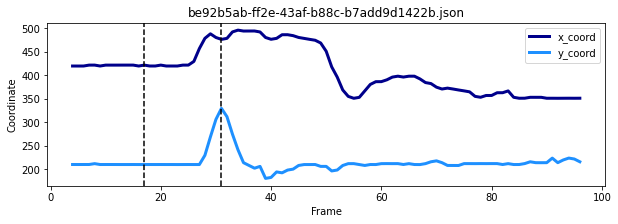

Video 618
End frame: 32


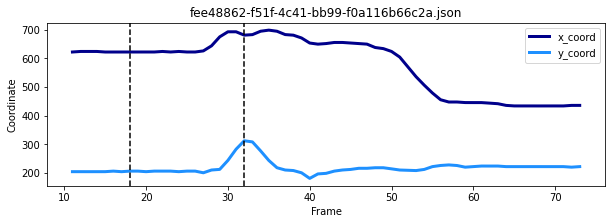

Video 619
End frame: 30


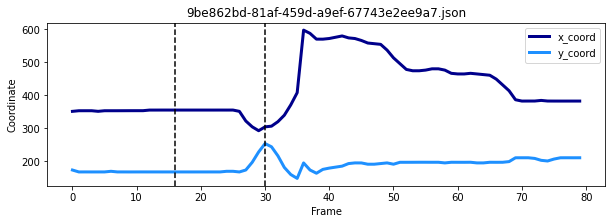

Video 620
End frame: 33


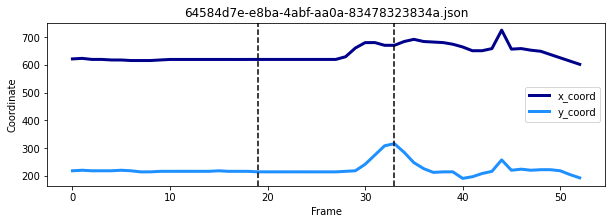

Video 621
End frame: 32


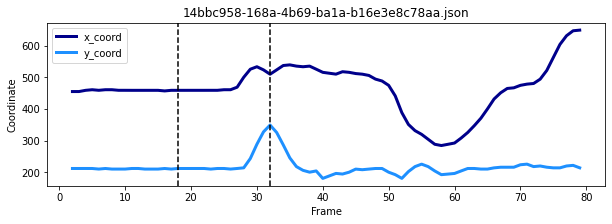

Video 622
End frame: 33


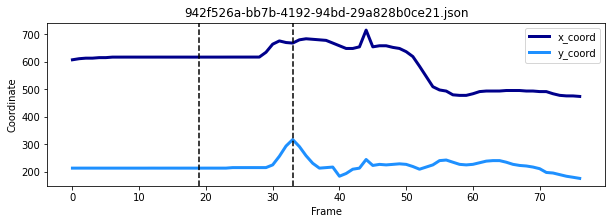

Video 623
End frame: 31


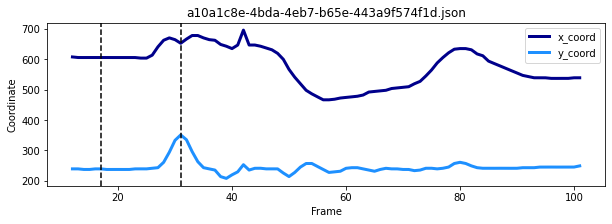

Video 624
End frame: 30


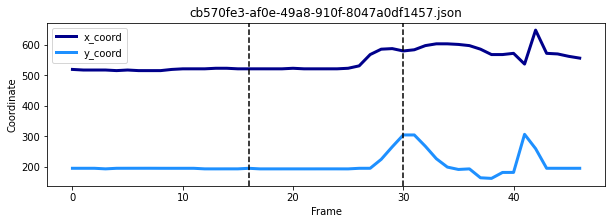

Video 625
End frame: 31


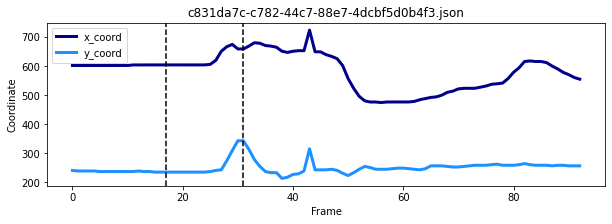

Video 626
End frame: 31


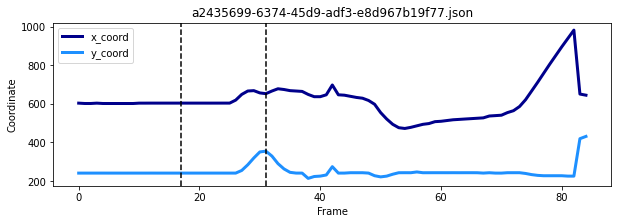

Video 627
End frame: 30
Not enough frames before knee kick.

Video 628
End frame: 34


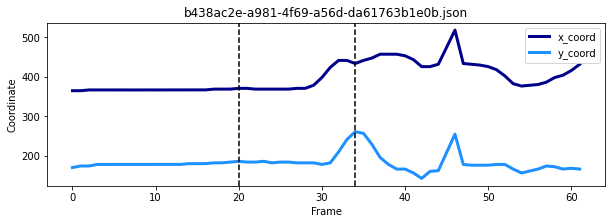

Video 629
End frame: 31


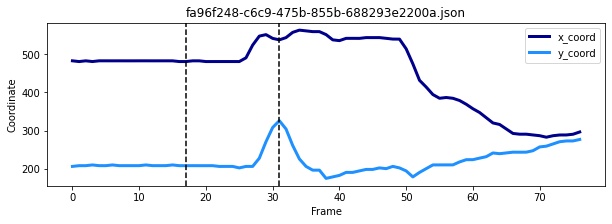

Video 630
End frame: 33


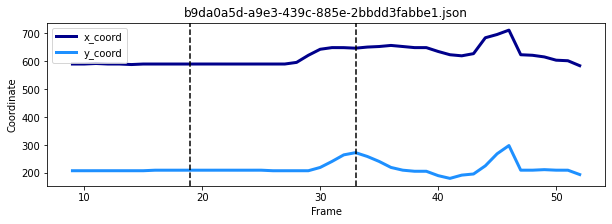

Video 631
End frame: 33
Not enough frames before knee kick.

Video 632
End frame: 33


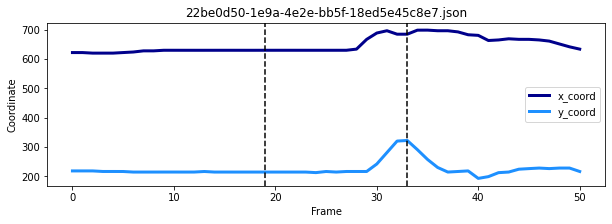

Video 633
End frame: 33


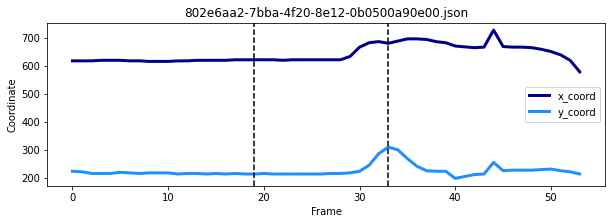

Video 634
End frame: 32


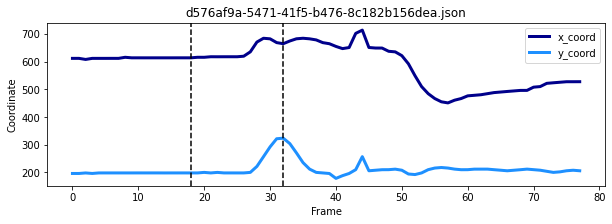

Video 635
End frame: 30


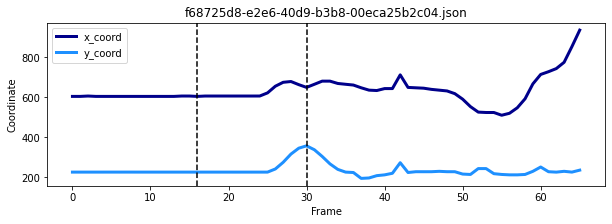

In [4]:
# Select json files for visualization
wkdir = '../data/pipeline-example-data/multiple-pitcher-example/glasnow-examples/'
files = [file for file in os.listdir(wkdir) if '.json' in file]

for i, file in enumerate(files, 1):
    
    print(f"Video {i}")
    
    # Open saved file
    f = open(f'{wkdir}/{file}')
    openpose_dict = json.load(f)    
    
    # Determine frame start and end
    start_frame, end_frame = get_frame_range(openpose_dict)
    df = pd.DataFrame(openpose_dict['LKnee'])
    df = df[df.conf > 0]
    print(f"End frame: {end_frame}")
    
    # Need to have at least 15 frames to consider pitch
    if start_frame >= min(df.frame):
        
        # Use subset_df to crop video to selected 15 frames
        #subset_df = df[df.frame.isin(list(np.arange(start_frame, end_frame + 1)))]

        # Plot
        fig, ax = plt.subplots(1, 1, figsize=(10, 3))
        plt.plot(df['frame'], df['x'], color="darkblue", linewidth=3)
        plt.plot(df['frame'], 720 - df['y'], color="dodgerblue", linewidth=3)
        plt.axvline(start_frame, color='black', linestyle='--')
        plt.axvline(end_frame, color='black', linestyle='--')
        ax.set_title(file)
        ax.set_xlabel("Frame")
        ax.set_ylabel("Coordinate")
        ax.legend(['x_coord', 'y_coord'])
        plt.show()
    
    else:
        print("Not enough frames before knee kick.\n")


# Video2Data Pipeline Visualizations

## Visualizing OpenPose Keypoint Coordinates Over Time
Here I'm creating a series of plots that represent detected keypoint coordinates over time for a single Glasnow pitch. I'll be turning this series of plots into a .gif that can be placed side-by-side with the original video and Video2Data pipeline intermediates.

In [5]:
wkdir = '../data/pipeline-example-data/frames-to-data-example/glasnow-viz'
file = '356f9ec4-3ae4-4fb5-a2dc-c7560582b16b.json'
f = open(f'{wkdir}/{file}')
openpose_dict = json.load(f)
start_frame, leg_kick = get_frame_range(openpose_dict)
end_frame = leg_kick + 10
print(f"Start Frame: {start_frame}, End Frame: {end_frame}")

Start Frame: 17, End Frame: 41


<ipython-input-6-57a399fde9bf>:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(6, 4))


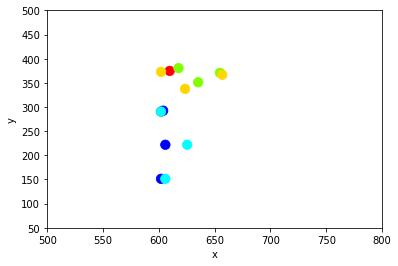

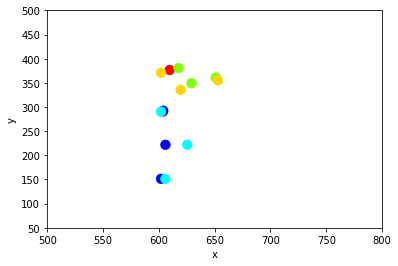

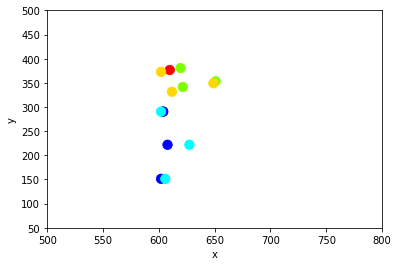

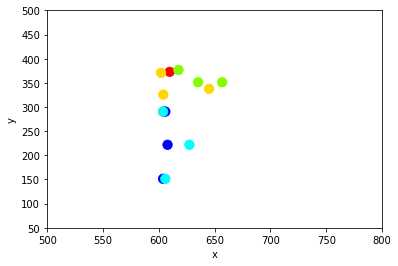

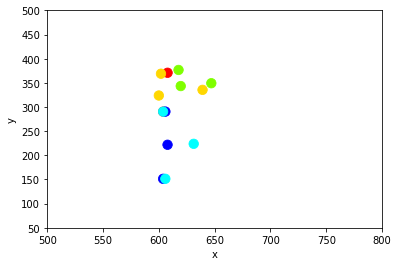

...

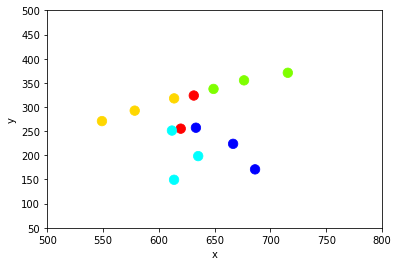

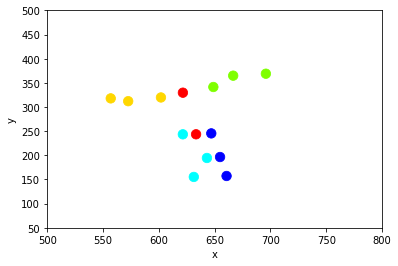

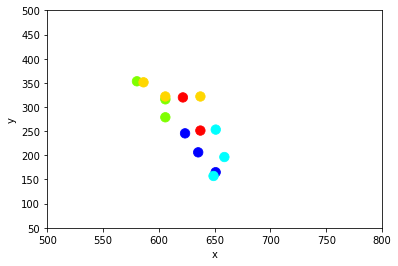

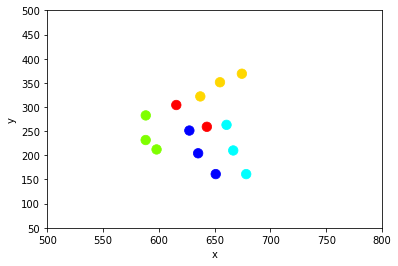

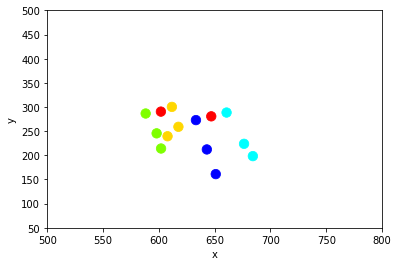

In [6]:
# Body parts to include for plotting
bodyparts = [
    'Neck', 'MidHip', 
    'LShoulder', 'LElbow', 'LWrist', 'LHip', 'LKnee', 'LAnkle', 
    'RShoulder', 'RElbow', 'RWrist', 'RHip', 'RKnee', 'RAnkle']

# Palette dictionary corresponding to openpose
bodypart_palette_dict = {
    'Neck': 'red',
    'MidHip': 'red',
    'LShoulder': 'chartreuse',
    'LElbow': 'chartreuse',
    'LWrist': 'chartreuse',
    'LHip': 'blue',
    'LKnee': 'blue',
    'LAnkle': 'blue',
    'LHeel': 'blue', 
    'LBigToe': 'blue',
    'RShoulder': 'gold',
    'RElbow': 'gold',
    'RWrist': 'gold',
    'RHip': 'cyan',
    'RKnee': 'cyan',
    'RAnkle': 'cyan',
    'RHeel': 'cyan',
    'RBigToe': 'cyan',
    'REar': 'magenta',
    'Nose': 'magenta'}

# Set palette for plots
bodypart_palette = [bodypart_palette_dict[bodypart] for bodypart in bodyparts]

# Store output image names for conversion to mp4
images = []

# Plot pose coordinates for each frame in pitch
for frame in range(start_frame, end_frame+1):
    
    # Make data frame of desired pose positions at desired frame range
    frame_df = pd.DataFrame()
    for bodypart in bodyparts:
        df = pd.DataFrame(openpose_dict[bodypart])
        df = df[df.frame == frame]
        df['bodypart'] = bodypart
        frame_df = pd.concat([frame_df, df])
    frame_df = frame_df[frame_df.conf != 0]
    frame_df['y'] = 720 - frame_df.y # Flip y
    
    # Plot
    fig = plt.figure(figsize=(6, 4))
    ax = sns.scatterplot(data=frame_df, x='x', y='y', palette=bodypart_palette, hue='bodypart', s=90, edgecolor=None, legend=False)
    ax.set(xlim=(500, 800), ylim=(50, 500))
    fig.savefig(f"{wkdir}/plots/glasnow-pose-plot-{frame}.png", facecolor="white", bbox_inches="tight")
    images.append(f"glasnow-pose-plot-{frame}.png")
    
    

## Converting Series of Images/Blurred Images/Plots to mp4s

In [7]:
# Set working directory
wkdir = "../data/pipeline-example-data/frames-to-data-example/glasnow-viz"

# Set file types
file_types = {
    "images": ".jpg",
    "blurred": ".blurred.jpg",
    "plots": ".png"}

# Images
images_to_mp4(
    image_dir=f"{wkdir}/images", 
    video_path=f"{wkdir}/videos/images-vid.mp4", 
    file_ext=file_types["images"])

# Blurred images
images_to_mp4(
    image_dir=f"{wkdir}/blurred_images", 
    video_path=f"{wkdir}/videos/blur-vid.mp4", 
    file_ext=file_types["blurred"])

# Plots
images_to_mp4(
    image_dir=f"{wkdir}/plots", 
    video_path=f"{wkdir}/videos/plots-vid.mp4", 
    file_ext=file_types["plots"])


## Final Video2Data Visualizations
Below are .gifs showing the input images, intermediate images (generated using Detectron2), and pose estimation data from the Video2Data pipeline.

NOTE: mp4s were converted to gifs with https://ezgif.com/video-to-gif

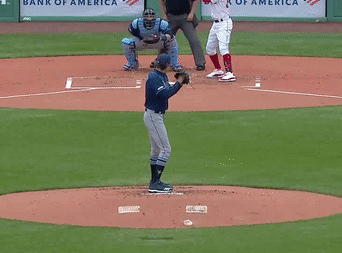

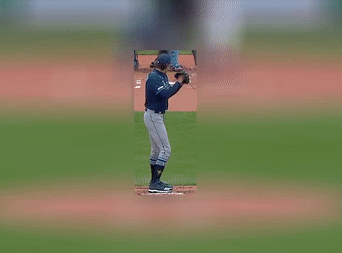

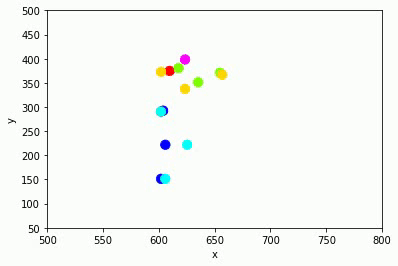

In [9]:
# Display GIFs
from IPython.display import Image
display(Image(open(f'{wkdir}/gifs/gif-vid.gif','rb').read()))
display(Image(open(f'{wkdir}/gifs/gif-blur.gif','rb').read()))
display(Image(open(f'{wkdir}/gifs/gif-plots.gif','rb').read()))

# LKnee Time Series Example Visual
Below I'm showing the x and y coordinates of Walker Buehler's left knee over the progression of a random pitch. We show this along side the original visual to show that the y_coord max corresponds to the frame in which Buehler's knee is at it's apex.

## Plot Generation

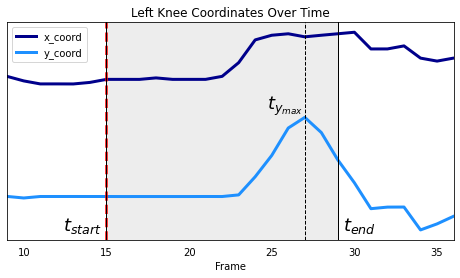

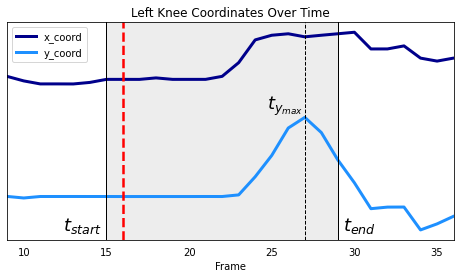

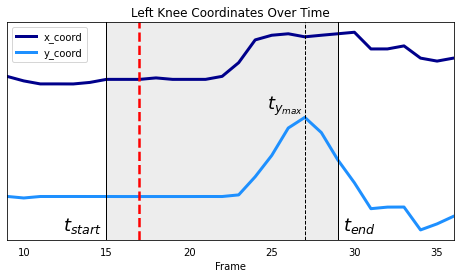

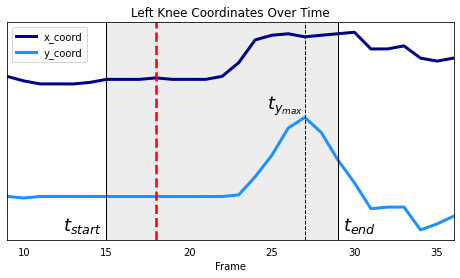

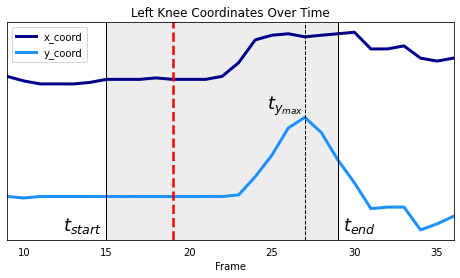

...

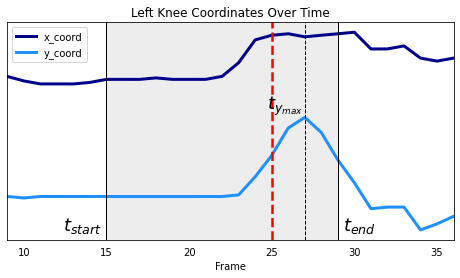

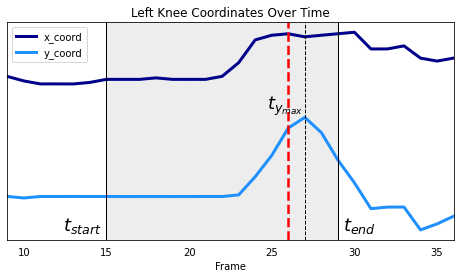

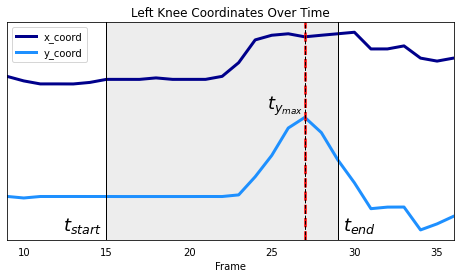

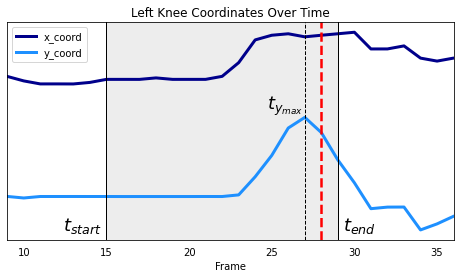

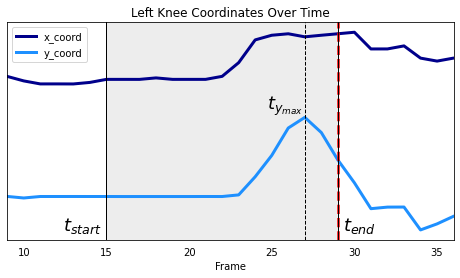

In [68]:
# Open saved file
wkdir = '../data/pipeline-example-data/frames-to-data-example/buehler-lknee-viz'
f = open(f"{wkdir}/5b6cc9bb-6ef8-4582-86a5-88b59eeaef41.json")
openpose_dict = json.load(f)

# Determine frame range
start_frame, end_frame = get_frame_range(openpose_dict)
start_frame = start_frame + 2
end_frame = end_frame + 2

# Get df and subdf
df = pd.DataFrame(openpose_dict['LKnee'])
df = df[df.frame.isin(list(np.arange(0, 40)))]
subset_df = df[df.frame.isin(list(np.arange(start_frame, end_frame + 1)))]

images = []

# Plot
for frame in list(np.arange(start_frame, end_frame + 1)):
    fig, ax = plt.subplots(1, 1, figsize=(8, 4))
    plt.plot(df['frame'], df['x'], color="darkblue", linewidth=3)
    plt.plot(df['frame'], 720 - df['y'], color="dodgerblue", linewidth=3)
    plt.axvline(frame, color='red', linestyle='--', linewidth=2.5)
    plt.axvline(start_frame, color='black', linestyle='-', linewidth=1)
    plt.axvline(end_frame-2, color='black', linestyle='--', linewidth=1)
    plt.axvline(end_frame, color='black', linestyle='-', linewidth=1)
    plt.tick_params(left=False, labelleft=False, bottom=False)
    plt.xticks([10, 15, 20, 25, 30, 35])
    ax.text(12.4, 230, '$t_{start}$', fontsize=18)
    ax.text(24.7, 385, '$t_{y_{max}}$', fontsize=18)
    ax.text(29.3, 230, '$t_{end}$', fontsize=18)
    ax.set_xlim(9, 36)
    ax.set_xlabel("Frame")
    ax.axvspan(start_frame, end_frame, ymin=0, ymax=1, alpha=0.4, color='lightgrey')
    ax.legend(['x_coord', 'y_coord'])
    ax.set_title("Left Knee Coordinates Over Time")
    
    # Save plot
    fig.savefig(f"{wkdir}/plots-lknee/buehler-lknee-pose-plot-{frame}.png", facecolor="white", bbox_inches="tight")
    images.append(f"buehler-lknee-pose-plot-{frame}.png")
    

## Converting Series of Images/Blurred Images/Plots to mp4s

In [69]:
# Plots to mp4
images_to_mp4(
    image_dir=f"{wkdir}/plots-lknee", 
    video_path=f"{wkdir}/videos-lknee/plots-vid.mp4", 
    file_ext=file_types["plots"])

# Images to mp4
images_to_mp4(
    image_dir=f"{wkdir}/images-lknee", 
    video_path=f"{wkdir}/videos-lknee/images-vid.mp4", 
    file_ext=file_types["images"])

## Final LKnee Time Series Visualization

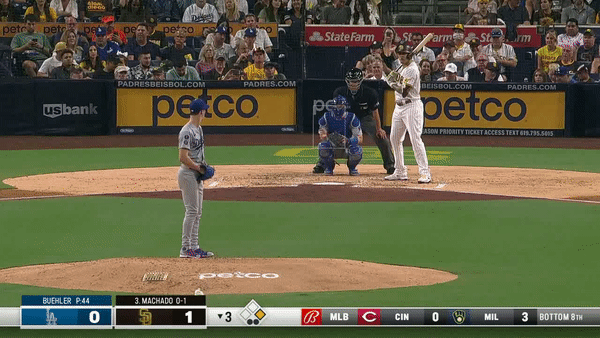

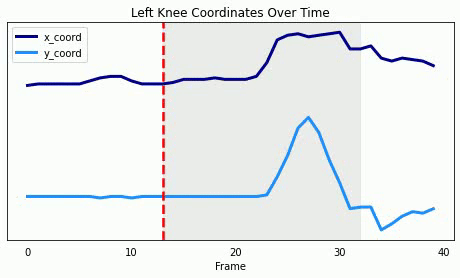

In [70]:
# Display GIFs
from IPython.display import Image
display(Image(open(f'{wkdir}/gifs-lknee/gif-images.gif','rb').read()))
display(Image(open(f'{wkdir}/gifs-lknee/gif-plots.gif','rb').read()))